This script performs the analysis of the proteomics data at 4 h.

In [1]:
import pandas, numpy, seaborn, matplotlib_venn

In [2]:
import sklearn, sklearn.preprocessing, sklearn.decomposition
import scipy, scipy.signal
import statsmodels, statsmodels.stats, statsmodels.stats.multitest

In [3]:
import matplotlib, matplotlib.pyplot
matplotlib.rcParams.update({'font.family':'sans-serif',
                            'font.size':20, 
                            'xtick.labelsize':30, 
                            'ytick.labelsize':30, 
                            'figure.figsize':(16, 9), 
                            'axes.labelsize':40})

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import mygene
mygenedb = mygene.MyGeneInfo()

### user-defined variables

In [6]:
four_input_file = '/home/adrian/projects/vigur/data/proteomics/HPMVEC_Proteomics_September_2022/HPMVECs_september2022_4h_all_prts_Relative_Quantification.csv'
twentyfour_input_file = '/home/adrian/projects/vigur/data/proteomics/HPMVEC_Proteomics_September_2022/HPMVECs_september2022_24h_all_prts_Relative_Quantification.csv'

In [7]:
output_dir = '/home/adrian/projects/vigur/results/proteomics/'

In [8]:
# biomarkers
biomarkers = {
    'endothelin':'P05305',
    'PAI-1':'P05121',
    'uPA':'P00749',
    'VCAM-1':'P19320',
    'L-selectin':'P14151',
    'Ang2':'O15123',
    'VEGFr1':'P17948',
    'ICAM-2':'P13598',
    'tie2':'Q02763',
    'IL-6':'P05231',
    'E-selectin':'P16581',
    'ICAM-1':'P05362',
    'P-selectin':'P16109',
    'Ang1':'Q15389',
    'vWF':'P04275',
    'PDGF':'P01127',
    'endocan':'Q9NQ30',
    'TNFa':'P01375',
    'VEGFa':'P15692'
}

### define metadata

In [9]:
metadata = {}

metadata['4h control'] = ['20220905_ARNAR_010', '20220905_ARNAR_011', '20220905_ARNAR_035', '20220905_ARNAR_036', '20220905_ARNAR_058', '20220905_ARNAR_059']

metadata['4h epi'] = ['20220905_ARNAR_004', '20220905_ARNAR_005', '20220905_ARNAR_008', '20220905_ARNAR_009', '20220905_ARNAR_051', '20220905_ARNAR_052']


metadata['4h nor'] = ['20220905_ARNAR_013', '20220905_ARNAR_014', '20220905_ARNAR_019', '20220905_ARNAR_020', '20220905_ARNAR_044', '20220905_ARNAR_046']

metadata['4h epinor'] = ['20220905_ARNAR_024', '20220905_ARNAR_025', '20220905_ARNAR_026', '20220905_ARNAR_027']

metadata['4h TNFa'] = ['20220905_ARNAR_060', '20220905_ARNAR_065']

all_sample_names = [element for sublist in list(metadata.values()) for element in sublist]
print(len(all_sample_names))

24


### read data

In [10]:
df4 = pandas.read_csv(four_input_file, index_col=0, skiprows=2, sep=',')
df4.shape

(3183, 85)

In [11]:
df4.loc[['P05121', 'P13598', 'P05362'], ]

,Peptide count,Unique peptides,Confidence score,Anova (p),q Value,Max fold change,Power,Highest mean condition,Lowest mean condition,Mass,...,20220905_ARNAR_044.2,20220905_ARNAR_046.2,20220905_ARNAR_024.2,20220905_ARNAR_025.2,20220905_ARNAR_026.2,20220905_ARNAR_027.2,20220905_ARNAR_060.2,20220905_ARNAR_065.2,no unique peptides,confidence<40
Accession,,,,,,,,,,,,,,,,,,,,,
P05121,41,19,215.7082,0.075943,0.024041,1.455217,0.602788,NorEPI 4h,Nor 4h,45117.1340,...,0,0,16,14,12,0,0,0,NaN,NaN
P13598,13,4,73.0967,0.143520,0.032430,1.399022,0.706830,TNFa 4h,NorEPI 4h,31167.6061,...,0,0,1,0,0,0,0,0,NaN,NaN
P05362,7,2,38.8919,0.037111,0.017843,2.982438,0.869784,TNFa 4h,Ctrl 4h,58623.6603,...,0,0,0,0,0,0,0,0,NaN,x


In [12]:
df24 = pandas.read_csv(twentyfour_input_file, index_col=0, skiprows=2, sep=',')
df24.shape

(2686, 83)

In [13]:
rosetta = {}
for element in df4.index:
    description = df4.loc[element, 'Description'].split(' OS')[0]
    if element not in rosetta:
        rosetta[element] = description
print(df4.shape, len(rosetta))

for element in df24.index:
    description = df24.loc[element, 'Description'].split(' OS')[0]
    if element not in rosetta:
        rosetta[element] = description
print(df24.shape, len(rosetta))

(3183, 85) 3183
(2686, 83) 3760


### manipulate data

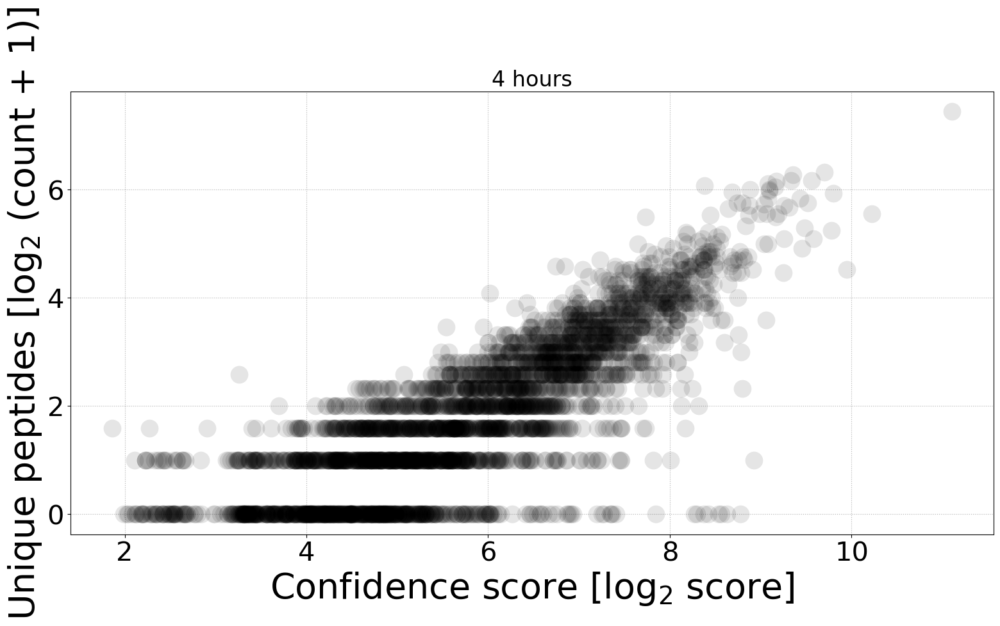

In [14]:
x = numpy.log2(df4['Confidence score'])
y = numpy.log2(df4['Unique peptides']+1)
               
matplotlib.pyplot.plot(x, y, 'o', color='black', alpha=1/10, markeredgecolor='None', ms=20)

matplotlib.pyplot.xlabel('Confidence score [log$_2$ score]')
matplotlib.pyplot.ylabel('Unique peptides [log$_2$ (count + 1)]')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('4 hours')
matplotlib.pyplot.tight_layout()

Arbitrary thresholds for confident identifications:
- X-axis: log2 CS = 7 which represents a 2\**7 = 128 score.
- Y-axis: log2 unique peptides + 1 = 3 which represents a 2\**(3)-1 = 7 unique peptides.

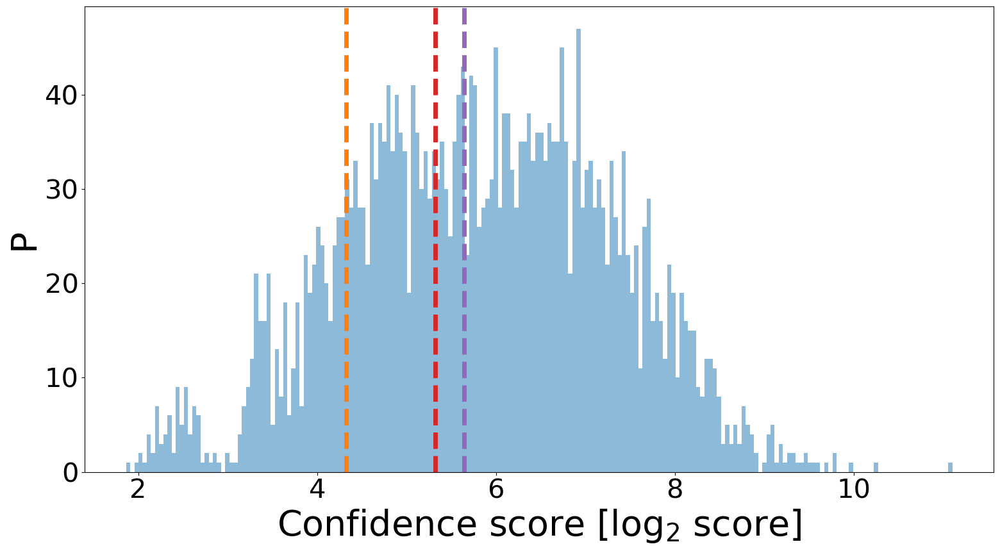

In [15]:
matplotlib.pyplot.hist(numpy.log2(df4['Confidence score']), bins=200, alpha=1/2)
matplotlib.pyplot.axvline(x=numpy.log2(20), lw=5, ls='--', color='tab:orange')
matplotlib.pyplot.axvline(x=numpy.log2(40), lw=5, ls='--', color='tab:red')
matplotlib.pyplot.axvline(x=numpy.log2(50), lw=5, ls='--', color='tab:purple')
matplotlib.pyplot.xlabel('Confidence score [log$_2$ score]')
matplotlib.pyplot.ylabel('P')
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

In [16]:
new4 = df4[(df4['Unique peptides'] >= 3) & (df4['Confidence score'] >= 50)]
print(new4.shape)

working_labels = [label for label in new4.columns if label in all_sample_names]

new4 = numpy.log2(new4.loc[:, working_labels] + 1)
print(new4.shape)
new4

(1400, 85)
(1400, 24)


,20220905_ARNAR_004,20220905_ARNAR_005,20220905_ARNAR_008,20220905_ARNAR_009,20220905_ARNAR_051,20220905_ARNAR_052,20220905_ARNAR_010,20220905_ARNAR_011,20220905_ARNAR_035,20220905_ARNAR_036,...,20220905_ARNAR_019,20220905_ARNAR_020,20220905_ARNAR_044,20220905_ARNAR_046,20220905_ARNAR_024,20220905_ARNAR_025,20220905_ARNAR_026,20220905_ARNAR_027,20220905_ARNAR_060,20220905_ARNAR_065
Accession,,,,,,,,,,,,,,,,,,,,,
P07996,16.045552,16.078366,16.161570,16.156538,16.229749,16.211154,15.643942,15.675235,15.817460,15.806405,...,16.285414,16.314586,16.509939,16.298168,16.384911,16.406426,16.328664,16.354238,16.145720,16.125135
Q9BYC5,9.957537,9.846812,9.972054,9.924427,9.952922,9.961175,10.160242,10.292097,10.272115,10.290766,...,9.578374,9.437409,9.463392,9.974018,9.961175,9.920405,10.057480,10.042144,8.788501,9.464314
P17612,11.366183,11.371677,11.502530,11.458926,11.281645,11.490084,10.982659,11.018419,11.036613,11.051132,...,11.340180,11.419755,11.470207,11.197037,11.516587,11.553508,11.419025,11.508235,11.170605,10.904918
Q9NVA2,12.240767,12.273150,12.230812,12.246755,12.321591,12.283944,12.229056,12.302041,12.452724,12.257791,...,12.362618,12.350376,12.322057,12.265512,12.272261,12.319145,12.297600,12.287144,12.600883,12.612712
P09382,16.043690,16.115637,16.117788,16.162780,16.369342,16.357563,16.185005,16.186321,16.538914,16.523372,...,16.308708,16.349512,16.634492,16.594343,16.689482,16.719676,16.648384,16.712877,17.017069,16.935930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P08240,11.285331,11.255580,10.993814,11.011575,11.726454,11.892376,11.074597,11.051692,11.468444,11.367476,...,11.134844,11.174485,11.480555,11.168212,11.269374,11.343284,11.417818,11.439900,11.334302,11.365686
Q15181,12.069411,12.079153,12.072432,12.126384,12.391033,12.391620,12.072226,12.071841,12.168879,12.141165,...,12.004368,12.028826,12.534314,12.352118,12.185070,12.160218,12.301388,12.225533,12.208704,12.218002
O94929,11.100895,11.061101,10.985095,10.966830,11.556627,11.706831,11.139484,11.076676,11.281246,11.196087,...,11.226472,11.256388,11.376595,11.075525,11.221480,11.249041,11.284186,11.286898,11.430896,11.106758


### biomarkers analysis

In [17]:
detected_biomarkers = {}
for biomarker in biomarkers.keys():
    uniprot_id = biomarkers[biomarker]
    print('working with biomarker {}, uniprot {}'.format(biomarker, uniprot_id))
    for element in df4.index:
        if uniprot_id in element:
            print('\t{}, peptide count {}, score {}'.format(element, df4.loc[element, 'Unique peptides'], df4.loc[element, 'Confidence score']))
            detected_biomarkers[element] = biomarker

detected_biomarkers.keys()

working with biomarker endothelin, uniprot P05305
working with biomarker PAI-1, uniprot P05121
	P05121, peptide count 19, score 215.7082
working with biomarker uPA, uniprot P00749
working with biomarker VCAM-1, uniprot P19320
working with biomarker L-selectin, uniprot P14151
working with biomarker Ang2, uniprot O15123
working with biomarker VEGFr1, uniprot P17948
working with biomarker ICAM-2, uniprot P13598
	P13598, peptide count 4, score 73.0967
working with biomarker tie2, uniprot Q02763
working with biomarker IL-6, uniprot P05231
working with biomarker E-selectin, uniprot P16581
working with biomarker ICAM-1, uniprot P05362
	P05362, peptide count 2, score 38.8919
working with biomarker P-selectin, uniprot P16109
working with biomarker Ang1, uniprot Q15389
working with biomarker vWF, uniprot P04275
working with biomarker PDGF, uniprot P01127
working with biomarker endocan, uniprot Q9NQ30
working with biomarker TNFa, uniprot P01375
working with biomarker VEGFa, uniprot P15692


dict_keys(['P05121', 'P13598', 'P05362'])

(1725, 85)
(1725, 24)
P05121 4h control
P05121 4h epi
P05121 4h nor
P05121 4h epinor
P05121 4h TNFa
PAI-1 [16.3832417056705, 16.25073217723727, 16.05110504365731, 16.560087582443636, 15.911607289679079]
P13598 4h control
P13598 4h epi
P13598 4h nor
P13598 4h epinor
P13598 4h TNFa
ICAM-2 [11.30708491293669, 11.152889753244269, 11.283341130695469, 11.026727007720375, 11.427917779712786]
P05362 4h control
P05362 4h epi
P05362 4h nor
P05362 4h epinor
P05362 4h TNFa
ICAM-1 [8.997995631411488, 9.680851805483684, 9.821697572475937, 9.378187612041048, 10.413116187652733]
{'PAI-1': [0.0, -0.1325095284332285, -0.33213666201319114, 0.176845876773136, -0.47163441599142075], 'ICAM-2': [0.0, -0.1541951596924207, -0.023743782241220757, -0.28035790521631476, 0.12083286677609628], 'ICAM-1': [0.0, 0.6828561740721959, 0.8237019410644493, 0.3801919806295597, 1.415120556241245]}


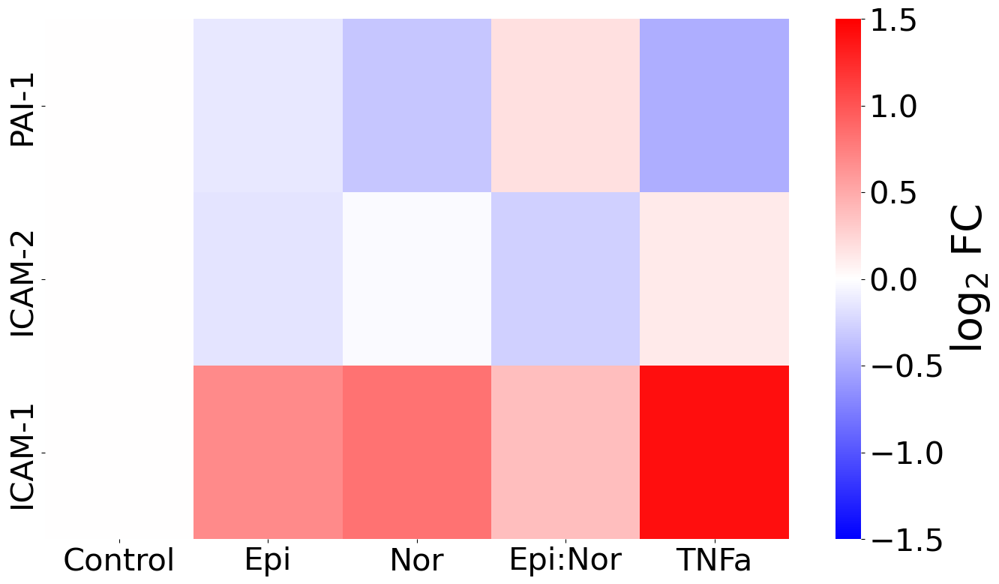

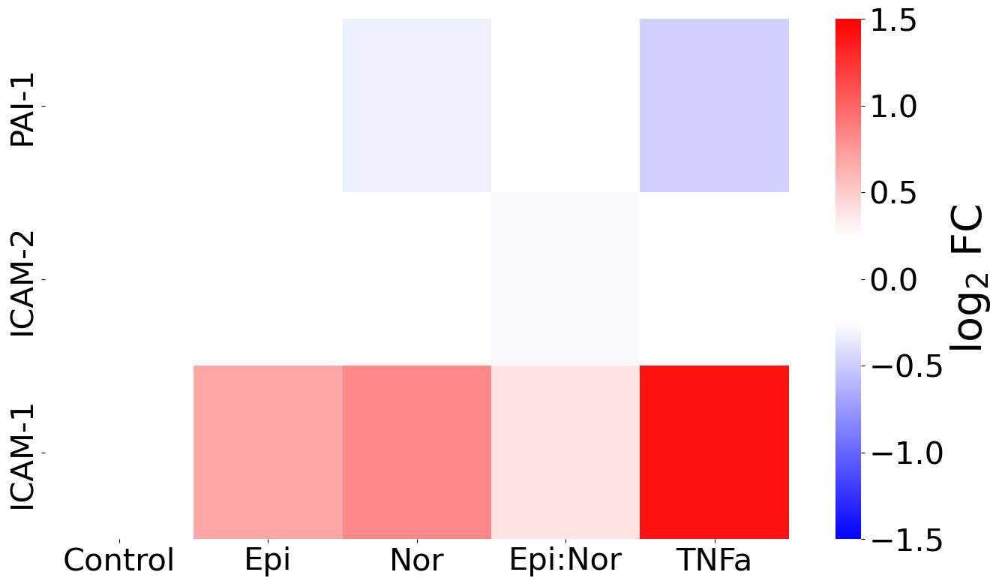

In [18]:
# P05362, peptide count 2, score 38.8919
biomarkers_df = df4[(df4['Unique peptides'] >= 2) & (df4['Confidence score'] >= 38)]
print(biomarkers_df.shape)
biomarkers_df = numpy.log2(biomarkers_df.loc[:, working_labels] + 1)
print(biomarkers_df.shape)

### normalization
# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(biomarkers_df.values, axis=0), index=biomarkers_df.index, columns=biomarkers_df.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qnbiodf = biomarkers_df.rank(method="min").stack().astype(int).map(df_mean).unstack()

# gererate data for heatmap
heatmap_data = {}
for marker in detected_biomarkers.keys():
    heatmap_data[detected_biomarkers[marker]] = []
    for treatment in metadata.keys():
        print(marker, treatment)
        log2_intensity = numpy.median(qnbiodf.loc[marker, metadata[treatment]].values)
        heatmap_data[detected_biomarkers[marker]].append(log2_intensity)
    print(detected_biomarkers[marker], heatmap_data[detected_biomarkers[marker]])

for biomarker in heatmap_data:
    reference = heatmap_data[biomarker][0]
    for i in range(len(heatmap_data[biomarker])):
        heatmap_data[biomarker][i] = heatmap_data[biomarker][i] - reference
print(heatmap_data)
heatmap_df = pandas.DataFrame.from_dict(heatmap_data).transpose()
heatmap_df.columns = ['Control', 'Epi', 'Nor', 'Epi:Nor', 'TNFa']

colors = [(0, "blue"), (0.5-(1/12), "white"), (0.5+(1/12), "white"), (1, "red")]
bwwr = matplotlib.colors.LinearSegmentedColormap.from_list("bwwr", colors)

seaborn.heatmap(data=heatmap_df, cmap='bwr', vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

seaborn.heatmap(data=heatmap_df, cmap=bwwr, vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

- PAI-1 is upregulated by adrenaline [https://pubmed.ncbi.nlm.nih.gov/11792849/]
- adrenaline at 10 and 100 μmol/l, but not at 1 μmol/l significantly increased the expression of E-selectin, Icam1 and Vcam1 on HUVEC [https://link.springer.com/article/10.1007/s00125-011-2141-5]

### visualize data

200
19.492541086884188


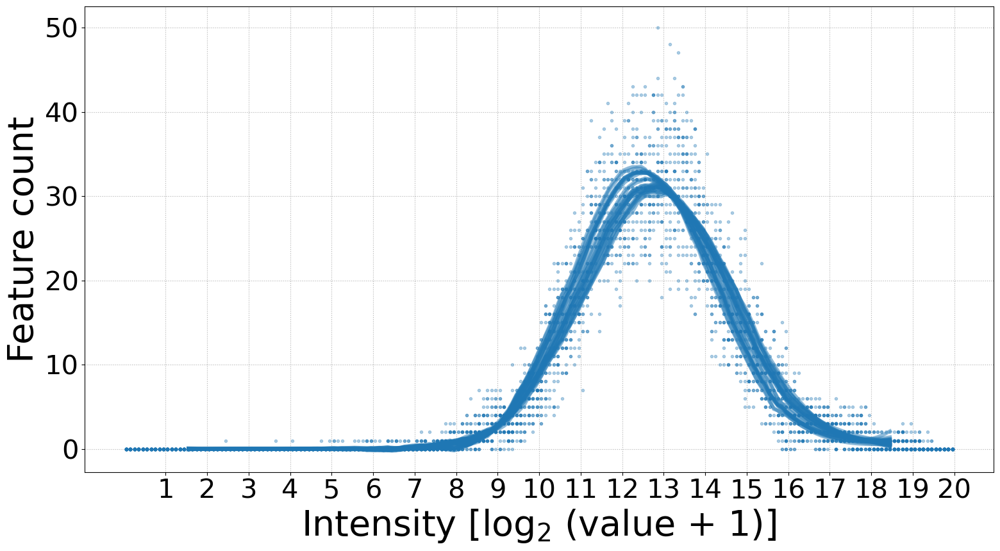

In [19]:
found_max = 20
number_of_bins = found_max * 10
margin = 15
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in new4.columns:
        
    intensities = new4.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:blue'
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)

matplotlib.pyplot.xticks(range(1, 21))
matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.tight_layout()

### normalization

In [20]:
#
# quantile normalization 
# taken from https://cmdlinetips.com/2020/06/computing-quantile-normalization-in-python/
#

# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(new4.values, axis=0), index=new4.index, columns=new4.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = new4.rank(method="min").stack().astype(int).map(df_mean).unstack()

### distributions after normalization

200
19.071343768957153


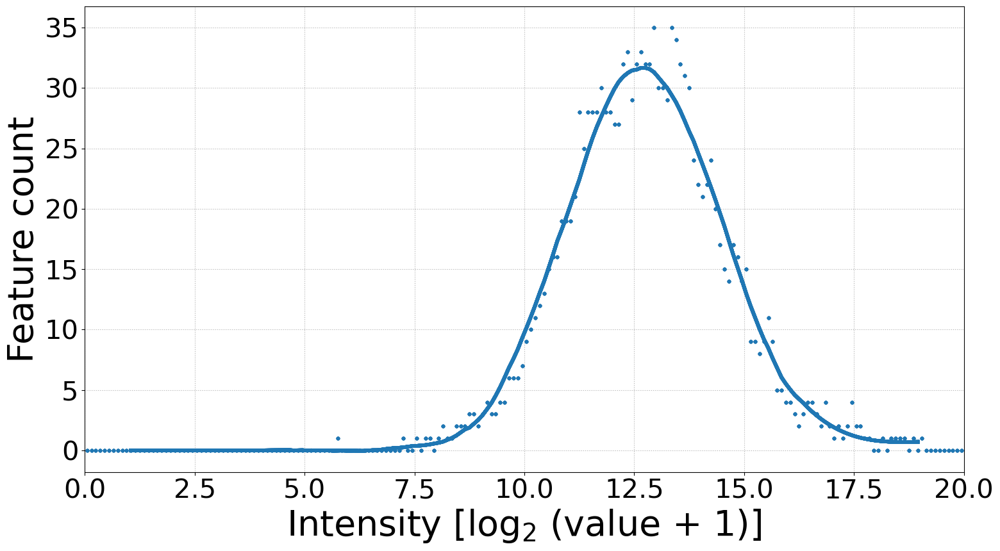

In [21]:
found_max = 20
number_of_bins = found_max * 10
margin = 10
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in qndf.columns:
        
    intensities = qndf.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:blue'
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)
matplotlib.pyplot.xlim(0,20)

matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.tight_layout()

### PCA

[0.31915297 0.15906583]


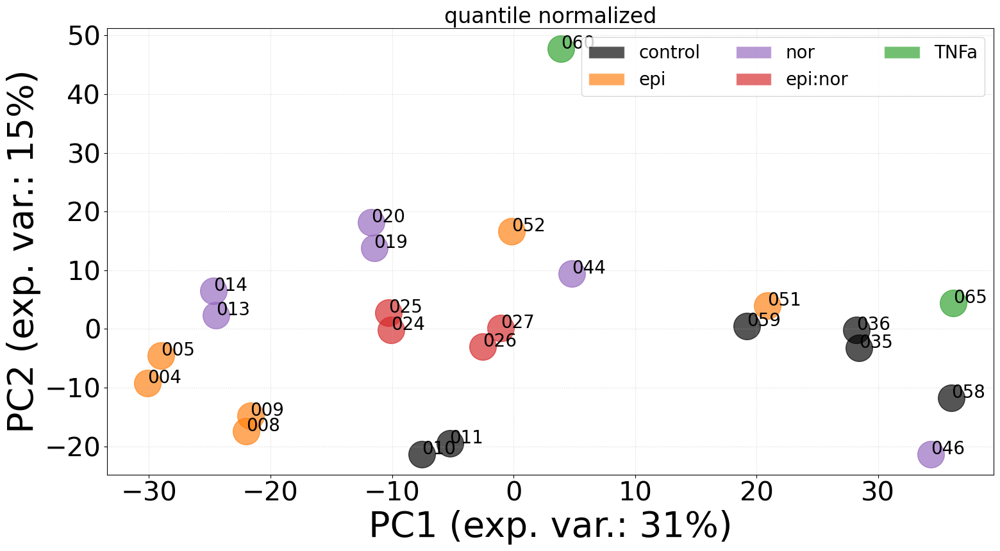

In [22]:
# quantile normalized all
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
        
    if qndf.columns[i] in metadata['4h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['4h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['4h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['4h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['4h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    
    the_label = qndf.columns[i].split('_')[-1]
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('quantile normalized')
matplotlib.pyplot.tight_layout()

[0.54971548 0.11732986]


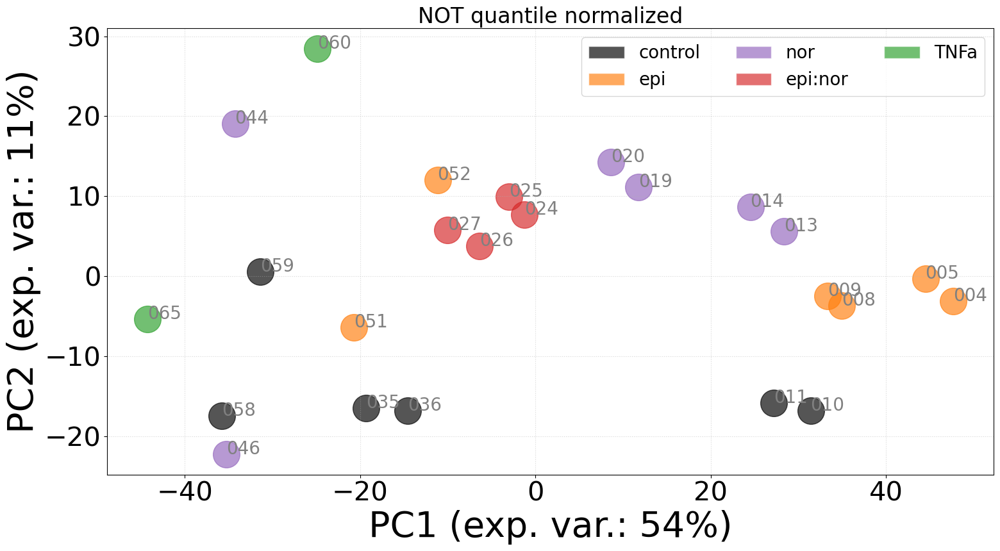

In [23]:
# non-quantile normalized all
transpose = new4.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
        
    if qndf.columns[i] in metadata['4h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['4h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['4h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['4h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['4h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
        
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    
    the_label = new4.columns[i].split('_')[-1]
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label, color='gray')
    
legend_elements = [
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('NOT quantile normalized')

matplotlib.pyplot.tight_layout()

10
['20220905_ARNAR_060', '20220905_ARNAR_065', '20220905_ARNAR_052', '20220905_ARNAR_044', '20220905_ARNAR_051', '20220905_ARNAR_059', '20220905_ARNAR_036', '20220905_ARNAR_035', '20220905_ARNAR_058', '20220905_ARNAR_046']
[0.27369339 0.23548323]


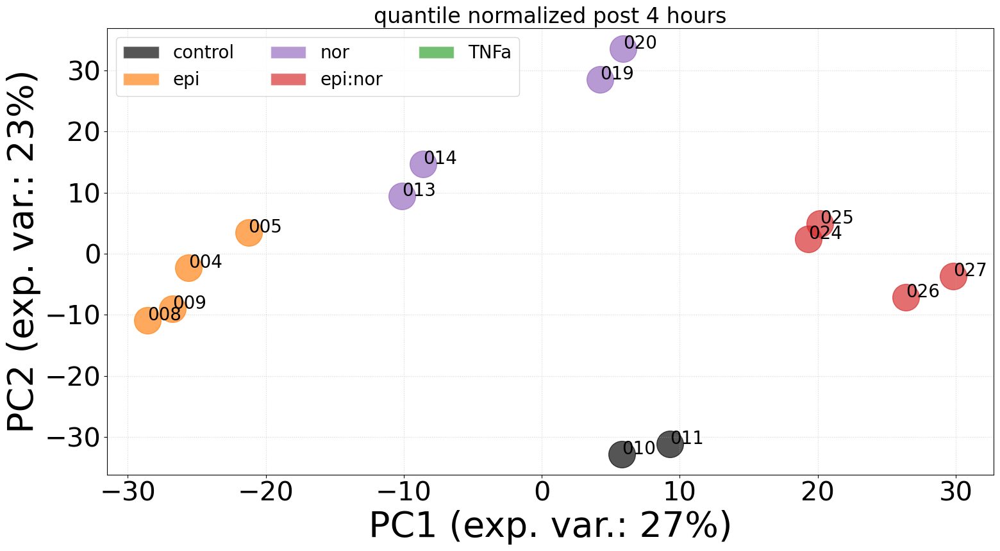

In [24]:
# excluding arbitrary samples
excluded_sample_tags = ['060', '065', '052', '044', '051', '059', '036', '035', '058', '046']
print(len(excluded_sample_tags)) # should be 10
excluded_samples = ['20220905_ARNAR_' + element for element in excluded_sample_tags]
print(excluded_samples)
simplified_df = new4.drop(excluded_samples, axis=1)

# normalization
# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(simplified_df.values, axis=0), index=simplified_df.index, columns=simplified_df.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = simplified_df.rank(method="min").stack().astype(int).map(df_mean).unstack()

# PCA
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
    the_label = qndf.columns[i].split('_')[-1]
        
    if simplified_df.columns[i] in metadata['4h control']:
        the_color = 'black'
    elif simplified_df.columns[i] in metadata['4h epi']:
        the_color = 'tab:orange'
    elif simplified_df.columns[i] in metadata['4h nor']:
        the_color = 'tab:purple'
    elif simplified_df.columns[i] in metadata['4h epinor']:
        the_color = 'tab:red'
    elif simplified_df.columns[i] in metadata['4h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('quantile normalized post 4 hours')
matplotlib.pyplot.tight_layout()

### make comparisons

In [25]:
def comparison_function(time_label, detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples):
    
    # f.1. determine P values
    fold_changes = []; pvalues = []

    for protein in qndf.index:
        control_values = qndf.loc[protein, control_samples].values
        treated_values = qndf.loc[protein, treated_samples].values

        log2FC = numpy.median(treated_values) - numpy.median(control_values)
        statistic, pvalue = scipy.stats.ttest_ind(control_values, treated_values)
        # dealing with exact same values on two samples
        if numpy.isnan(pvalue):
            pvalue = 1
        fold_changes.append(log2FC); pvalues.append(pvalue)

    print('P before correction', numpy.min(pvalues), numpy.max(pvalues))
    
    # f.2. Bonferroni correction
    significance_threshold = -numpy.log10(0.05/qndf.shape[0])
    a = numpy.array(pvalues)
    epsilon = -numpy.log10(numpy.min(a[a.nonzero()])/2)
    print(epsilon)

    plotting_p = []
    for element in pvalues:
        if element  == 0:
            plotting_p.append(epsilon)
        else:
            plotting_p.append(-numpy.log10(element))

    matplotlib.pyplot.plot(fold_changes, plotting_p, 'o', color='black', alpha=1/3, mec='None', ms=15)
    matplotlib.pyplot.axhline(y=significance_threshold, ls='--', lw=2, color='black', alpha=0.5)
    matplotlib.pyplot.ylabel('-log$_{10}$ P')
    matplotlib.pyplot.xlabel('log$_2$ FC')
    matplotlib.pyplot.grid(alpha=0.5, ls=':')
    matplotlib.pyplot.title('{} Bonferroni'.format(treatment_label))
    top = numpy.max(numpy.abs(fold_changes))
    print('max fold change', top)
    matplotlib.pyplot.xlim([-3, 3])
    
    matplotlib.pyplot.show()
    
    # f.3. Benjamini-Hochberg
    print('Benjamini-Hochberg correction')
    
    responding_file = '{}{}.{}.txt'.format(output_dir, time_label, treatment_label)
    f = open(responding_file, 'w')
    f.write('entrez_id\n')
    
    up_file = '{}{}.{}.up.txt'.format(output_dir, time_label, treatment_label)
    fup = open(up_file, 'w')
    fup.write('entrez_id\n')
    
    down_file = '{}{}.{}.down.txt'.format(output_dir, time_label, treatment_label)
    fdown = open(down_file, 'w')
    fdown.write('entrez_id\n')
    
    color_container = {}
    
    correction_model = statsmodels.stats.multitest.multipletests(pvalues, method='fdr_bh', alpha=0.1)
    a = numpy.array(correction_model[1])
    epsilon = -numpy.log10(numpy.min(a[a.nonzero()])/2)
    print('epsilon: {}'.format(epsilon))

    responding_proteins = []
    for i in range(len(correction_model[0])):

        # dealing with numerical value
        if correction_model[1][i] == 0:
            plotting_p = epsilon
        else:
            plotting_p = -numpy.log10(correction_model[1][i])

        # dealing with color
        if correction_model[0][i] == True and numpy.abs(fold_changes[i]) >= numpy.log2(1.15):
            plotting_color = treatment_color
            protein_id = qndf.index[i]
            description = rosetta[protein_id]
            responding_proteins.append(protein_id)
            print('\t {} {} [{:.2f}, {:.2f}]'.format(protein_id, description, fold_changes[i], plotting_p))
            # store responding protein in a file for functional enrichment
            if ';' in protein_id:
                search_id = protein_id.split(';')[0]
            else:
                search_id = protein_id
                
            info = mygenedb.query(search_id)
            
                
            if len(info['hits']) == 0:
                print('WARNING: protein {} not mapped to entrezid.'.format(protein_id))
            else:
                if len(info['hits']) == 1:
                    pass
                else:
                    print('WARNING: protein {} maps to multiple entrez ids. Taking first only.'.format(protein))
                    
                entrezid = info['hits'][0]['entrezgene']
                f.write('{}\n'.format(entrezid))
                if fold_changes[i] > 0:
                    fup.write('{}\n'.format(entrezid))
                if fold_changes[i] < 0:
                    fdown.write('{}\n'.format(entrezid))
                    
            # store for selected boxplots
            goodness = numpy.sqrt(fold_changes[i]**2 + plotting_p**2)
            color_container[protein_id] = goodness
                
        # otherwise black color, not a responding protein    
        else:
            plotting_color = 'black'

        # plot
        recalc = fold_changes[i]
        if recalc > 1.4:
            recalc = 1.4
        if recalc < -1.4:
            recalc = -1.4
    
        matplotlib.pyplot.plot(recalc, plotting_p, 'o', color=plotting_color, alpha=1/3, mec='None', ms=15)
        
        # dealing with biomarkers
        if qndf.index[i] in detected_biomarkers.keys():
            print('\nBIOMAKER\n', qndf.index[i], detected_biomarkers[qndf.index[i]], int(((2**recalc)*100)-100), plotting_p, plotting_color, '\n')

    matplotlib.pyplot.ylabel('-log$_{10}$ Q')
    matplotlib.pyplot.xlabel('log$_2$ FC')
    matplotlib.pyplot.grid(alpha=0.5, ls=':')
    matplotlib.pyplot.title('{} Benjamini-Hochberg'.format(treatment_label))
    matplotlib.pyplot.xlim([-1.5, 1.5])
    matplotlib.pyplot.show()
    
    f.close()
    fup.close()
    fdown.close()

    print('{} proteins respond to treatment'.format(len(responding_proteins)))
    
    # plot three random responding proteins
    sorted_response = sorted(color_container.items(), key=lambda x:x[1])
    least_responders = [element[0] for element in sorted_response[:5]]
    most_responders = [element[0] for element in sorted_response[-6:-1]]    
    
    for protein in most_responders:
        control_values = qndf.loc[protein, control_samples].values
        treated_values = qndf.loc[protein, treated_samples].values

        d = {'Control':control_values, treatment_label:treated_values}
        container = pandas.DataFrame(dict([(k, pandas.Series(v)) for k, v in d.items()]))

        my_colors = ["white", treatment_color]
        seaborn.set_palette(my_colors)
        seaborn.boxplot(data=container)

        matplotlib.pyplot.title('most {} {}'.format(protein, rosetta[protein]))
        matplotlib.pyplot.ylabel('log$_2$ Intensity')
        matplotlib.pyplot.grid(alpha=0.5, ls=':')
        matplotlib.pyplot.show()
        
    for protein in least_responders:
        control_values = qndf.loc[protein, control_samples].values
        treated_values = qndf.loc[protein, treated_samples].values

        d = {'Control':control_values, treatment_label:treated_values}
        container = pandas.DataFrame(dict([(k, pandas.Series(v)) for k, v in d.items()]))

        my_colors = ["white", treatment_color]
        seaborn.set_palette(my_colors)
        seaborn.boxplot(data=container)

        matplotlib.pyplot.title('least {} {}'.format(protein, rosetta[protein]))
        matplotlib.pyplot.ylabel('log$_2$ Intensity')
        matplotlib.pyplot.grid(alpha=0.5, ls=':')
        matplotlib.pyplot.show()
    
    return responding_proteins

P before correction 0.0 1.0
6.0795646064249755
max fold change 1.5297894491017239


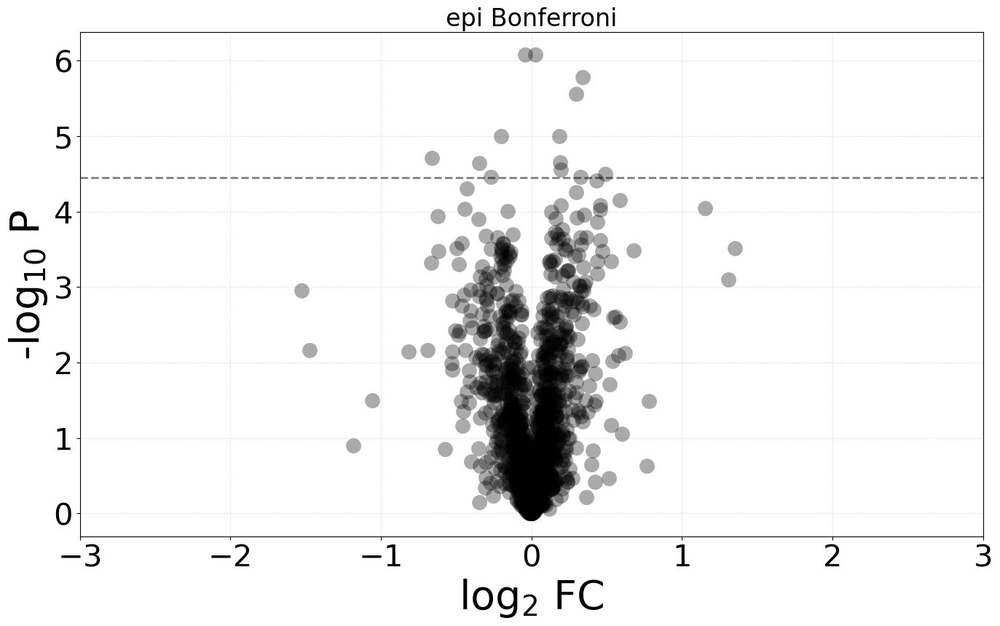

Benjamini-Hochberg correction
epsilon: 3.4105578254664
	 P07996 Thrombospondin-1 [0.45, 2.23]
	 Q9BYC5 Alpha-(1_6)-fucosyltransferase [-0.31, 1.29]
	 P17612 cAMP-dependent protein kinase catalytic subunit alpha [0.46, 2.10]
	 Q13233 Mitogen-activated protein kinase kinase kinase 1 [-0.27, 1.25]
	 P21589 5'-nucleotidase [0.24, 2.00]
	 P15498 Proto-oncogene vav [0.32, 1.88]
	 Q15393 Splicing factor 3B subunit 3 [0.22, 1.57]
	 Q9UHC1 DNA mismatch repair protein Mlh3 [0.29, 1.15]
	 P51991 Heterogeneous nuclear ribonucleoprotein A3 [0.22, 1.75]
	 Q9P035 Very-long-chain (3R)-3-hydroxyacyl-CoA dehydratase 3 [0.53, 2.06]
	 P14866 Heterogeneous nuclear ribonucleoprotein L [0.30, 1.49]
	 Q14157 Ubiquitin-associated protein 2-like [0.21, 1.97]
	 Q15746 Myosin light chain kinase_ smooth muscle [0.35, 1.88]
	 O00154 Cytosolic acyl coenzyme A thioester hydrolase [-0.23, 1.44]
	 P29966 Myristoylated alanine-rich C-kinase substrate [0.68, 2.10]
	 P06753 Tropomyosin alpha-3 chain [-0.22, 1.38]
	 Q5JSZ5

	 Q8NBF2 NHL repeat-containing protein 2 [-0.21, 1.05]
	 O14579 Coatomer subunit epsilon [-0.23, 1.16]
	 Q9Y333 U6 snRNA-associated Sm-like protein LSm2 [0.32, 1.25]
	 Q9H3U1 Protein unc-45 homolog A [0.32, 1.23]
	 P14923 Junction plakoglobin [-0.27, 1.04]
	 Q8IWV8;Q9H1X3 E3 ubiquitin-protein ligase UBR2 [-0.23, 2.11]
	 P40763 Signal transducer and activator of transcription 3 [0.38, 1.12]
	 Q9Y6E2 eIF5-mimic protein 1 [0.39, 1.75]
	 Q92878 DNA repair protein RAD50 [-0.30, 1.15]
	 P01008 Antithrombin-III [-0.69, 1.40]
	 P28074 Proteasome subunit beta type-5 [-0.23, 1.12]
	 P07948 Tyrosine-protein kinase Lyn [0.43, 2.06]
	 O60641 Clathrin coat assembly protein AP180 [-0.28, 1.04]
	 Q9Y2M5 Kelch-like protein 20 [0.22, 1.51]
	 Q9UL46 Proteasome activator complex subunit 2 [-0.34, 1.96]
	 O60282 Kinesin heavy chain isoform 5C [-0.27, 1.31]
	 Q14669 E3 ubiquitin-protein ligase TRIP12 [-0.35, 2.21]
	 Q96SN8 CDK5 regulatory subunit-associated protein 2 [-0.35, 2.45]
	 Q15386 Ubiquitin-protein

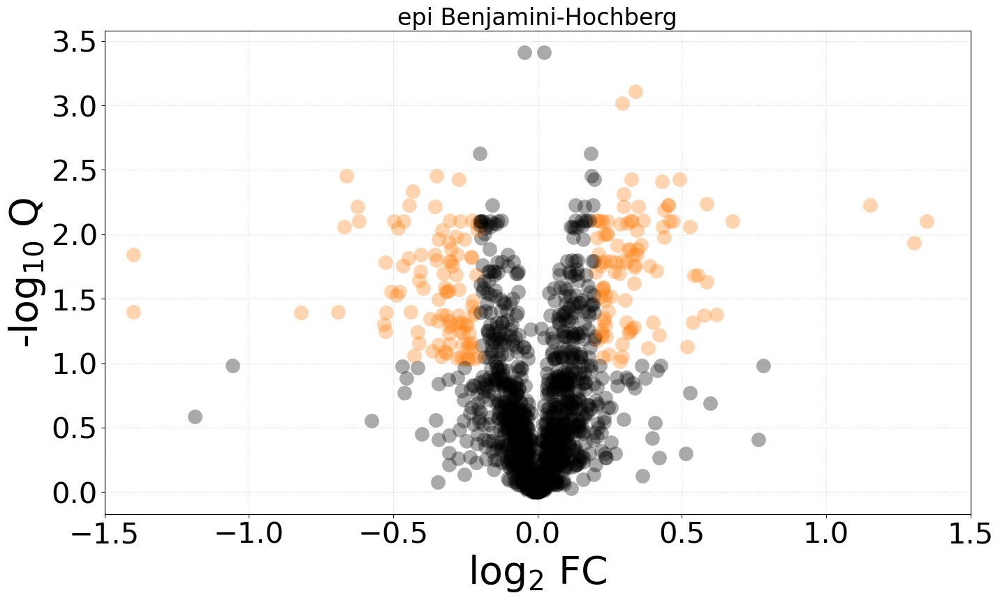

195 proteins respond to treatment


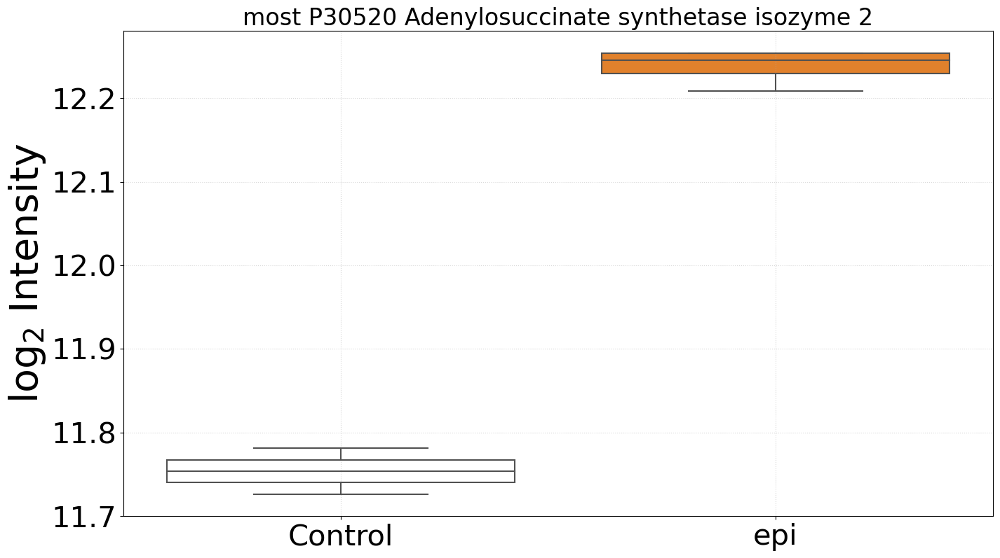

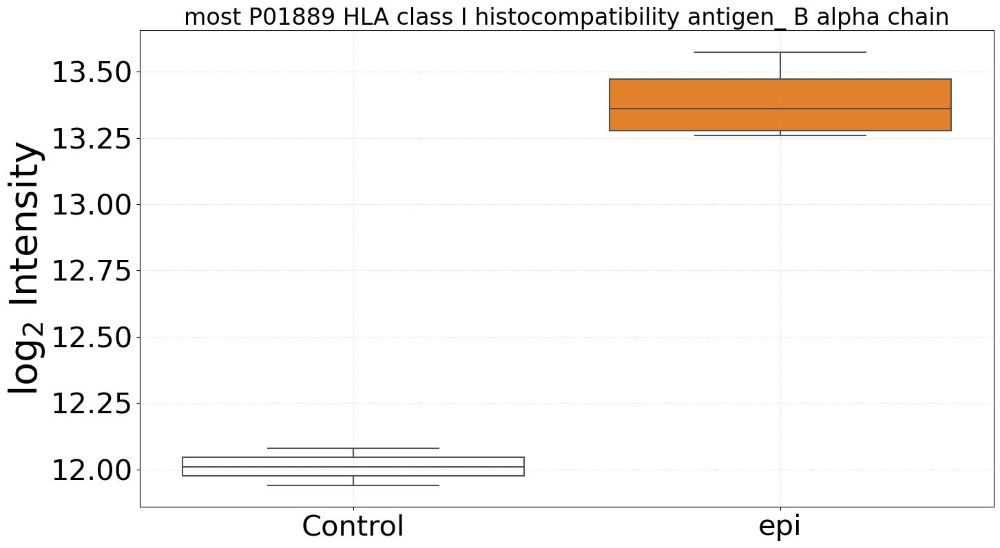

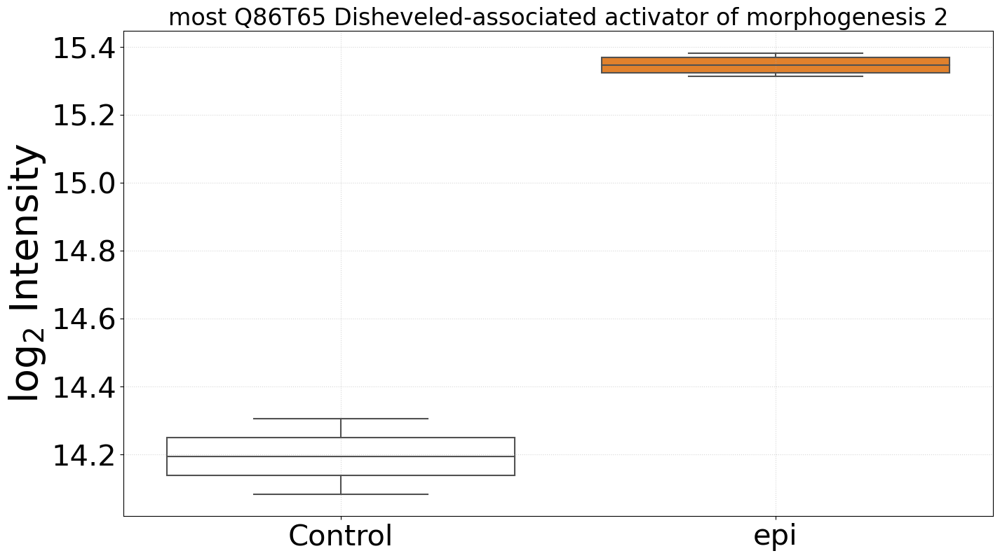

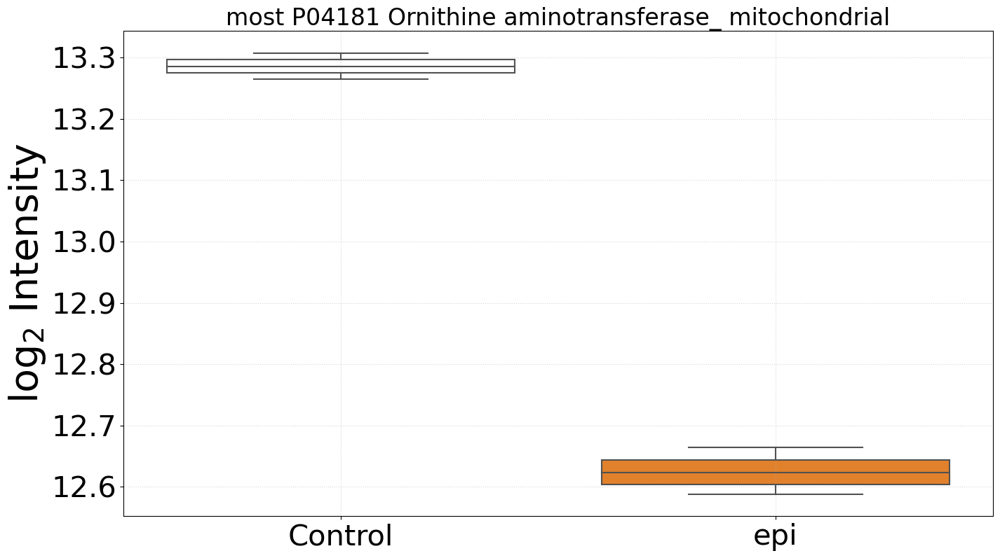

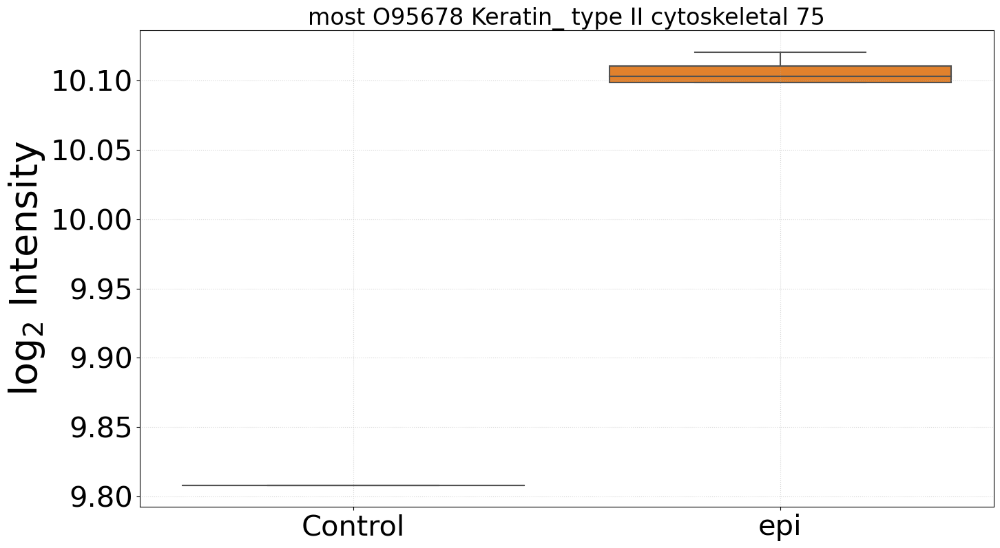

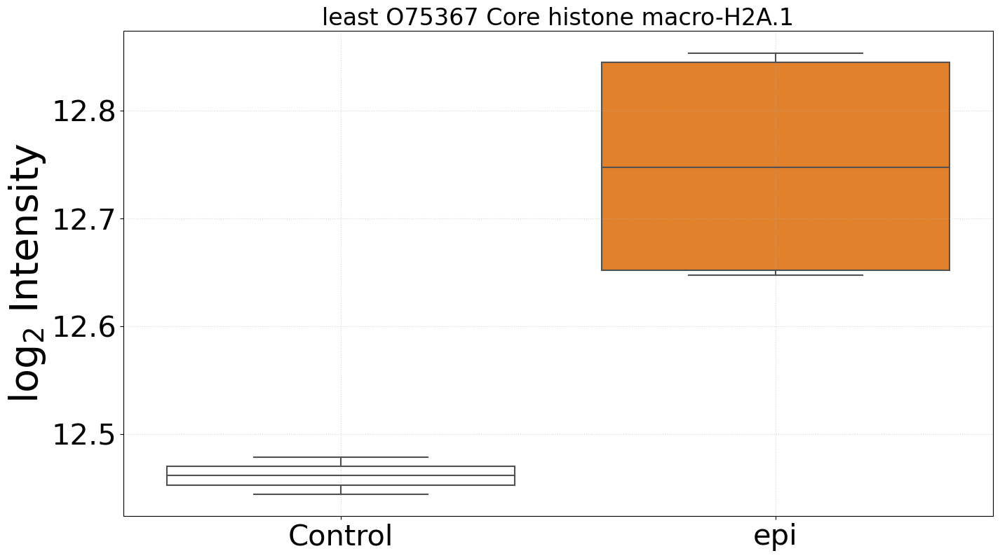

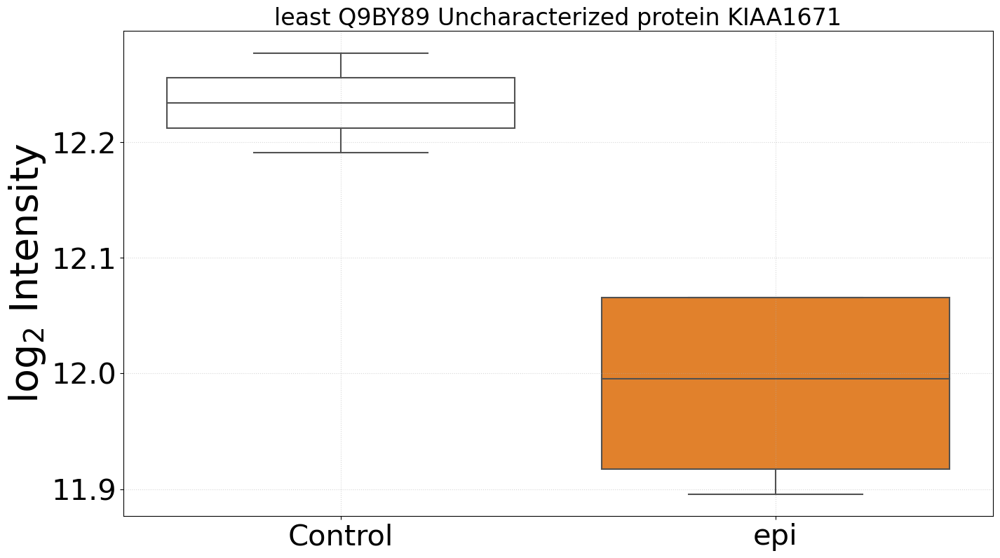

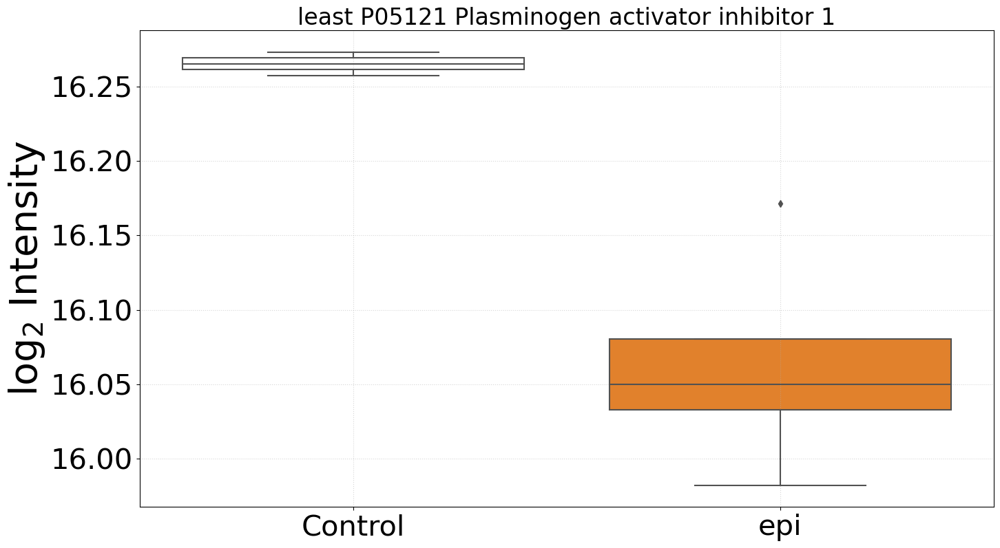

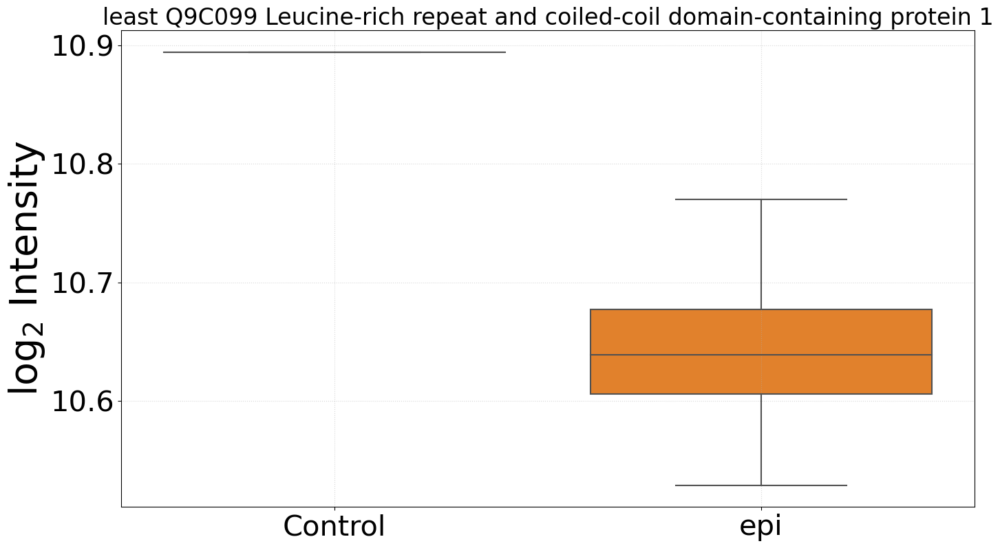

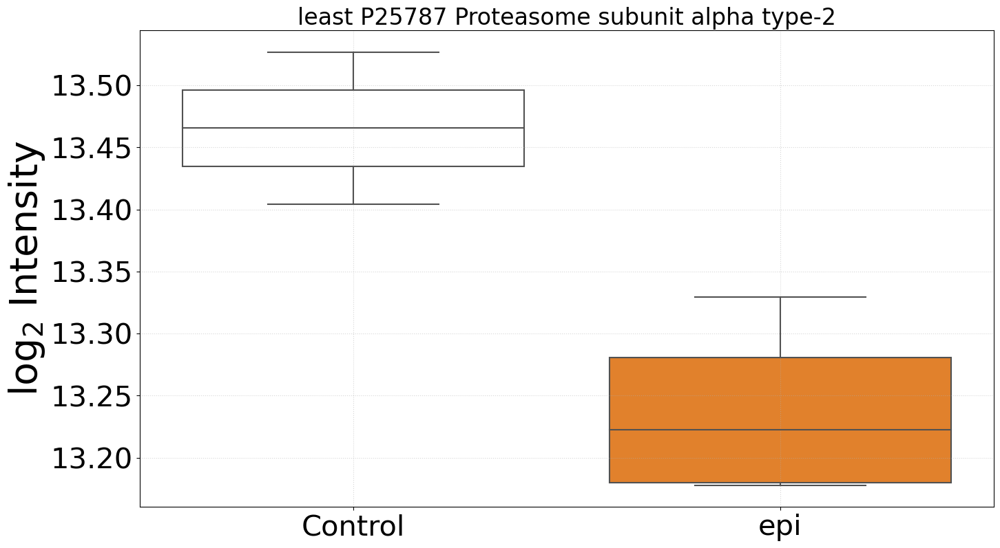

In [26]:
treatment_label = 'epi'
treatment_color = 'tab:orange'
control_samples = ['20220905_ARNAR_' + element for element in ['010', '011']]
treated_samples = ['20220905_ARNAR_' + element for element in ['005', '004', '009', '008']]
epi_response = comparison_function('4h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
5.684666918313519
max fold change 1.6866636140769682


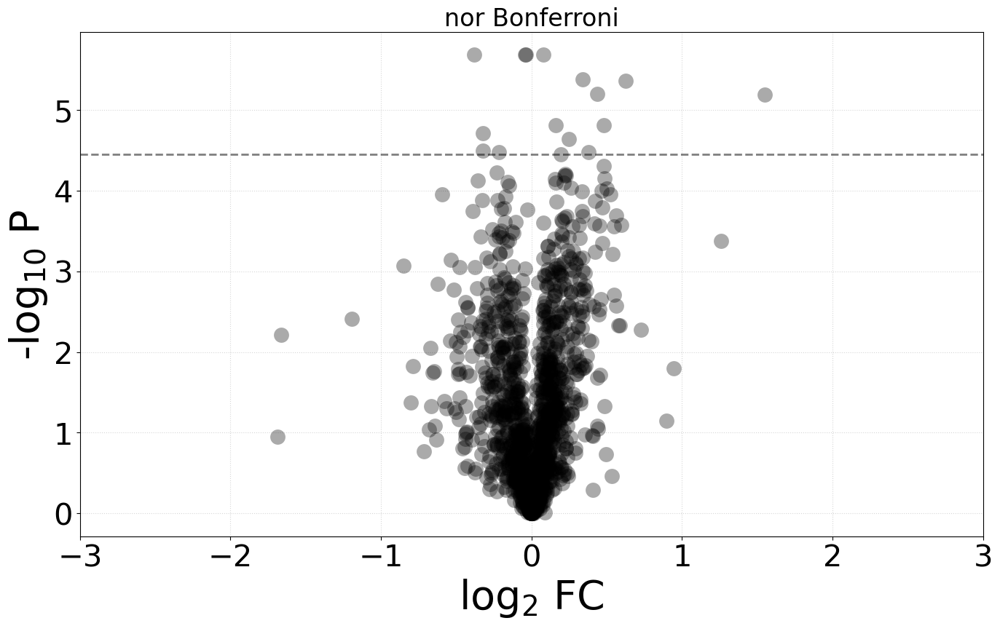

Benjamini-Hochberg correction
epsilon: 3.2913505238576706
	 P07996 Thrombospondin-1 [0.44, 2.94]
	 Q9BYC5 Alpha-(1_6)-fucosyltransferase [-0.62, 1.84]
	 P17612 cAMP-dependent protein kinase catalytic subunit alpha [0.32, 2.12]
	 Q99729 Heterogeneous nuclear ribonucleoprotein A/B [-0.23, 2.31]
	 P21589 5'-nucleotidase [0.27, 1.46]
	 P62750 60S ribosomal protein L23a [-0.29, 1.84]
	 P15498 Proto-oncogene vav [0.26, 1.23]
	 P54762 Ephrin type-B receptor 1 [0.47, 2.25]
	 Q15393 Splicing factor 3B subunit 3 [0.25, 1.69]
	 Q9P035 Very-long-chain (3R)-3-hydroxyacyl-CoA dehydratase 3 [0.36, 1.24]
	 Q14157 Ubiquitin-associated protein 2-like [0.24, 2.03]
	 Q5M9N0 Coiled-coil domain-containing protein 158 [0.33, 1.70]
	 Q16222 UDP-N-acetylhexosamine pyrophosphorylase [-0.23, 1.67]
	 P29966 Myristoylated alanine-rich C-kinase substrate [0.45, 1.68]
	 P17661 Desmin [0.28, 2.03]
	 Q5JSZ5 Protein PRRC2B [0.28, 1.02]
	 O75436 Vacuolar protein sorting-associated protein 26A [0.26, 1.80]
	 P45880 Volta

	 Q53GQ0 Very-long-chain 3-oxoacyl-CoA reductase [-0.22, 2.13]
	 P41250 Glycine--tRNA ligase [-0.22, 2.14]
	 Q08AM6 Protein VAC14 homolog [-0.29, 1.72]
	 P40763 Signal transducer and activator of transcription 3 [0.30, 1.35]
	 Q16629 Serine/arginine-rich splicing factor 7 [-0.26, 1.29]
	 Q96HE7 ERO1-like protein alpha [-0.20, 2.15]
	 Q9Y6E2 eIF5-mimic protein 1 [0.24, 1.09]
	 Q9BYD6 39S ribosomal protein L1_ mitochondrial [-0.26, 1.06]
	 Q92878 DNA repair protein RAD50 [-0.28, 1.59]
	 P07948 Tyrosine-protein kinase Lyn [0.54, 2.01]
	 P35270 Sepiapterin reductase [0.32, 1.64]
	 Q9Y2M5 Kelch-like protein 20 [0.36, 1.91]
	 Q12768 WASH complex subunit 5 [-0.42, 1.54]
	 Q9UL46 Proteasome activator complex subunit 2 [-0.46, 1.48]
	 Q14669 E3 ubiquitin-protein ligase TRIP12 [-0.39, 2.25]
	 Q14019 Coactosin-like protein [0.25, 2.13]
	 A6NMZ7 Collagen alpha-6(VI) chain [-0.29, 1.57]
	 P05023 Sodium/potassium-transporting ATPase subunit alpha-1 [0.22, 2.38]
	 Q15056 Eukaryotic translation initia

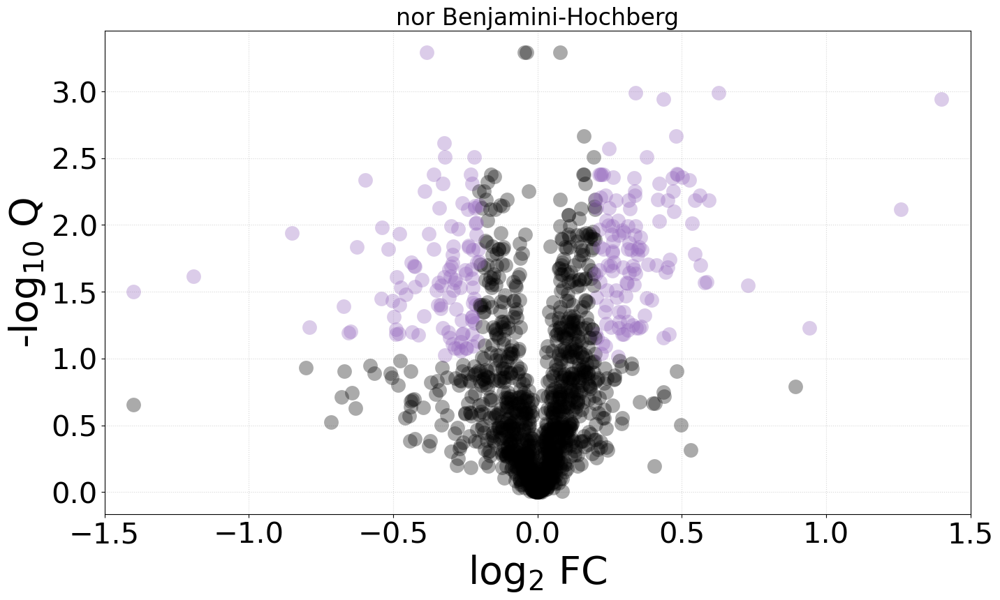

228 proteins respond to treatment


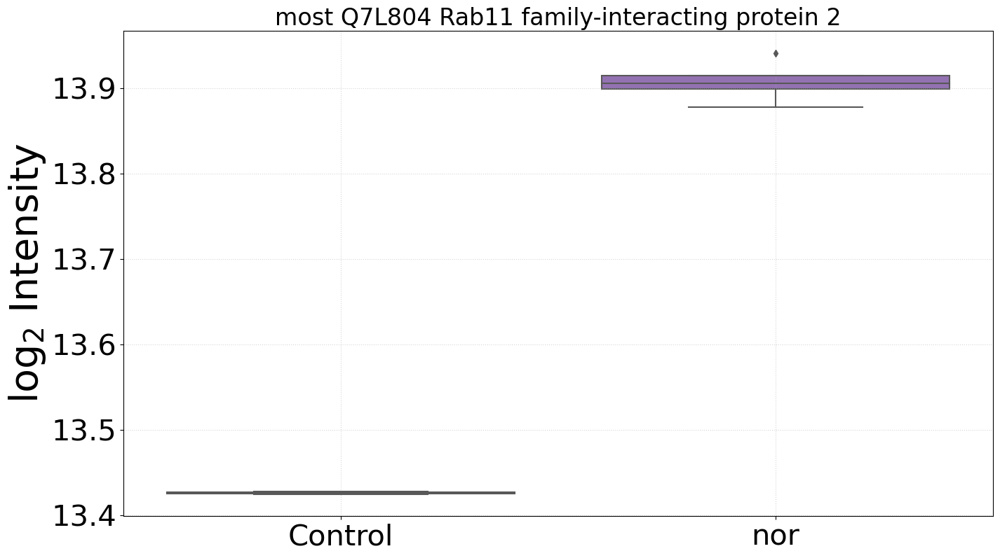

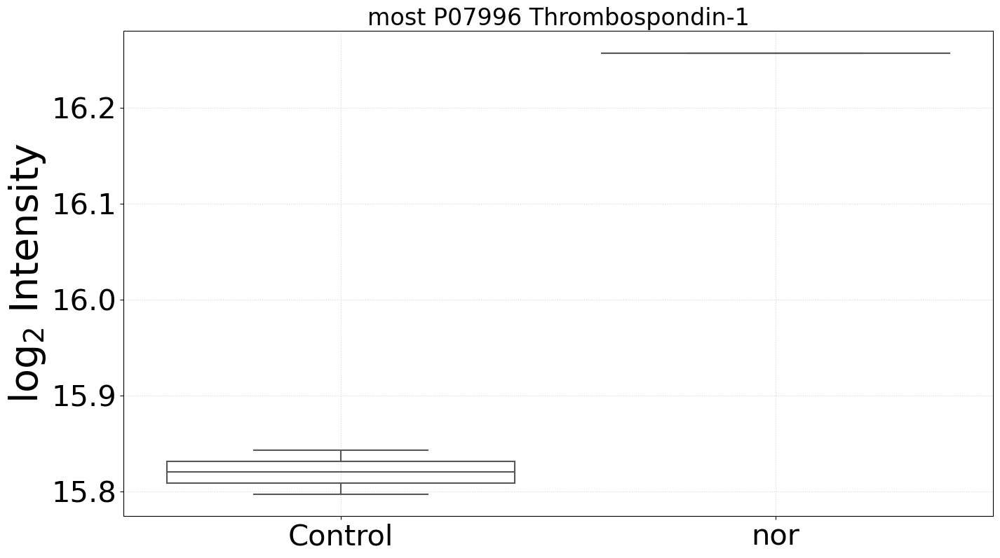

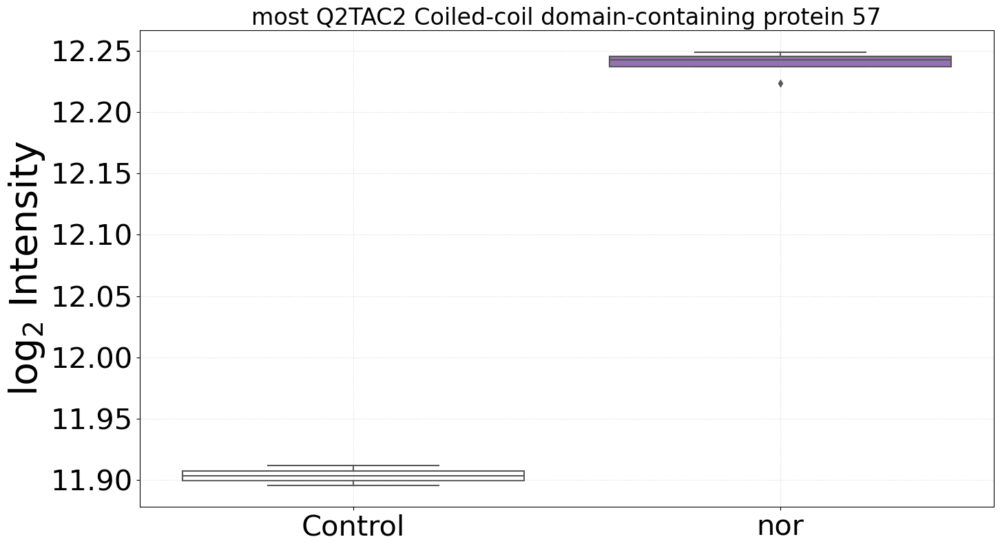

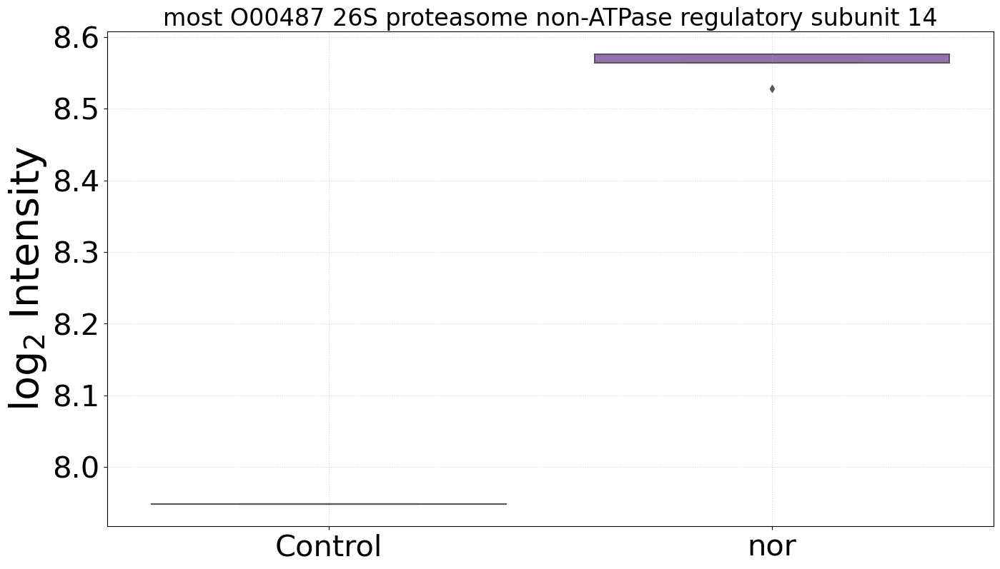

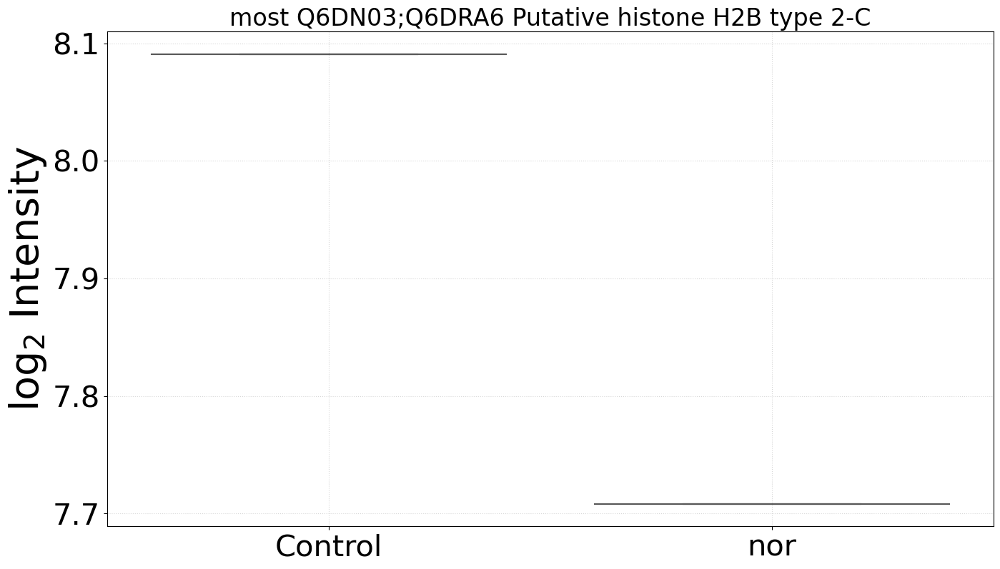

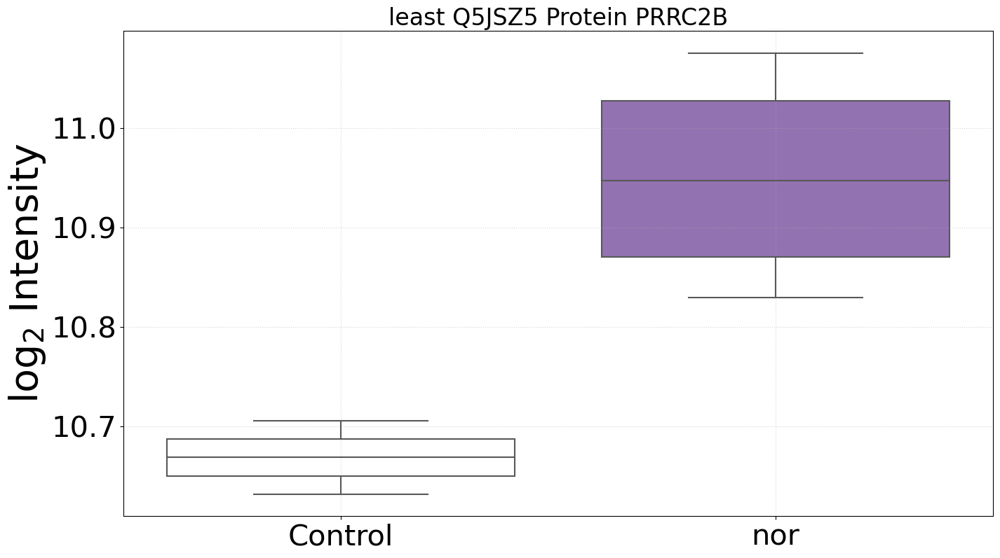

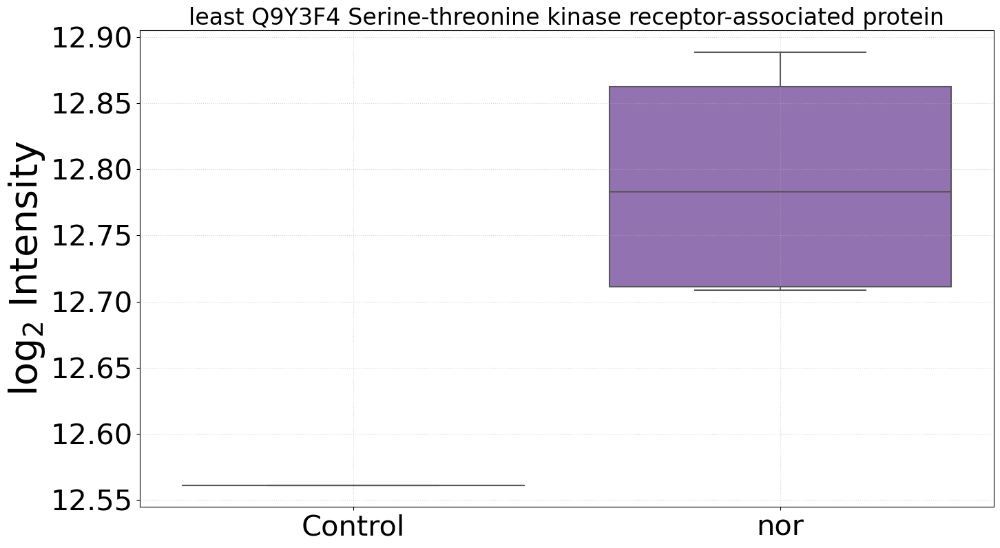

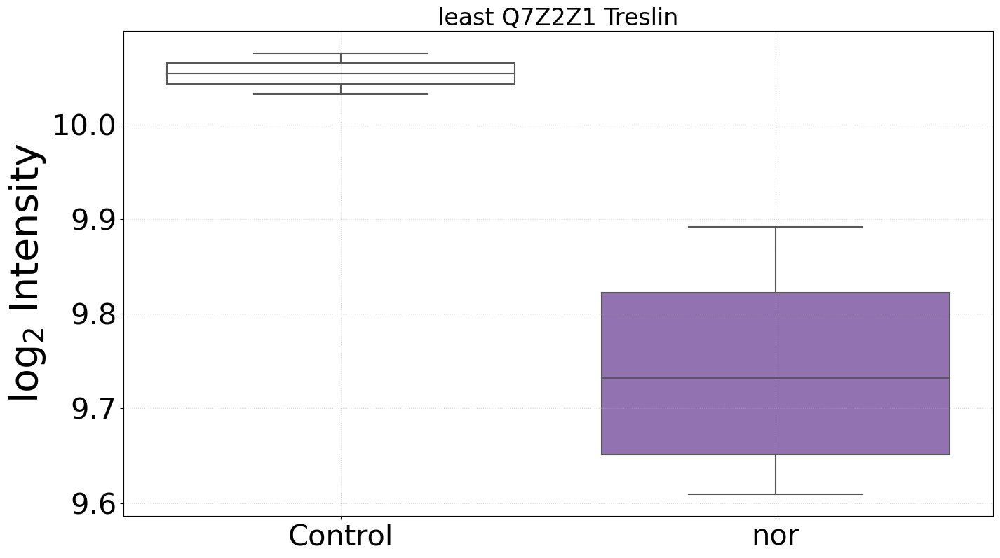

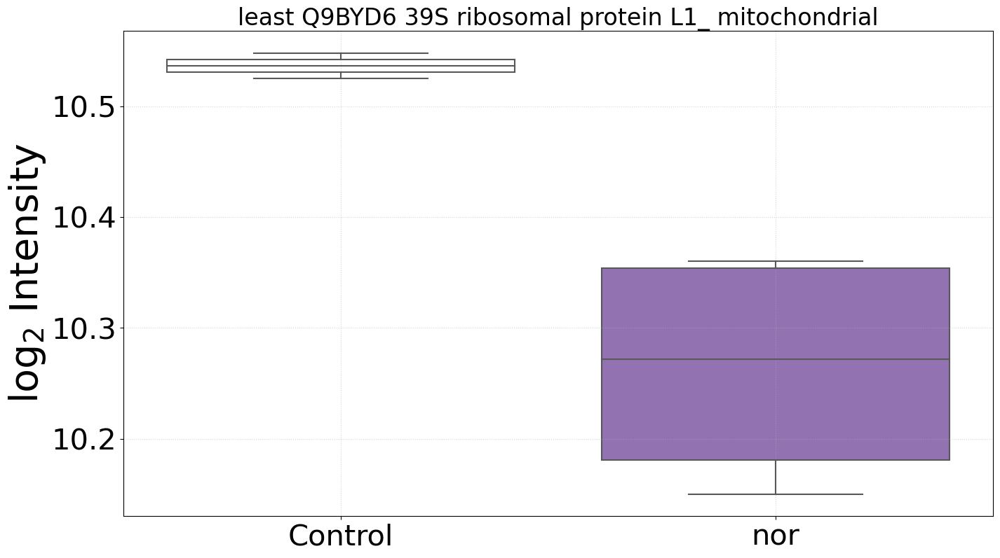

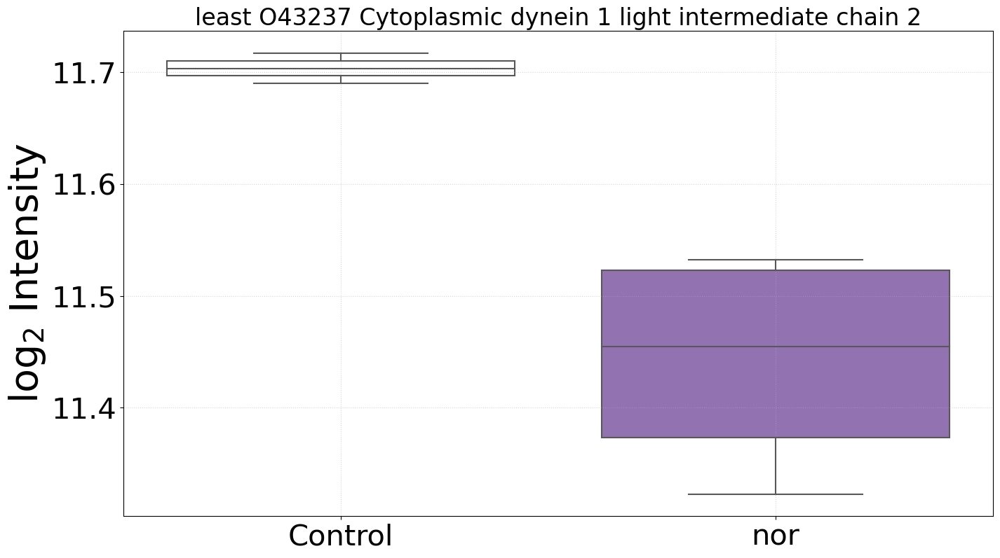

In [27]:
treatment_label = 'nor'
treatment_color = 'tab:purple'
control_samples = ['20220905_ARNAR_' + element for element in ['010', '011']]
treated_samples = ['20220905_ARNAR_' + element for element in ['020', '019', '014', '013']]
nor_response = comparison_function('4h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
5.981625932348072
max fold change 2.1204864947194686


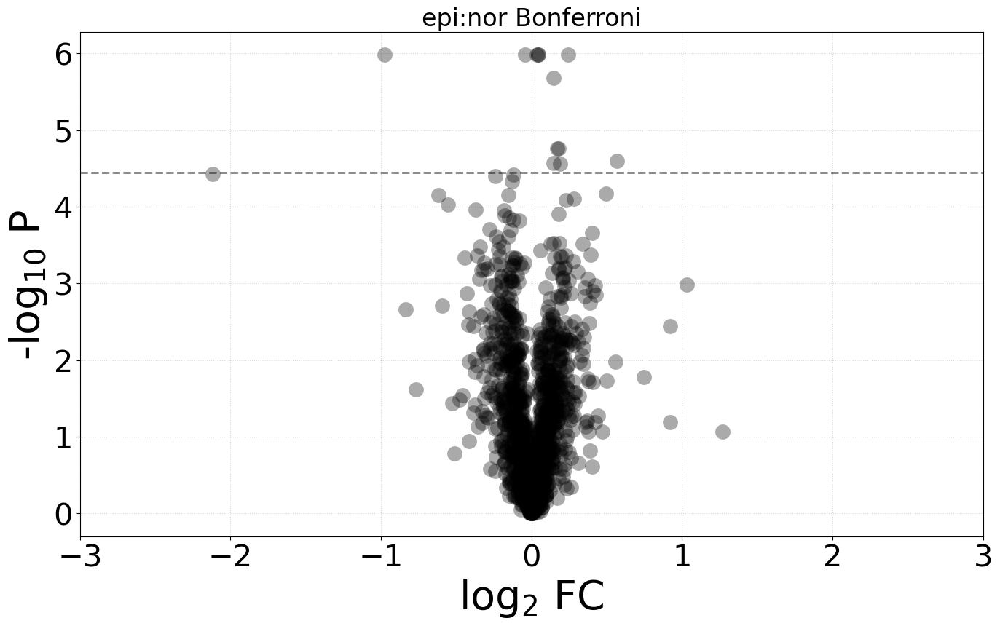

Benjamini-Hochberg correction
epsilon: 3.680595936684091
	 P07996 Thrombospondin-1 [0.23, 1.43]
	 Q9BYC5 Alpha-(1_6)-fucosyltransferase [-0.25, 1.41]
	 P17612 cAMP-dependent protein kinase catalytic subunit alpha [0.38, 1.53]
	 P62942 Peptidyl-prolyl cis-trans isomerase FKBP1A [0.21, 1.47]
	 P21589 5'-nucleotidase [0.24, 1.28]
	 O43592 Exportin-T [-0.41, 1.61]
	 P54762 Ephrin type-B receptor 1 [0.35, 1.38]
	 O60271 C-Jun-amino-terminal kinase-interacting protein 4 [-0.21, 1.29]
	 P46926 Glucosamine-6-phosphate isomerase 1 [-0.24, 2.43]
	 Q5M9N0 Coiled-coil domain-containing protein 158 [0.28, 1.40]
	 O00154 Cytosolic acyl coenzyme A thioester hydrolase [-0.21, 1.59]
	 P17661 Desmin [0.49, 2.28]
	 O75436 Vacuolar protein sorting-associated protein 26A [0.20, 1.03]
	 Q7Z5J8 Ankyrin and armadillo repeat-containing protein [-0.22, 1.92]
	 Q49AJ0 Protein FAM135B [0.20, 1.33]
	 P01889 HLA class I histocompatibility antigen_ B alpha chain [1.03, 1.81]
	 P13987 CD59 glycoprotein [0.22, 1.89]
	

	 Q13425 Beta-2-syntrophin [-0.77, 1.07]
	 P00533 Epidermal growth factor receptor [-0.32, 1.89]
	 P02786 Transferrin receptor protein 1 [-0.26, 1.05]
	 Q8NDW8 Tetratricopeptide repeat protein 21A [0.28, 1.05]
	 O95456 Proteasome assembly chaperone 1 [0.30, 1.47]
	 P11586 C-1-tetrahydrofolate synthase_ cytoplasmic [-0.21, 1.32]
	 P35637 RNA-binding protein FUS [-0.33, 1.89]
	 Q06323 Proteasome activator complex subunit 1 [-0.32, 1.59]


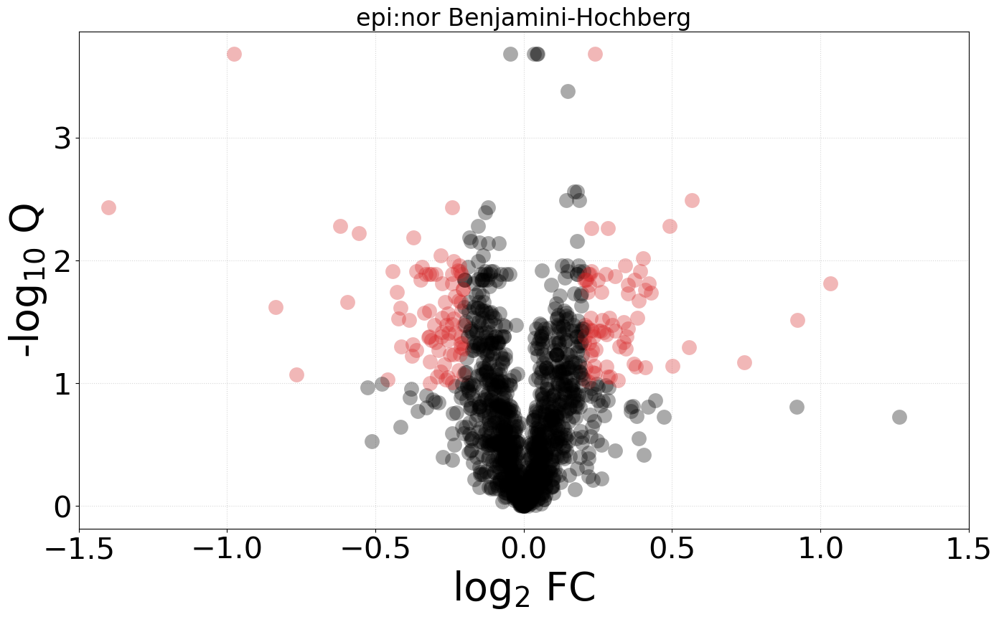

151 proteins respond to treatment


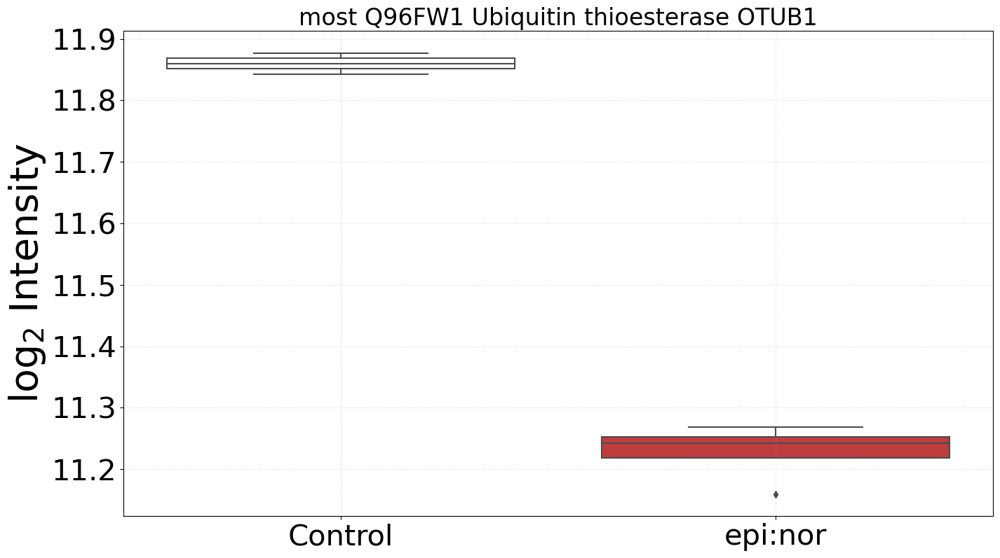

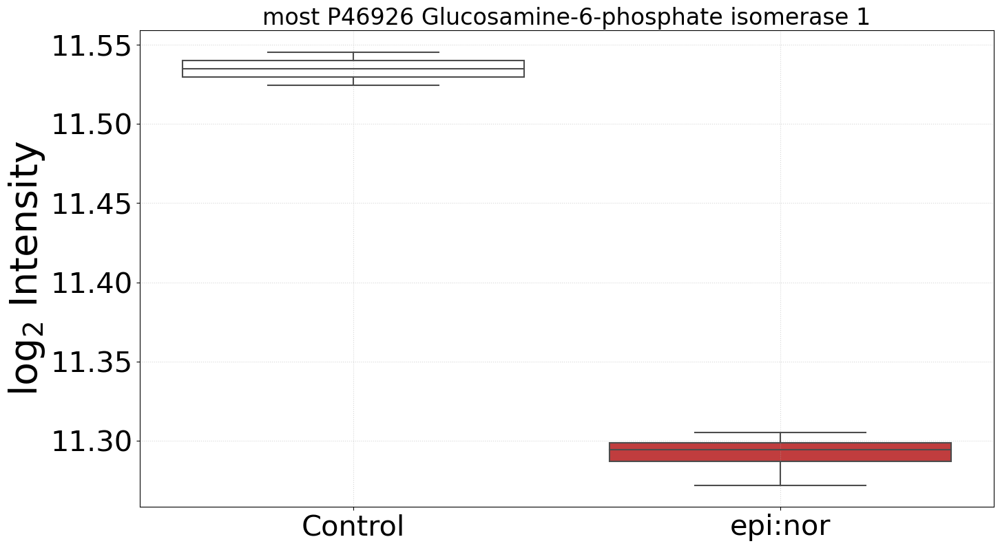

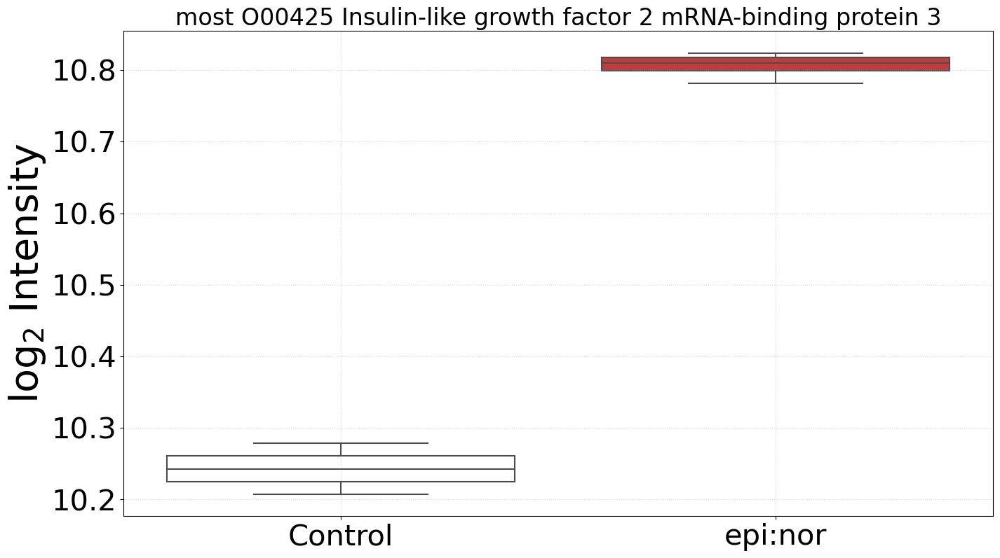

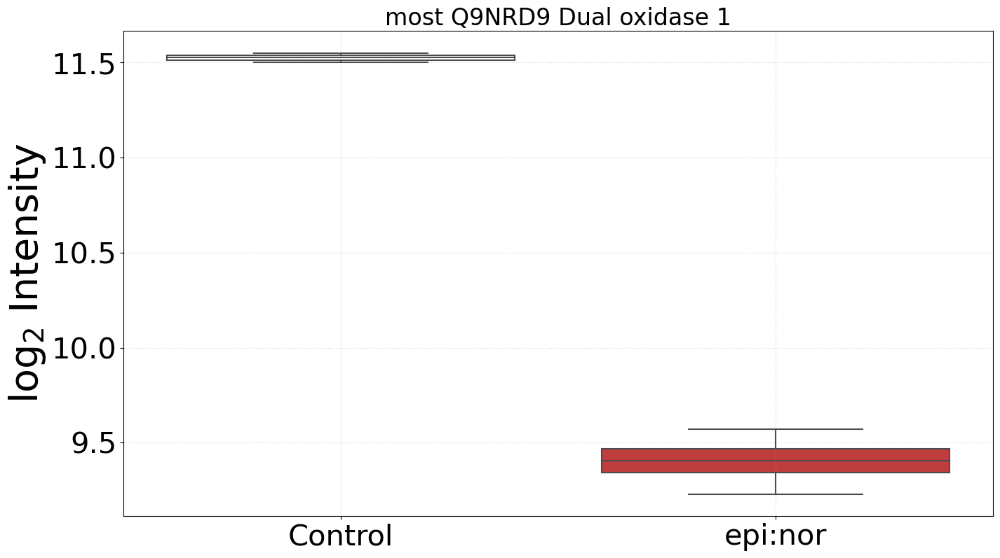

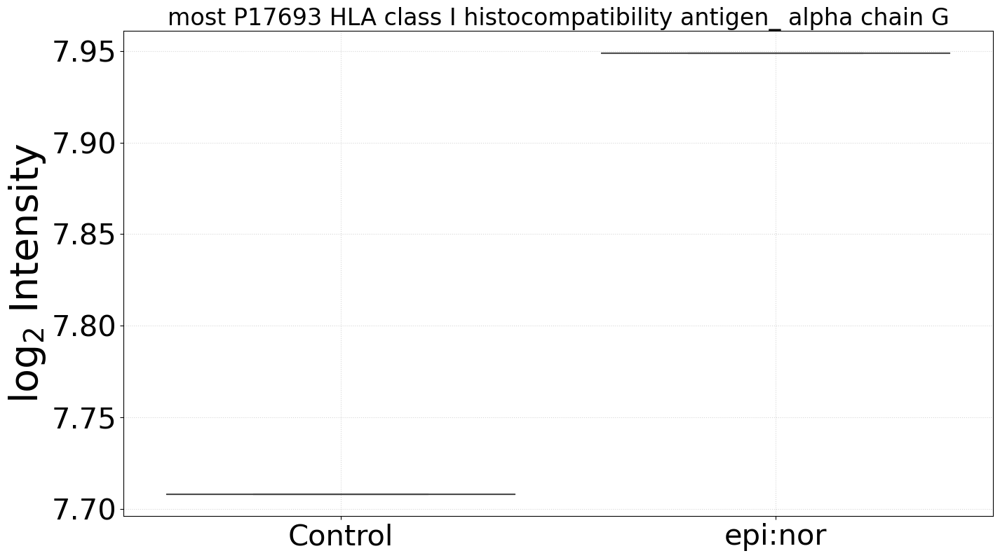

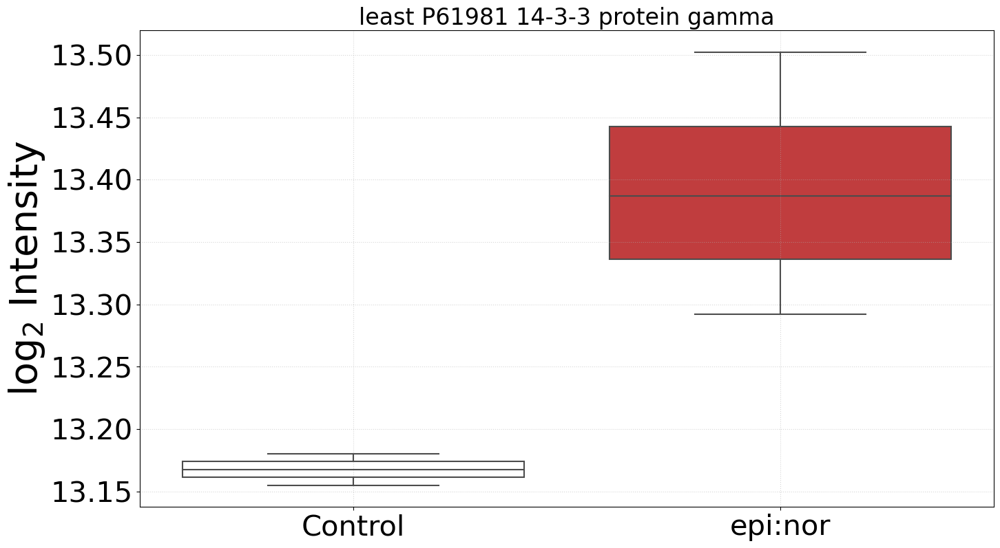

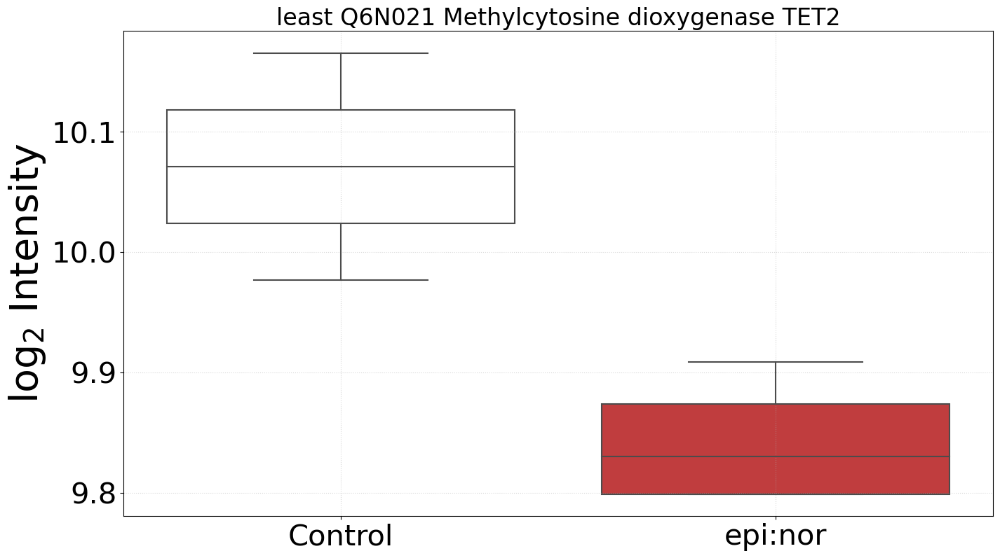

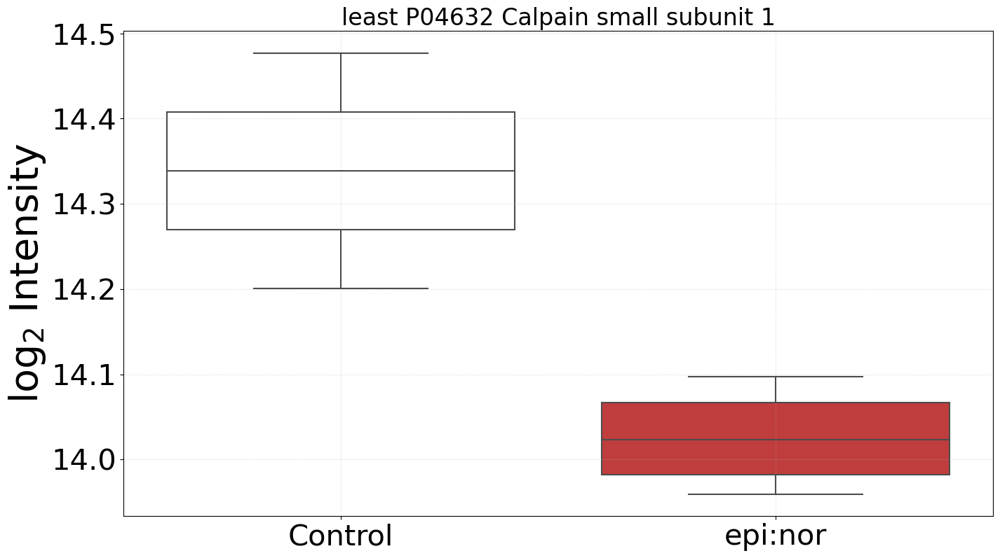

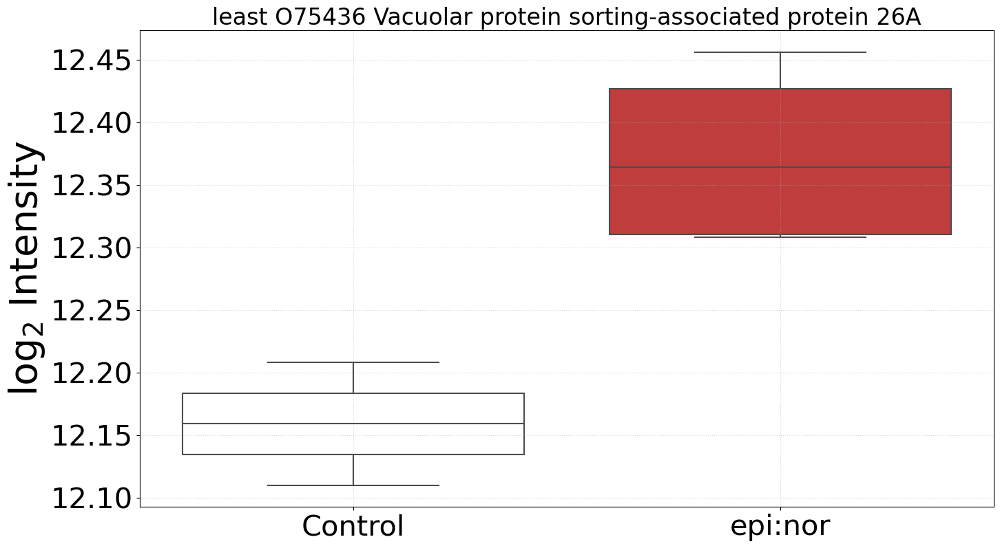

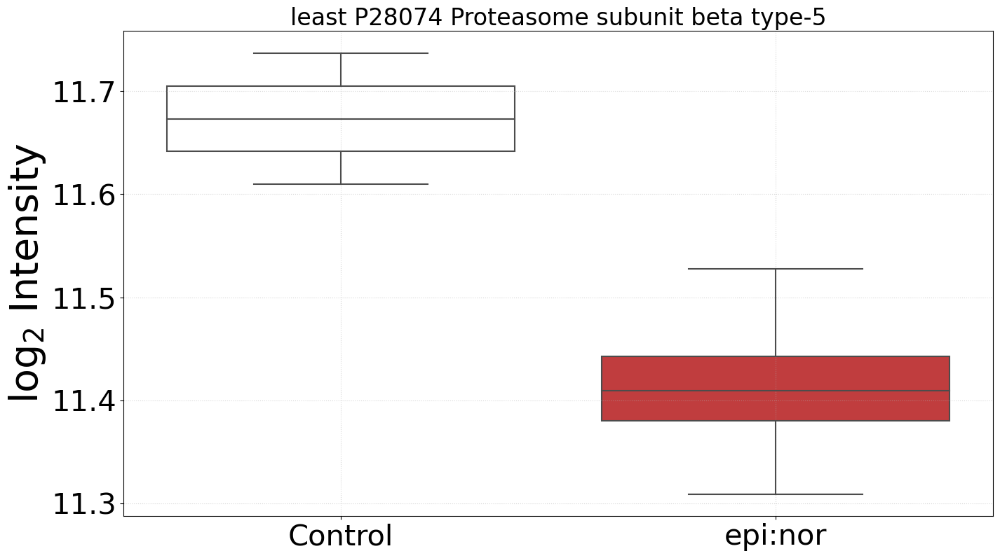

In [28]:
treatment_label = 'epi:nor'
treatment_color = 'tab:red'
control_samples = ['20220905_ARNAR_' + element for element in ['010', '011']]
treated_samples = ['20220905_ARNAR_' + element for element in ['025', '024', '026', '027']]
epinor_response = comparison_function('4h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

### Venn diagram of treatmens

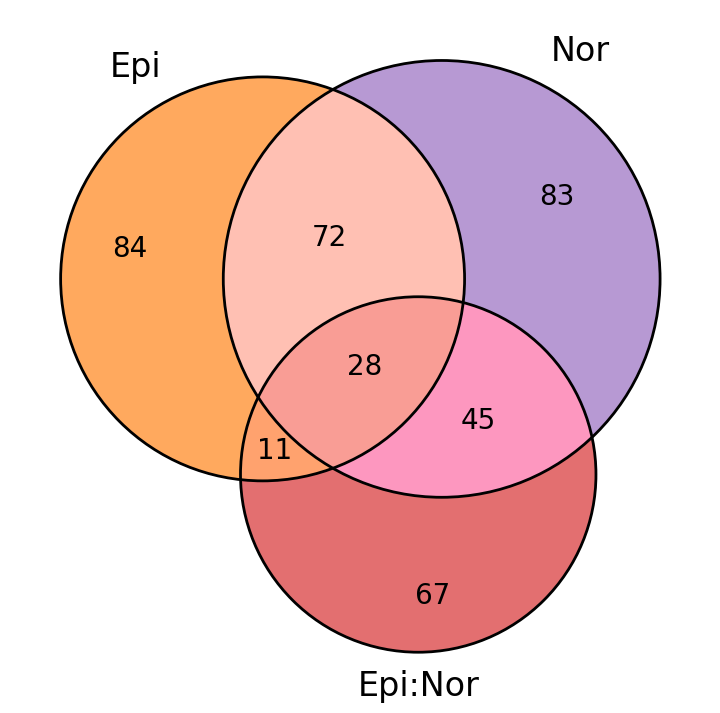

In [29]:
matplotlib_venn.venn3(
    [set(epi_response), set(nor_response), set(epinor_response)], 
    set_labels=('Epi', 'Nor', 'Epi:Nor'),
    set_colors=('tab:orange', 'tab:purple', 'tab:red'),
    alpha=2/3
)
matplotlib_venn.venn3_circles(
    [set(epi_response), set(nor_response), set(epinor_response)],
    linewidth=2
)
matplotlib.pyplot.show()

# LATE samples

### define metadata

In [30]:
metadata = {}

metadata['24h control'] = ['20220905_ARNAR_022', '20220905_ARNAR_023', '20220905_ARNAR_037', '20220905_ARNAR_038', '20220905_ARNAR_067', '20220905_ARNAR_068']

metadata['24h epi'] = ['20220905_ARNAR_031', '20220905_ARNAR_040']

metadata['24h nor'] = ['20220905_ARNAR_028', '20220905_ARNAR_053', '20220905_ARNAR_054', '20220905_ARNAR_062']

metadata['24h epinor'] = ['20220905_ARNAR_006', '20220905_ARNAR_007', '20220905_ARNAR_033', '20220905_ARNAR_034', '20220905_ARNAR_055']

metadata['24h TNFa'] = ['20220905_ARNAR_015', '20220905_ARNAR_016', '20220905_ARNAR_017', '20220905_ARNAR_018', '20220905_ARNAR_042', '20220905_ARNAR_043']

all_sample_names = [element for sublist in list(metadata.values()) for element in sublist]
print(len(all_sample_names))

23


### manipulate data

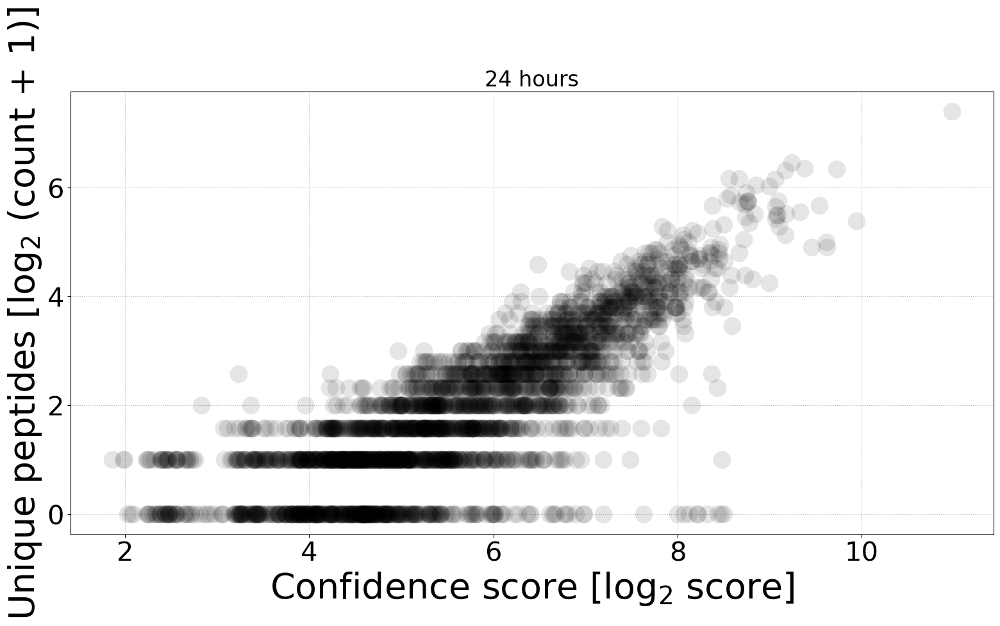

In [31]:
x = numpy.log2(df24['Confidence score'])
y = numpy.log2(df24['Unique peptides']+1)
               
matplotlib.pyplot.plot(x, y, 'o', color='black', alpha=1/10, markeredgecolor='None', ms=20)

matplotlib.pyplot.xlabel('Confidence score [log$_2$ score]')
matplotlib.pyplot.ylabel('Unique peptides [log$_2$ (count + 1)]')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('24 hours')
matplotlib.pyplot.tight_layout()

Arbitrary thresholds for minimal identifications:
- X-axis: a score of >= 50.
- Y-axis: at least three unique peptides.

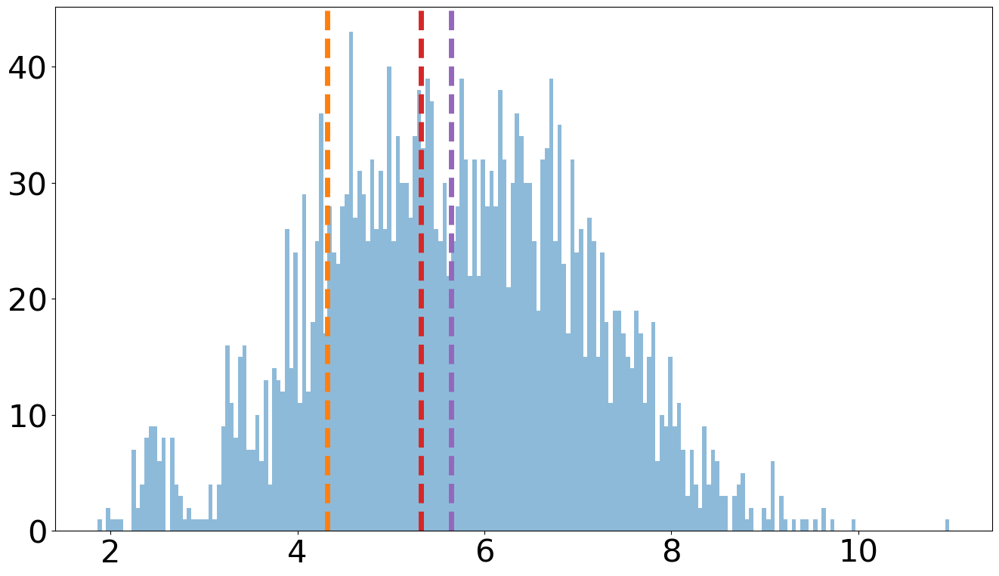

In [32]:
matplotlib.pyplot.hist(numpy.log2(df24['Confidence score']), bins=200, alpha=1/2, color='tab:blue')
matplotlib.pyplot.axvline(x=numpy.log2(20), lw=5, ls='--', color='tab:orange')
matplotlib.pyplot.axvline(x=numpy.log2(40), lw=5, ls='--', color='tab:red')
matplotlib.pyplot.axvline(x=numpy.log2(50), lw=5, ls='--', color='tab:purple')
matplotlib.pyplot.show()

In [33]:
new24 = df24[(df24['Unique peptides'] >= 3) & (df24['Confidence score'] >= 50)]
print(new24.shape)

working_labels = [label for label in new24.columns if label in all_sample_names]

new24 = numpy.log2(new24.loc[:, working_labels] + 1)
print(new24.shape)
new24

(1146, 83)
(1146, 23)


,20220905_ARNAR_022,20220905_ARNAR_023,20220905_ARNAR_037,20220905_ARNAR_038,20220905_ARNAR_067,20220905_ARNAR_068,20220905_ARNAR_015,20220905_ARNAR_016,20220905_ARNAR_017,20220905_ARNAR_018,...,20220905_ARNAR_040,20220905_ARNAR_028,20220905_ARNAR_053,20220905_ARNAR_054,20220905_ARNAR_062,20220905_ARNAR_006,20220905_ARNAR_007,20220905_ARNAR_033,20220905_ARNAR_034,20220905_ARNAR_055
Accession,,,,,,,,,,,,,,,,,,,,,
P05362,12.136222,12.096396,12.003133,12.087096,12.063444,11.987530,15.026937,15.053167,14.758016,14.818401,...,12.168192,12.025421,12.140696,12.153072,12.131470,12.209911,12.173073,12.081752,12.053523,12.115003
P10321,11.904654,11.900532,11.841072,11.837779,11.990171,11.981418,12.686021,12.677490,12.380000,12.379737,...,11.650883,11.701315,11.792645,11.867709,11.658748,11.551434,11.596431,11.735823,11.744974,11.657682
Q15386,12.568446,12.518951,12.666620,12.368442,12.505658,12.417328,11.596525,11.570211,12.125195,12.197407,...,14.132543,13.718578,13.490551,13.129505,14.171559,12.622825,12.621595,12.666917,12.613376,12.582780
Q06323,11.894029,11.874543,11.872941,11.968498,12.023337,12.019146,12.205800,12.206725,12.019906,12.051140,...,11.547075,11.340281,11.575808,11.645362,11.505401,11.754864,11.732595,11.665586,11.670933,11.790793
Q92538,14.821087,14.874703,14.790360,14.920397,15.002750,15.062303,14.817534,14.847160,14.935128,14.977911,...,14.895017,14.672218,14.709050,14.653548,14.735682,14.340999,14.378552,14.409702,14.399495,14.227529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q86SQ0;O43511,13.182738,13.287457,13.266780,13.318024,13.307603,13.324157,13.122355,13.074455,13.136455,13.167879,...,13.344638,13.108341,13.318771,13.395601,13.164182,12.919393,12.979688,13.452843,13.298128,13.347842
Q9NTJ4,12.825811,12.821668,12.951944,13.074719,13.008411,12.993811,12.781201,12.802997,12.775352,12.810090,...,12.902191,12.939043,12.998068,13.096740,12.946926,12.694997,12.748398,13.039226,13.078984,13.240375
P60981,12.949406,12.950136,12.855742,12.883994,13.061916,12.963713,12.877931,12.710013,12.816800,12.875271,...,12.950501,12.884901,12.984830,12.872015,12.908746,12.876472,12.799626,13.036330,12.900035,12.876138


### biomarker analysis

In [34]:
detected_biomarkers = {}
for biomarker in biomarkers.keys():
    uniprot_id = biomarkers[biomarker]
    print('working with biomarker {}, uniprot {}'.format(biomarker, uniprot_id))
    for element in df24.index:
        if uniprot_id in element:
            print('\t{}, peptide count {}, score {}'.format(element, df24.loc[element, 'Unique peptides'], df24.loc[element, 'Confidence score']))
            detected_biomarkers[element] = biomarker

detected_biomarkers.keys()

working with biomarker endothelin, uniprot P05305
working with biomarker PAI-1, uniprot P05121
	P05121, peptide count 19, score 160.2717
working with biomarker uPA, uniprot P00749
working with biomarker VCAM-1, uniprot P19320
working with biomarker L-selectin, uniprot P14151
working with biomarker Ang2, uniprot O15123
working with biomarker VEGFr1, uniprot P17948
working with biomarker ICAM-2, uniprot P13598
	P13598, peptide count 3, score 61.8311
working with biomarker tie2, uniprot Q02763
working with biomarker IL-6, uniprot P05231
working with biomarker E-selectin, uniprot P16581
working with biomarker ICAM-1, uniprot P05362
	P05362, peptide count 14, score 73.6527
working with biomarker P-selectin, uniprot P16109
working with biomarker Ang1, uniprot Q15389
working with biomarker vWF, uniprot P04275
working with biomarker PDGF, uniprot P01127
working with biomarker endocan, uniprot Q9NQ30
working with biomarker TNFa, uniprot P01375
working with biomarker VEGFa, uniprot P15692


dict_keys(['P05121', 'P13598', 'P05362'])

(1040, 83)
(1040, 23)
P05121 24h control
P05121 24h epi
P05121 24h nor
P05121 24h epinor
P05121 24h TNFa
PAI-1 [15.77791873779686, 16.49764157230824, 16.185735079823054, 16.07947562041897, 15.851509838137147]
P13598 24h control
P13598 24h epi
P13598 24h nor
P13598 24h epinor
P13598 24h TNFa
ICAM-2 [11.131536385753769, 11.444847941235231, 11.193534415906356, 11.177672704391076, 11.087425869879528]
P05362 24h control
P05362 24h epi
P05362 24h nor
P05362 24h epinor
P05362 24h TNFa
ICAM-1 [12.036392683025387, 12.134317382407897, 12.02711472301743, 12.051852877468017, 15.051720893630321]
{'PAI-1': [0.0, 0.71972283451138, 0.40781634202619443, 0.301556882622112, 0.0735911003402876], 'ICAM-2': [0.0, 0.3133115554814623, 0.06199803015258709, 0.04613631863730738, -0.044110515874240974], 'ICAM-1': [0.0, 0.09792469938251003, -0.009277960007956665, 0.015460194442630026, 3.0153282106049346]}


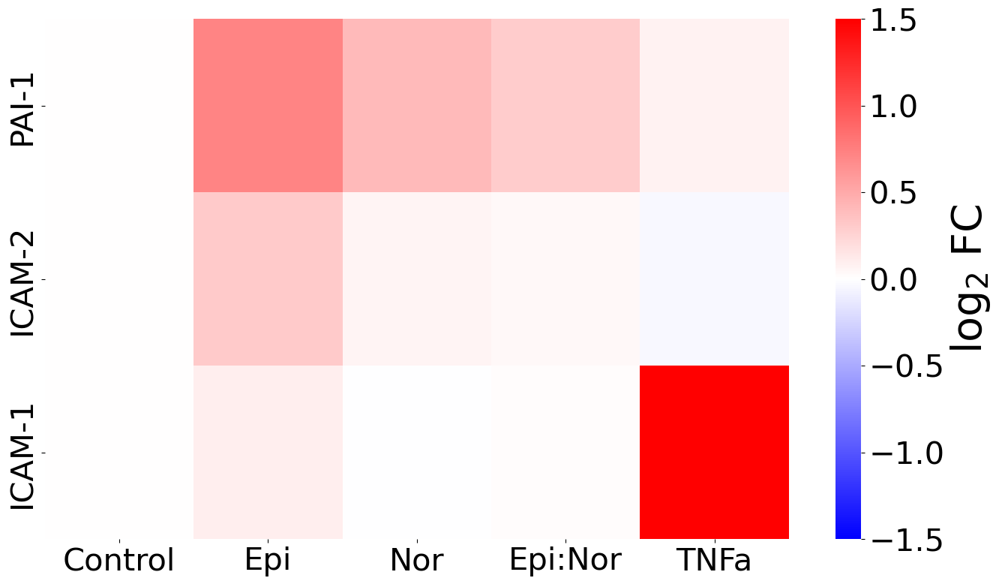

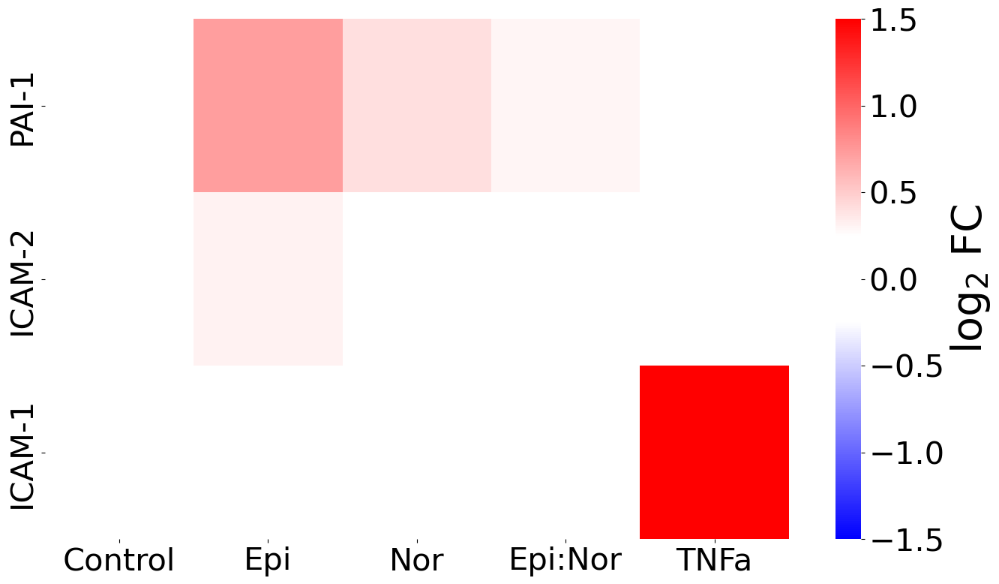

In [35]:
# P13598, peptide count 3, score 61.8311
biomarkers_df = df24[(df24['Unique peptides'] >= 3) & (df24['Confidence score'] >= 61)]
print(biomarkers_df.shape)
biomarkers_df = numpy.log2(biomarkers_df.loc[:, working_labels] + 1)
print(biomarkers_df.shape)

### normalization
# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(biomarkers_df.values, axis=0), index=biomarkers_df.index, columns=biomarkers_df.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qnbiodf = biomarkers_df.rank(method="min").stack().astype(int).map(df_mean).unstack()

# gererate data for heatmap
heatmap_data = {}
for marker in detected_biomarkers.keys():
    heatmap_data[detected_biomarkers[marker]] = []
    for treatment in metadata.keys():
        print(marker, treatment)
        log2_intensity = numpy.median(qnbiodf.loc[marker, metadata[treatment]].values)
        heatmap_data[detected_biomarkers[marker]].append(log2_intensity)
    print(detected_biomarkers[marker], heatmap_data[detected_biomarkers[marker]])

for biomarker in heatmap_data:
    reference = heatmap_data[biomarker][0]
    for i in range(len(heatmap_data[biomarker])):
        heatmap_data[biomarker][i] = heatmap_data[biomarker][i] - reference
print(heatmap_data)
heatmap_df = pandas.DataFrame.from_dict(heatmap_data).transpose()
heatmap_df.columns = ['Control', 'Epi', 'Nor', 'Epi:Nor', 'TNFa']

colors = [(0, "blue"), (0.5-(1/12), "white"), (0.5+(1/12), "white"), (1, "red")]
bwwr = matplotlib.colors.LinearSegmentedColormap.from_list("bwwr", colors)

seaborn.heatmap(data=heatmap_df, cmap='bwr', vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

seaborn.heatmap(data=heatmap_df, cmap=bwwr, vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

### visualize data

210
20220905_ARNAR_006
20220905_ARNAR_007
20.44118100653228


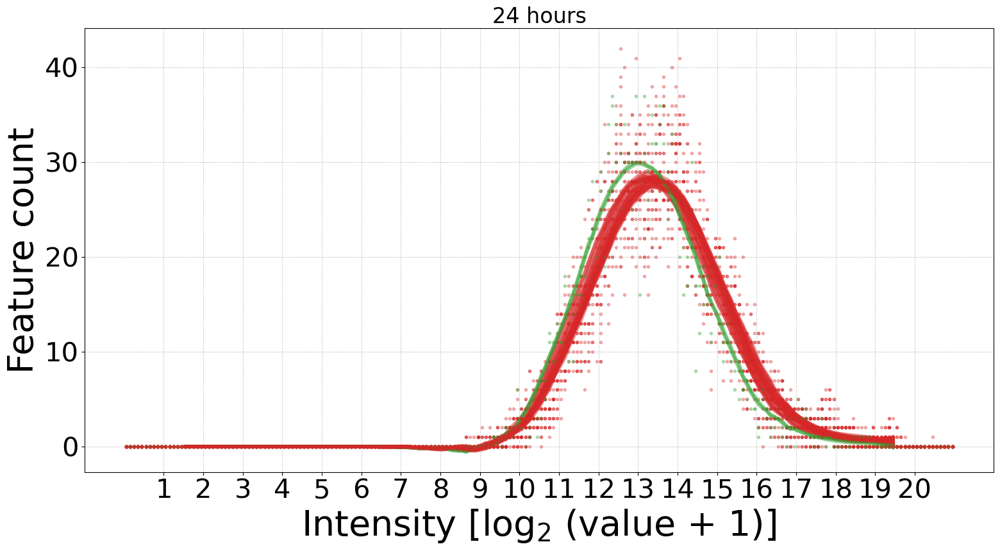

In [36]:
found_max = 21
number_of_bins = found_max * 10
margin = 15
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in new24.columns:
        
    intensities = new24.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:red'
    if '006' in sample or '007' in sample:
        the_color = 'tab:green'
        print(sample)
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)

matplotlib.pyplot.xticks(range(1, 21))
matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('24 hours')
matplotlib.pyplot.tight_layout()

### normalization

In [37]:
#
# quantile normalization 
# taken from https://cmdlinetips.com/2020/06/computing-quantile-normalization-in-python/
#

# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(new24.values, axis=0), index=new24.index, columns=new24.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = new24.rank(method="min").stack().astype(int).map(df_mean).unstack()

### distributions after normalization

210
19.408569280865084


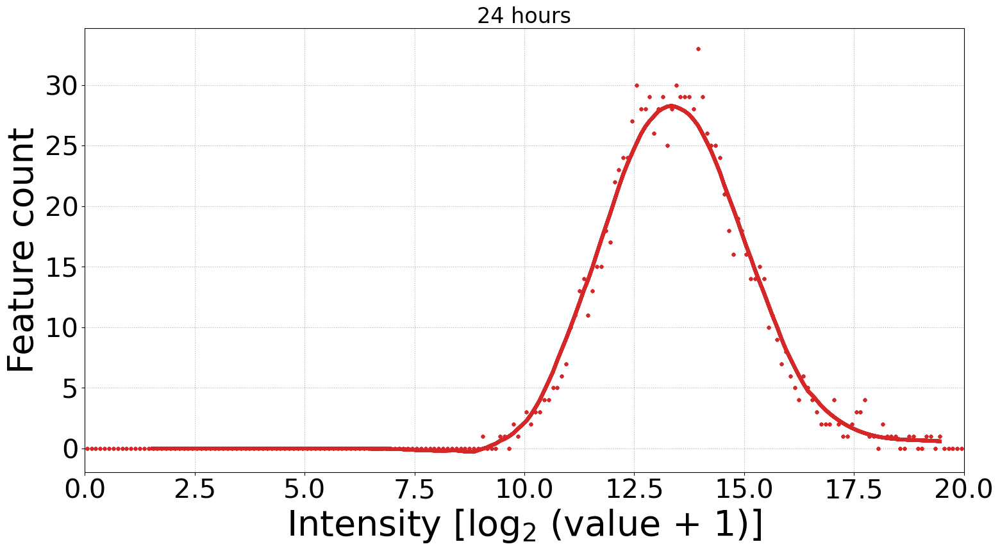

In [38]:
found_max = 21
number_of_bins = found_max * 10
margin = 15
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in qndf.columns:
        
    intensities = qndf.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:red'
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)

matplotlib.pyplot.xlim(0,20)
matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('24 hours')
matplotlib.pyplot.tight_layout()

### PCA

[0.32556867 0.16003256]


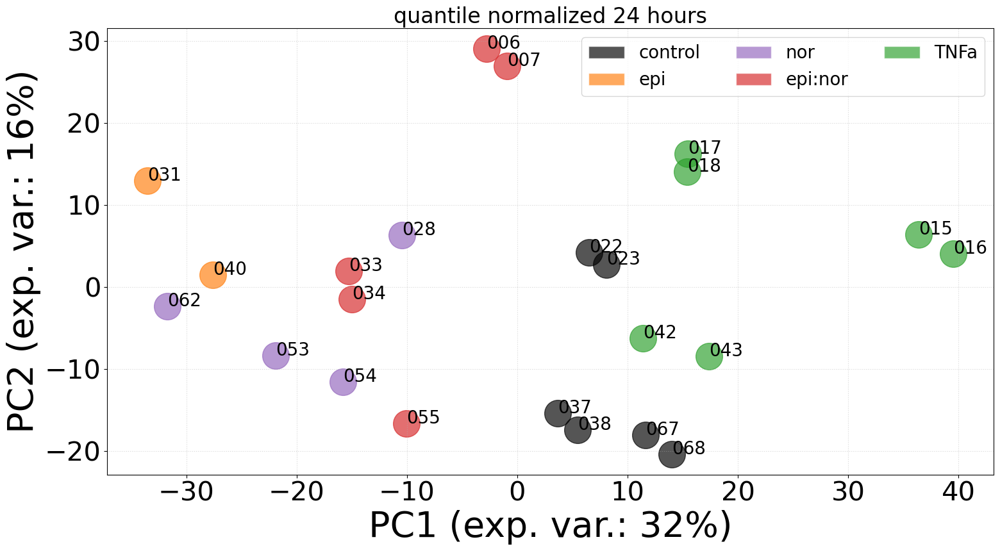

In [39]:
# quantile normalized all
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
    the_label = qndf.columns[i].split('_')[-1]
        
    if qndf.columns[i] in metadata['24h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['24h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['24h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['24h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['24h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('quantile normalized 24 hours')
matplotlib.pyplot.tight_layout()

[0.51913175 0.19178318]


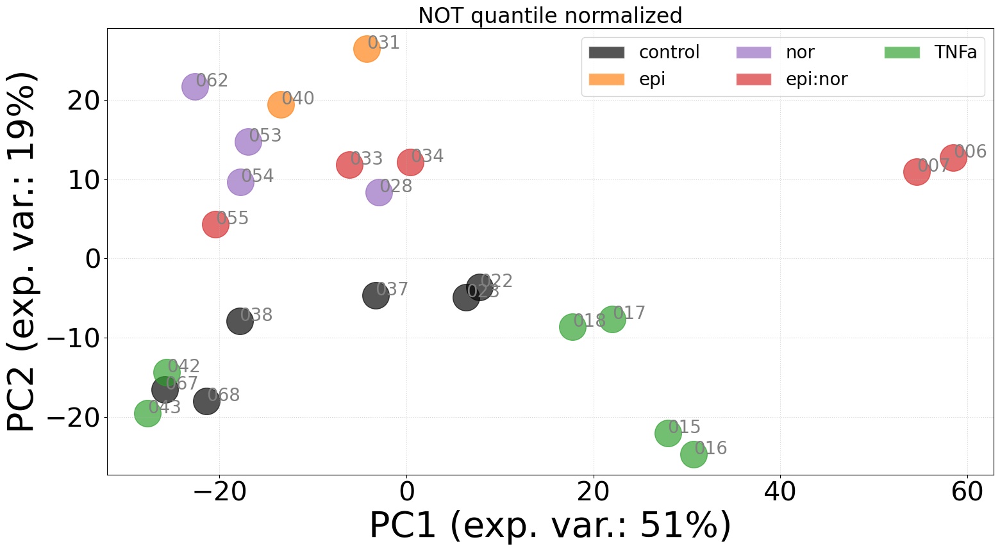

In [40]:
# non-quantile normalized all
transpose = new24.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
        
    if qndf.columns[i] in metadata['24h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['24h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['24h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['24h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['24h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
        
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    
    the_label = new24.columns[i].split('_')[-1]
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label, color='gray')

    
legend_elements = [
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('NOT quantile normalized')

matplotlib.pyplot.tight_layout()

7
['20220905_ARNAR_022', '20220905_ARNAR_023', '20220905_ARNAR_042', '20220905_ARNAR_043', '20220905_ARNAR_006', '20220905_ARNAR_007', '20220905_ARNAR_028']
(1146, 16)
[0.39075559 0.1768133 ]


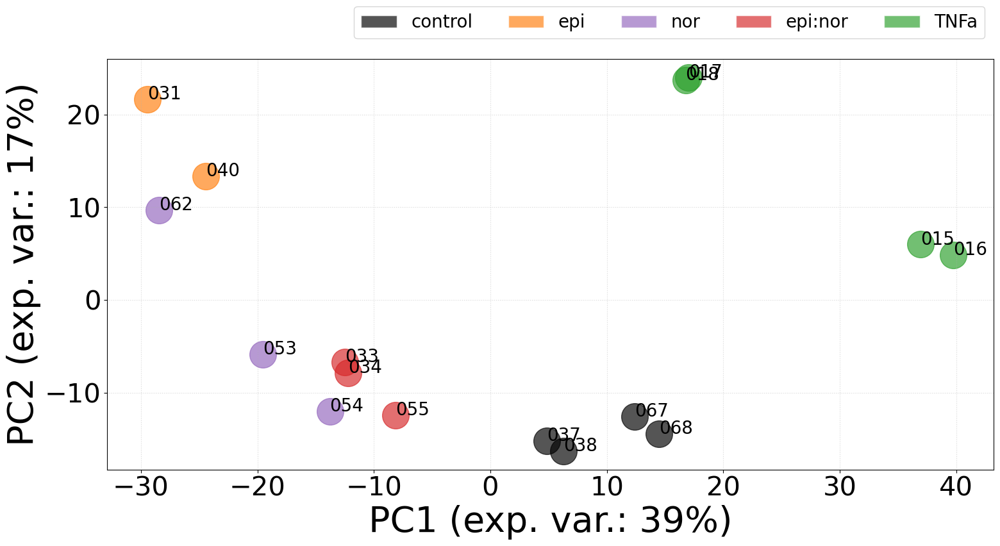

In [41]:
# excluding arbitrary samples
excluded_sample_tags = ['022', '023', '042', '043', '006', '007', '028']
print(len(excluded_sample_tags)) # should be 7
excluded_samples = ['20220905_ARNAR_' + element for element in excluded_sample_tags]
print(excluded_samples)
simplified_df = new24.drop(excluded_samples, axis=1)
print(simplified_df.shape)

# normalization
# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(simplified_df.values, axis=0), index=simplified_df.index, columns=simplified_df.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = simplified_df.rank(method="min").stack().astype(int).map(df_mean).unstack()

# PCA
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
    the_label = qndf.columns[i].split('_')[-1]
        
    if simplified_df.columns[i] in metadata['24h control']:
        the_color = 'black'
    elif simplified_df.columns[i] in metadata['24h epi']:
        the_color = 'tab:orange'
    elif simplified_df.columns[i] in metadata['24h nor']:
        the_color = 'tab:purple'
    elif simplified_df.columns[i] in metadata['24h epinor']:
        the_color = 'tab:red'
    elif simplified_df.columns[i] in metadata['24h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=5, bbox_to_anchor=(1, 1.15))

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
#matplotlib.pyplot.title('quantile normalized post 24 hours')
matplotlib.pyplot.tight_layout()

There is more intra distance within TNFa than across epi:nor and control.
The grouping of different treatmens does not align.

### make comparisons

P before correction 0.0 1.0
7.482056371727804
max fold change 2.5801661797052198


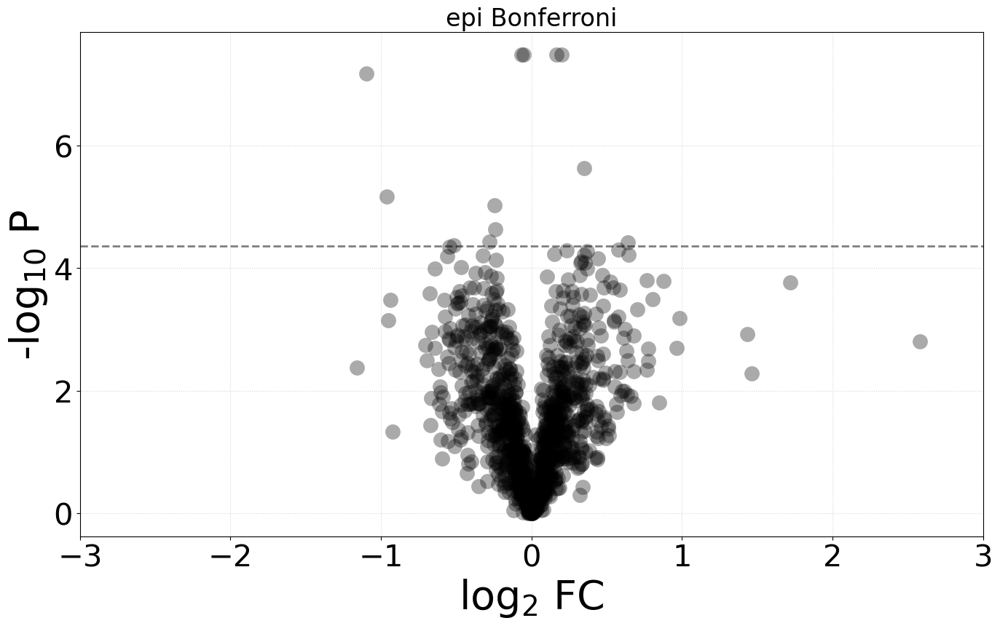

Benjamini-Hochberg correction
epsilon: 5.121841758432451

BIOMAKER
 P05362 ICAM-1 10 1.158920260223384 black 

	 P10321 HLA class I histocompatibility antigen_ C alpha chain [-0.26, 1.44]
	 Q15386 Ubiquitin-protein ligase E3C [1.72, 2.32]
	 Q06323 Proteasome activator complex subunit 1 [-0.40, 2.02]
	 Q9UPS8 Ankyrin repeat domain-containing protein 26 [0.56, 1.33]
	 Q9UKY7 Protein CDV3 homolog [-0.37, 2.05]
	 P01008 Antithrombin-III [2.58, 1.95]
	 P27361 Mitogen-activated protein kinase 3 [-0.96, 2.96]
	 Q9H3U1 Protein unc-45 homolog A [-0.29, 1.43]
	 P09493 Tropomyosin alpha-1 chain [-0.35, 1.32]
	 Q32P28 Prolyl 3-hydroxylase 1 [0.77, 1.89]
	 P61204;P84077;P49703 ADP-ribosylation factor 3 [-0.25, 1.87]
	 P54296 Myomesin-2 [-0.56, 1.80]
	 Q9Y3P9 Rab GTPase-activating protein 1 [0.31, 1.16]
	 O76094 Signal recognition particle subunit SRP72 [0.24, 1.02]
	 P21926 CD9 antigen [0.48, 1.20]
	 O60313 Dynamin-like 120 kDa protein_ mitochondrial [-0.47, 1.32]
	 Q9Y6M1;Q9NZI8 Insulin-like growt

	 P11766 Alcohol dehydrogenase class-3 [-0.68, 2.27]
	 Q6UVJ0 Spindle assembly abnormal protein 6 homolog [0.48, 2.28]
	 P63313 Thymosin beta-10 [-0.40, 1.55]
	 O94826 Mitochondrial import receptor subunit TOM70 [0.34, 1.38]
	 Q9Y5S2 Serine/threonine-protein kinase MRCK beta [0.23, 1.95]
	 P08754 Guanine nucleotide-binding protein G(i) subunit alpha-3 [0.34, 1.75]
	 P49588 Alanine--tRNA ligase_ cytoplasmic [0.24, 1.65]
	 P13693;Q9HAU6 Translationally-controlled tumor protein [-0.31, 2.16]
	 P19623 Spermidine synthase [0.21, 1.44]
	 Q6ZP82 Coiled-coil domain-containing protein 141 [0.30, 1.36]
	 Q15365 Poly(rC)-binding protein 1 [-0.39, 1.33]
	 Q13148 TAR DNA-binding protein 43 [0.24, 1.13]
	 Q96G03 Phosphoglucomutase-2 [0.43, 2.13]
	 P15153;P60763 Ras-related C3 botulinum toxin substrate 2 [-0.35, 1.95]
	 P11216 Glycogen phosphorylase_ brain form [0.64, 2.46]
	 Q92614 Unconventional myosin-XVIIIa [-0.38, 1.65]
	 Q6ZXV5 Protein O-mannosyl-transferase TMTC3 [0.43, 1.23]
	 P12004 Prolifer

	 P05023;P20648 Sodium/potassium-transporting ATPase subunit alpha-1 [-0.24, 2.52]
	 P19105;O14950 Myosin regulatory light chain 12A [-0.31, 1.89]
	 Q10567 AP-1 complex subunit beta-1 [0.85, 1.33]
	 P63261;P60709 Actin_ cytoplasmic 2 [-0.29, 1.02]
	 P11274 Breakpoint cluster region protein [-0.25, 1.70]
	 O95782 AP-2 complex subunit alpha-1 [0.22, 1.03]
	 Q16851 UTP--glucose-1-phosphate uridylyltransferase [0.22, 1.91]
	 P14314 Glucosidase 2 subunit beta [-0.51, 1.67]
	 P07384 Calpain-1 catalytic subunit [0.26, 1.41]
	 Q9Y2B0 Protein canopy homolog 2 [-0.29, 2.18]
	 P06703 Protein S100-A6 [-0.28, 1.39]
	 P60174 Triosephosphate isomerase [-0.23, 2.33]
	 P41250 Glycine--tRNA ligase [0.27, 2.28]
	 A2PYH4 Probable ATP-dependent DNA helicase HFM1 [0.35, 2.44]
	 P51659 Peroxisomal multifunctional enzyme type 2 [-0.30, 1.92]
	 P38646 Stress-70 protein_ mitochondrial [-0.24, 1.89]
	 Q02878 60S ribosomal protein L6 [0.34, 1.16]
	 O75534 Cold shock domain-containing protein E1 [0.22, 1.34]
	 Q9H

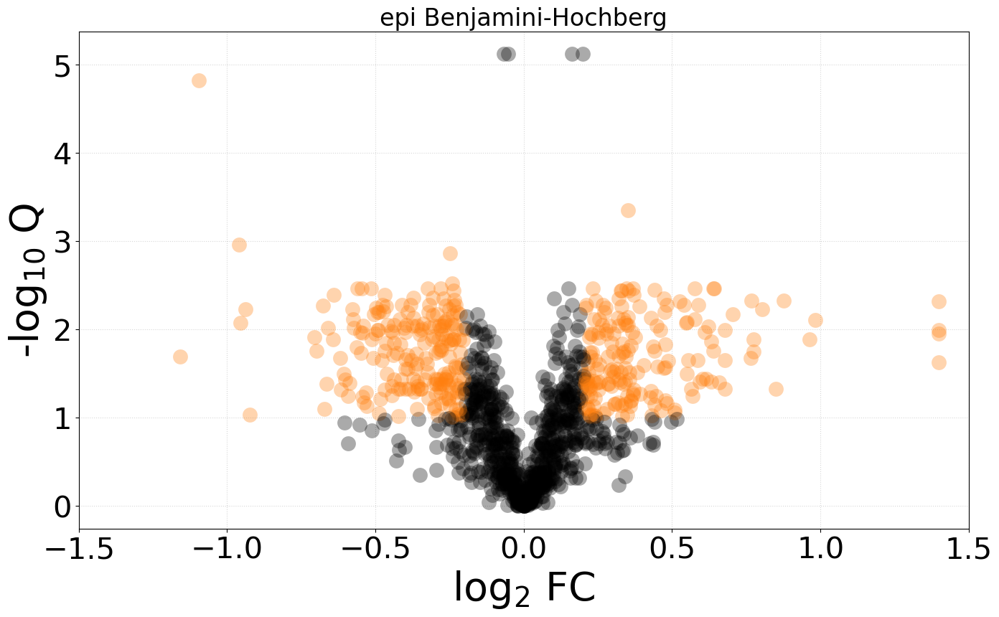

386 proteins respond to treatment


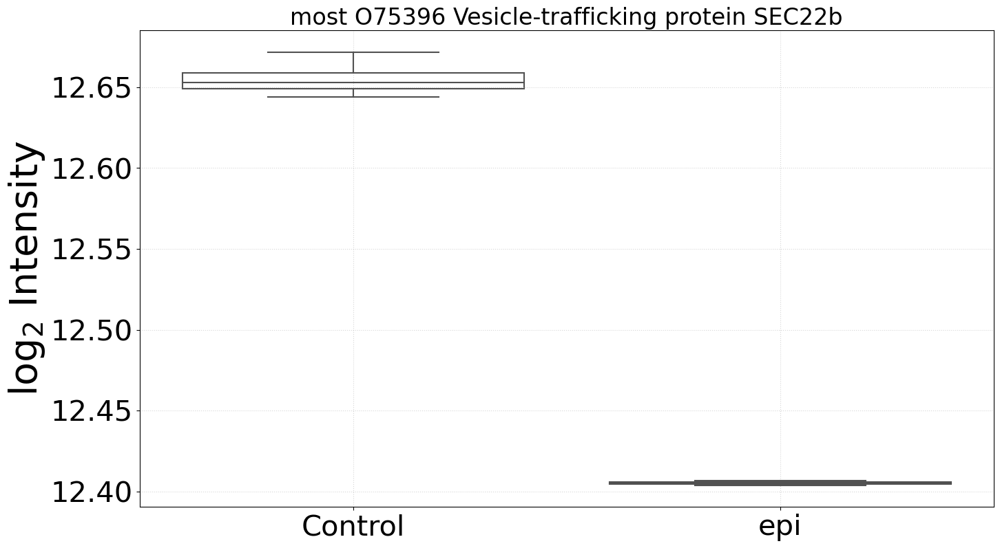

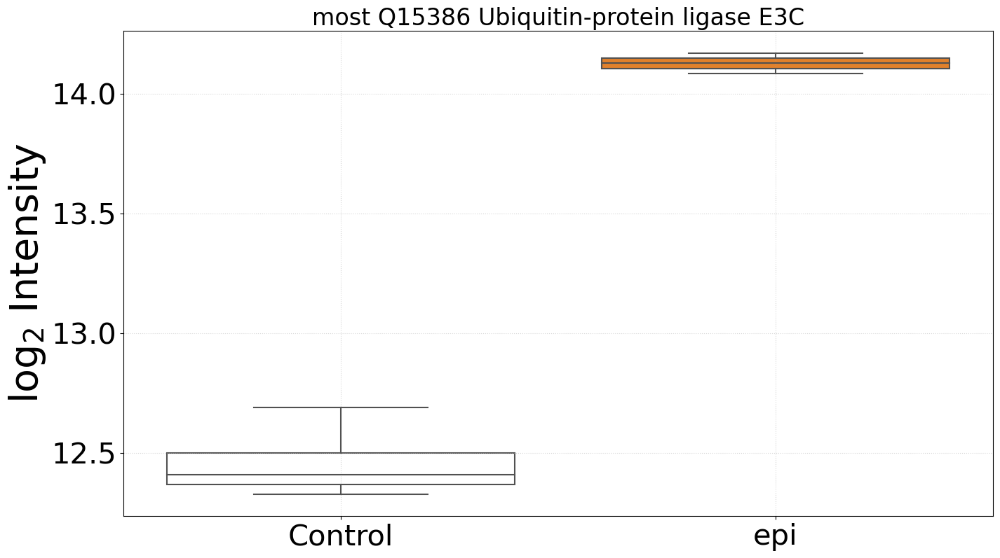

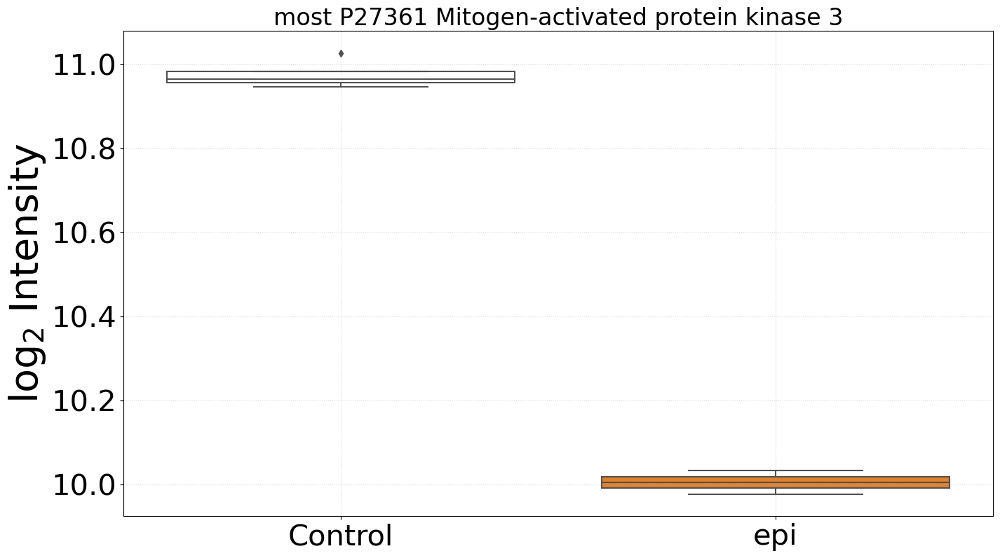

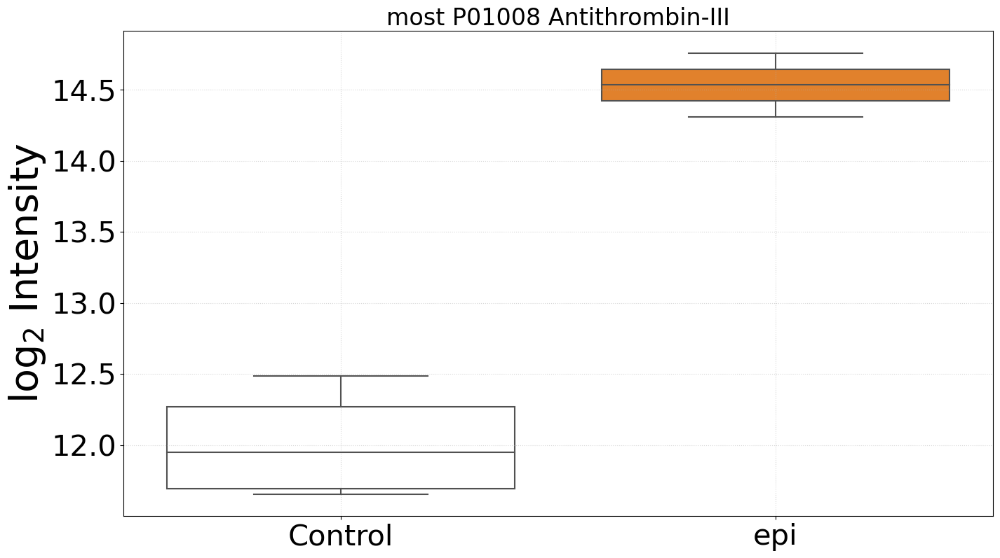

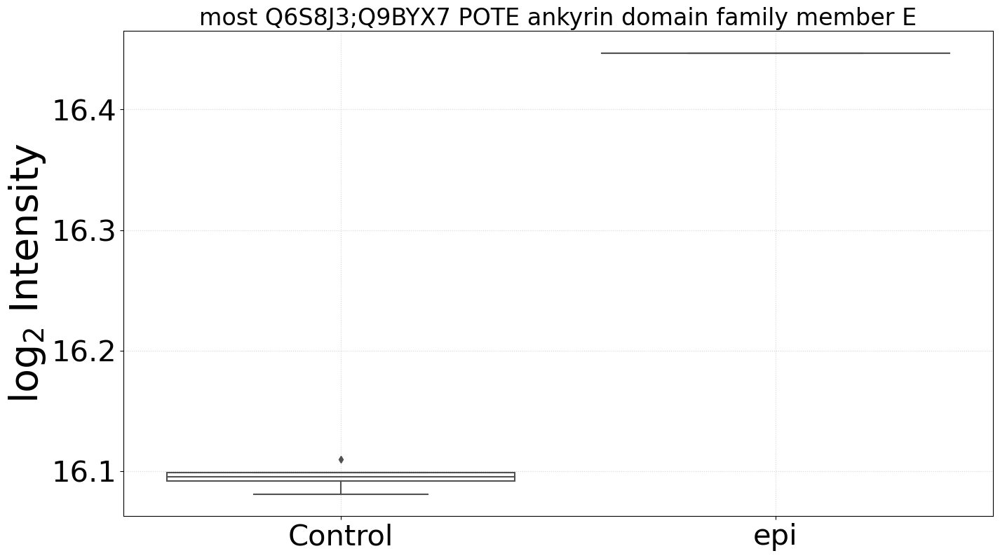

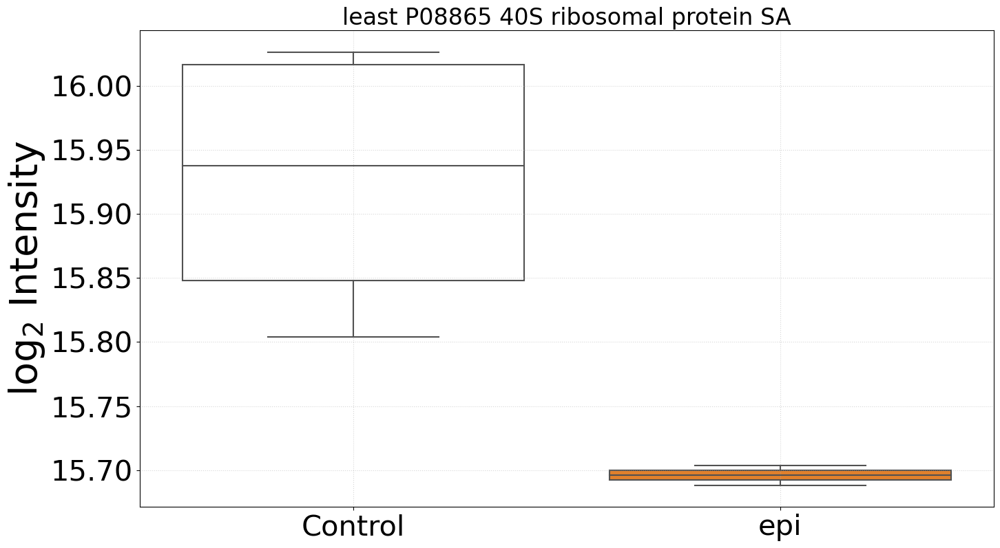

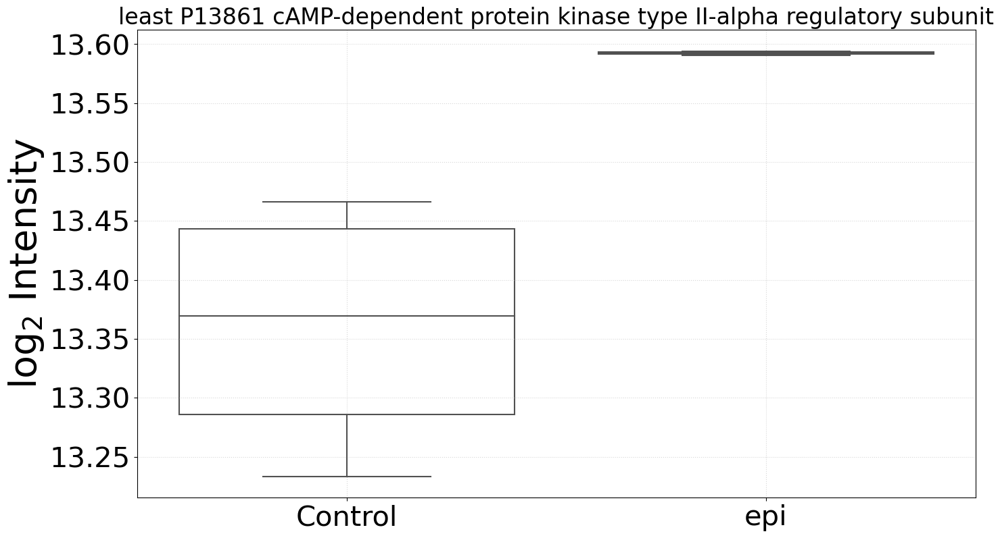

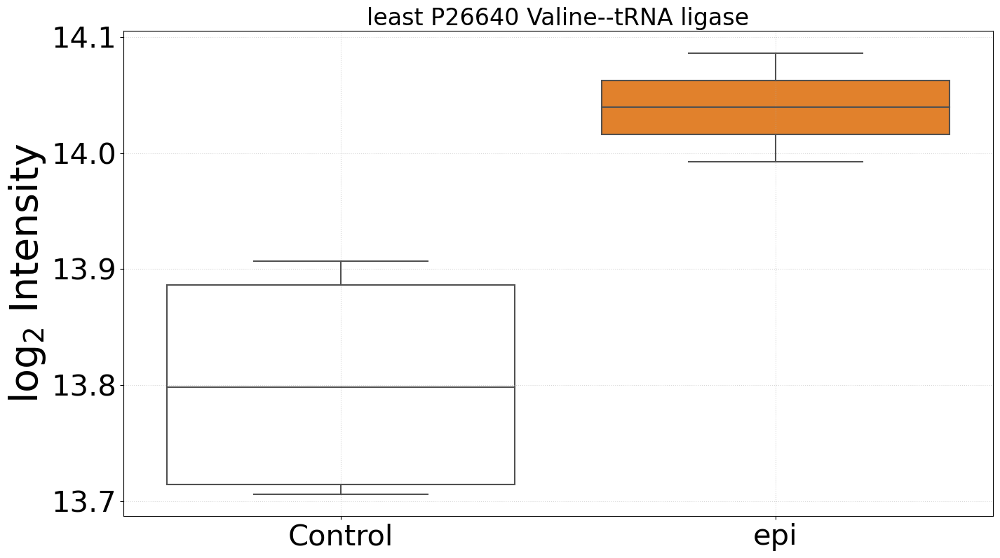

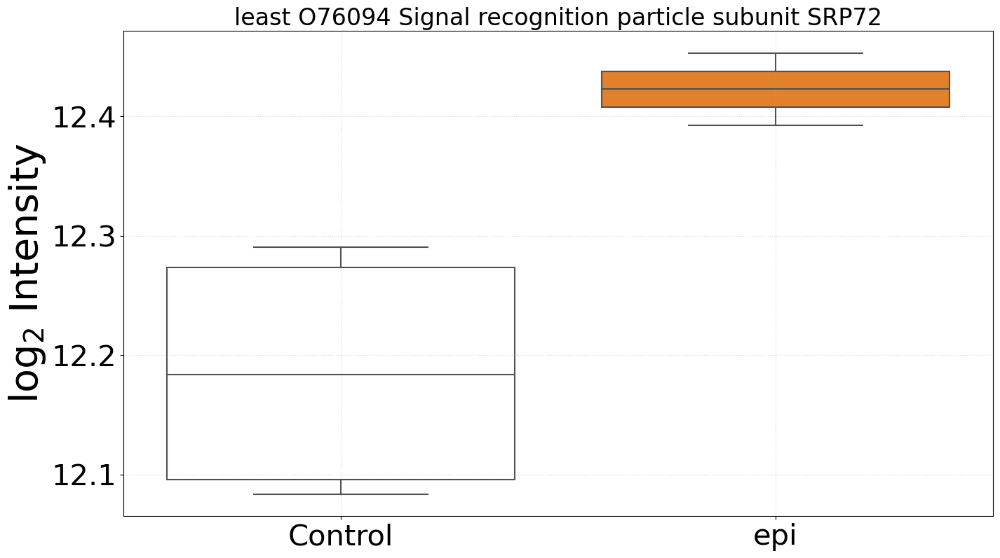

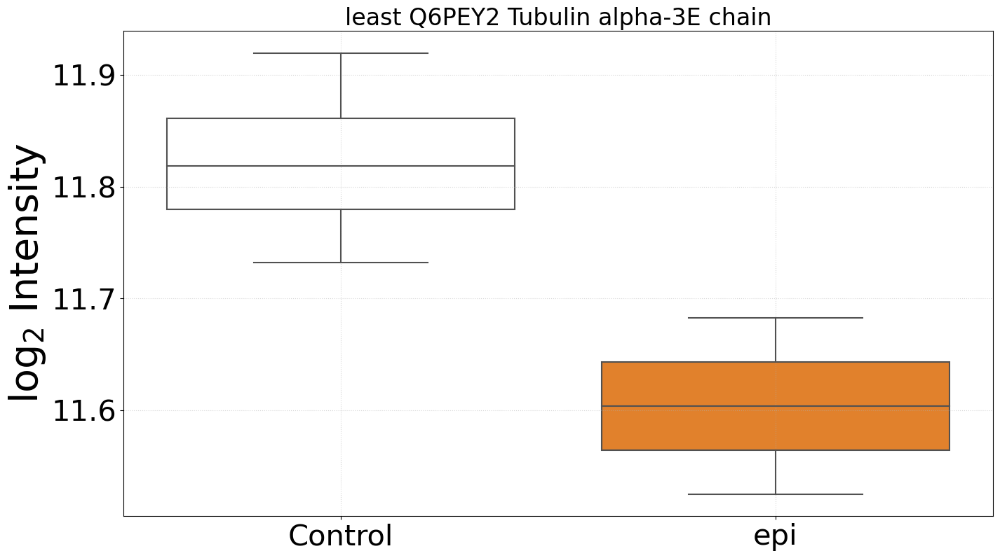

In [42]:
treatment_label = 'epi'
treatment_color = 'tab:orange'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['031', '040']]
epi_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 1.6015871202501687e-07 1.0
7.0964794280529455
max fold change 1.5313017444613752


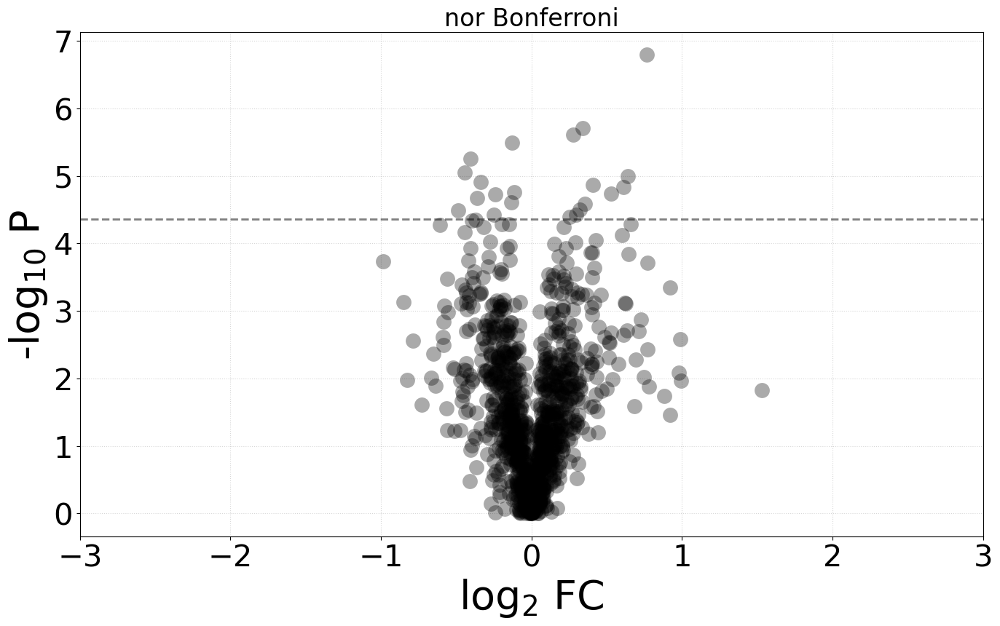

Benjamini-Hochberg correction
epsilon: 4.0372948104215745

BIOMAKER
 P05362 ICAM-1 3 0.7883036807227709 black 

	 Q15386 Ubiquitin-protein ligase E3C [0.99, 1.43]
	 Q06323 Proteasome activator complex subunit 1 [-0.40, 2.24]
	 Q8TCY9 Up-regulator of cell proliferation [-0.24, 1.48]
	 Q9UPS8 Ankyrin repeat domain-containing protein 26 [0.40, 1.56]
	 Q9UKY7 Protein CDV3 homolog [-0.41, 2.46]
	 P01008 Antithrombin-III [1.53, 1.34]
	 P01889 HLA class I histocompatibility antigen_ B alpha chain [-0.56, 1.14]
	 P27361 Mitogen-activated protein kinase 3 [-0.99, 2.35]
	 P09493 Tropomyosin alpha-1 chain [-0.41, 1.85]
	 Q32P28 Prolyl 3-hydroxylase 1 [0.62, 2.05]
	 P61204;P84077;P49703 ADP-ribosylation factor 3 [-0.27, 2.04]
	 P54296 Myomesin-2 [-0.28, 1.40]
	 Q9Y3P9 Rab GTPase-activating protein 1 [0.27, 1.38]
	 O60313 Dynamin-like 120 kDa protein_ mitochondrial [-0.59, 1.89]
	 Q9Y6M1;Q9NZI8 Insulin-like growth factor 2 mRNA-binding protein 2 [0.92, 1.08]
	 P21283 V-type proton ATPase subunit C 

	 O00425 Insulin-like growth factor 2 mRNA-binding protein 3 [0.46, 2.11]
	 O75531 Barrier-to-autointegration factor [-0.27, 1.63]
	 Q5RHP9 Glutamate-rich protein 3 [0.31, 1.43]
	 P63151;Q66LE6 Serine/threonine-protein phosphatase 2A 55 kDa regulatory subunit B alpha isoform [-0.47, 1.42]
	 Q9NZ08 Endoplasmic reticulum aminopeptidase 1 [0.23, 2.18]
	 O75533 Splicing factor 3B subunit 1 [-0.22, 1.54]
	 P16520 Guanine nucleotide-binding protein G(I)/G(S)/G(T) subunit beta-3 [0.39, 2.41]
	 Q12874 Splicing factor 3A subunit 3 [0.31, 1.25]
	 Q8IY37 Probable ATP-dependent RNA helicase DHX37 [0.36, 2.73]
	 Q6S8J3;Q9BYX7 POTE ankyrin domain family member E [0.23, 2.34]
	 P05787 Keratin_ type II cytoskeletal 8 [0.43, 1.57]
	 Q03252 Lamin-B2 [0.24, 1.59]
	 Q5SSJ5 Heterochromatin protein 1-binding protein 3 [-0.22, 1.60]
	 P22307 Sterol carrier protein 2 [0.26, 1.36]
	 P78344 Eukaryotic translation initiation factor 4 gamma 2 [0.28, 2.03]
	 P16402 Histone H1.3 [0.32, 2.68]
	 Q8IZH2 5'-3' exoribon

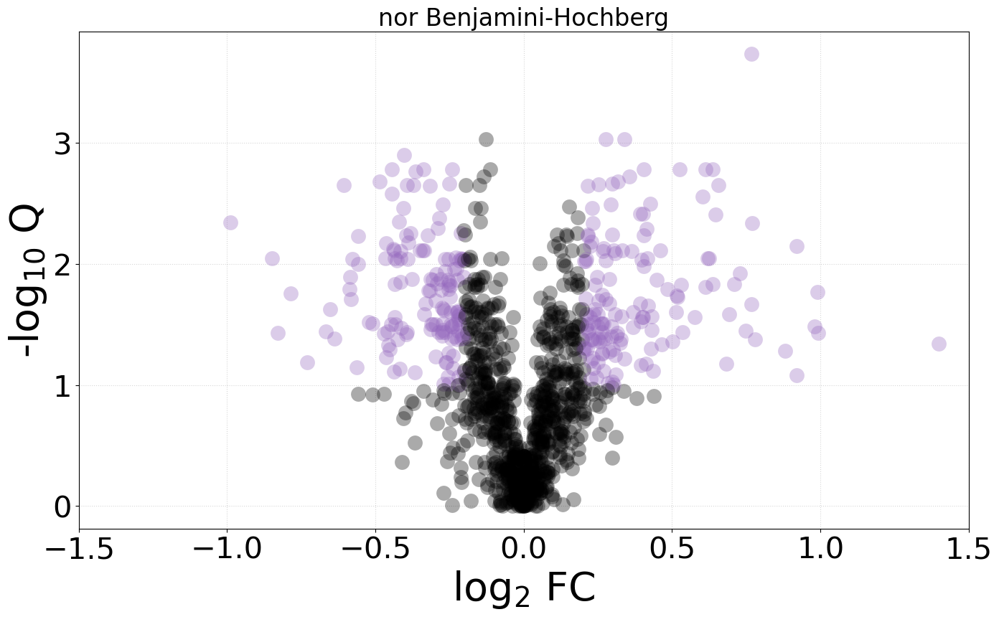

285 proteins respond to treatment


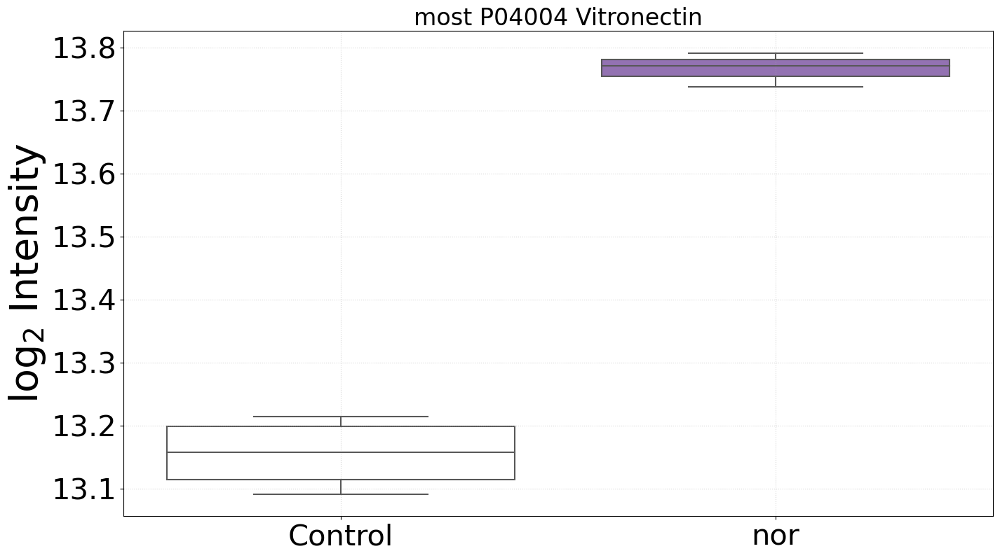

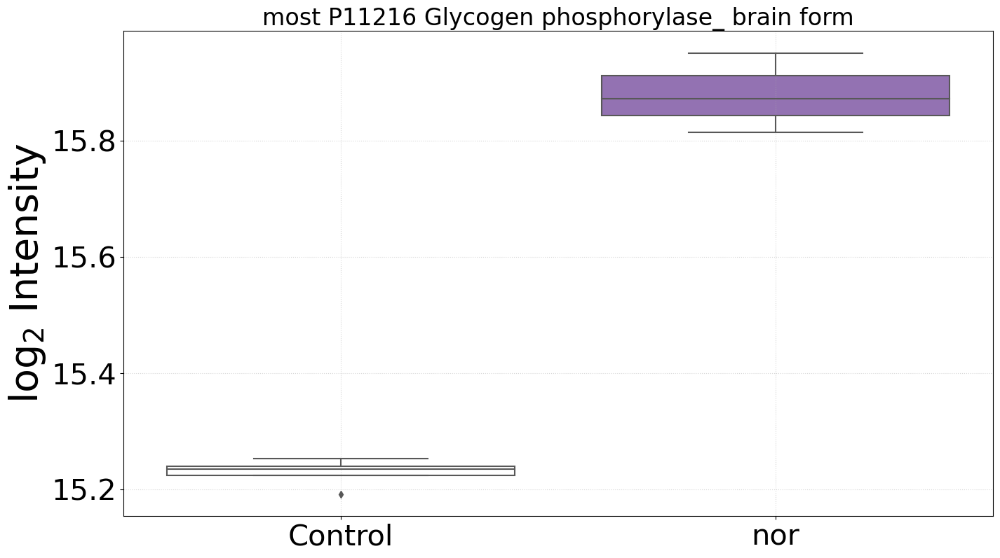

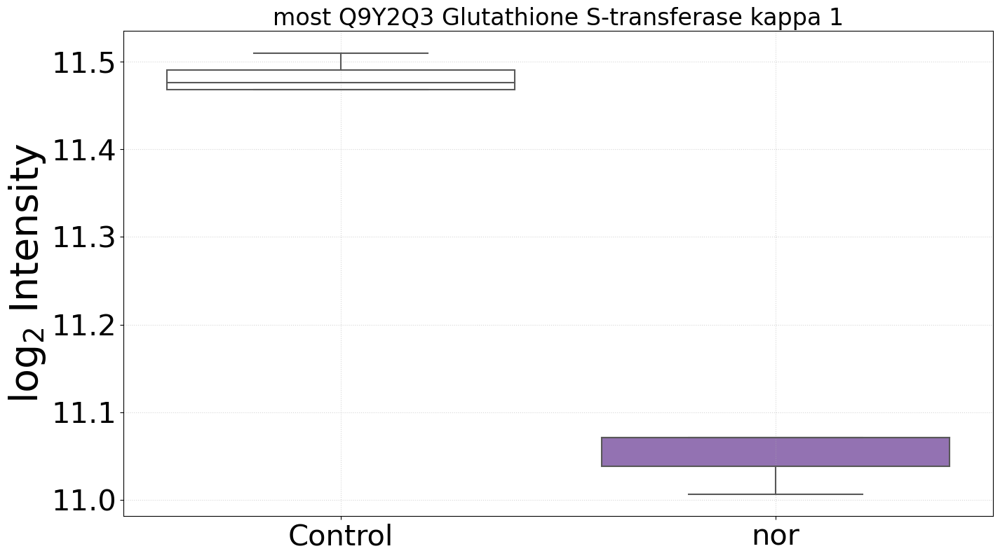

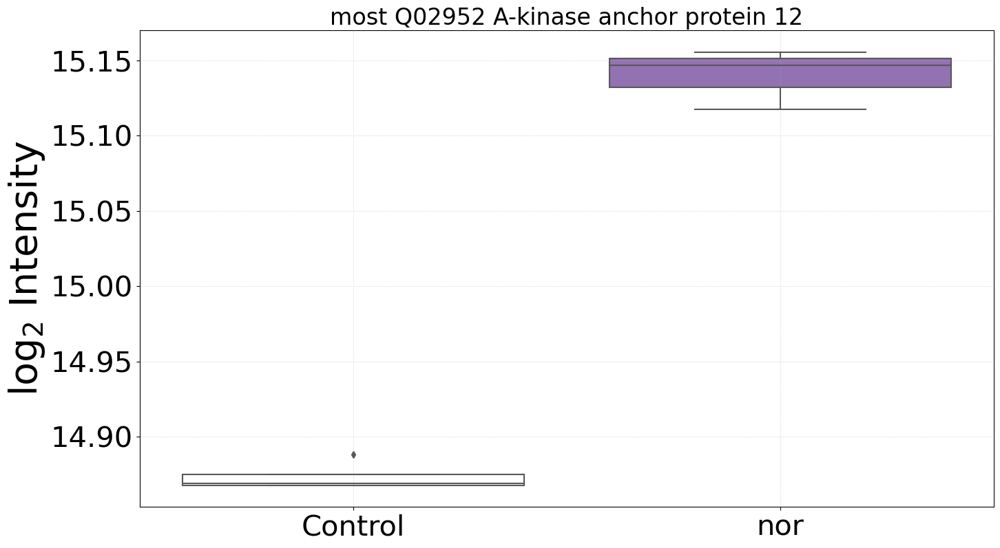

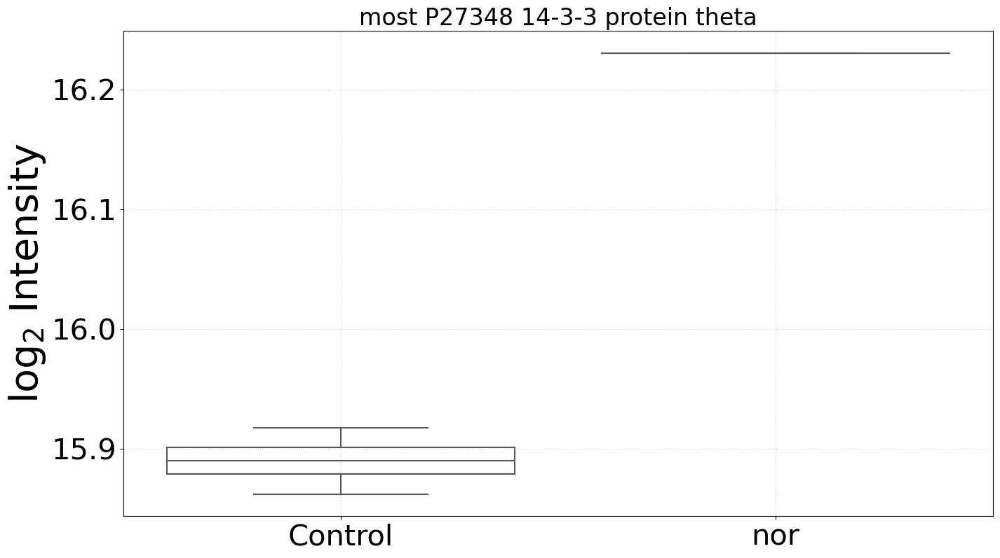

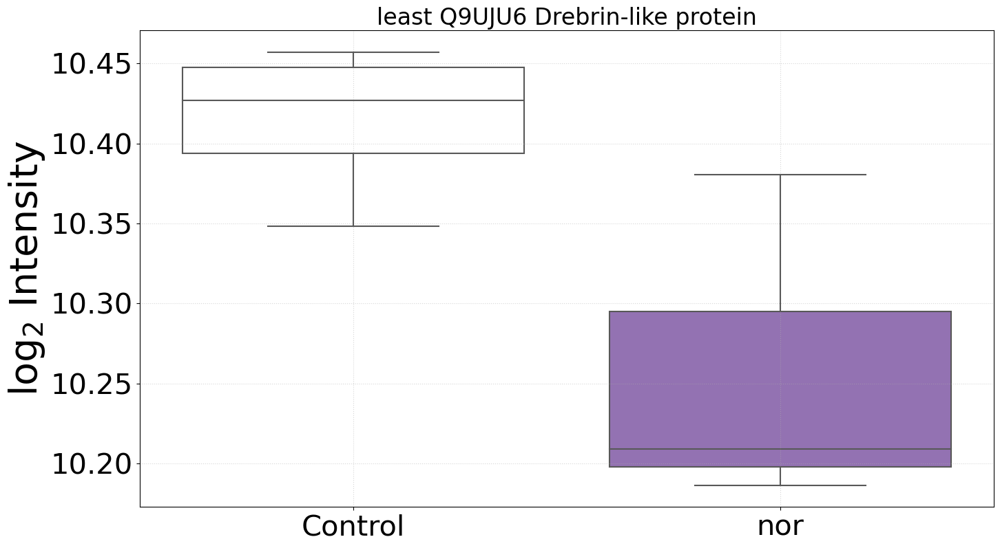

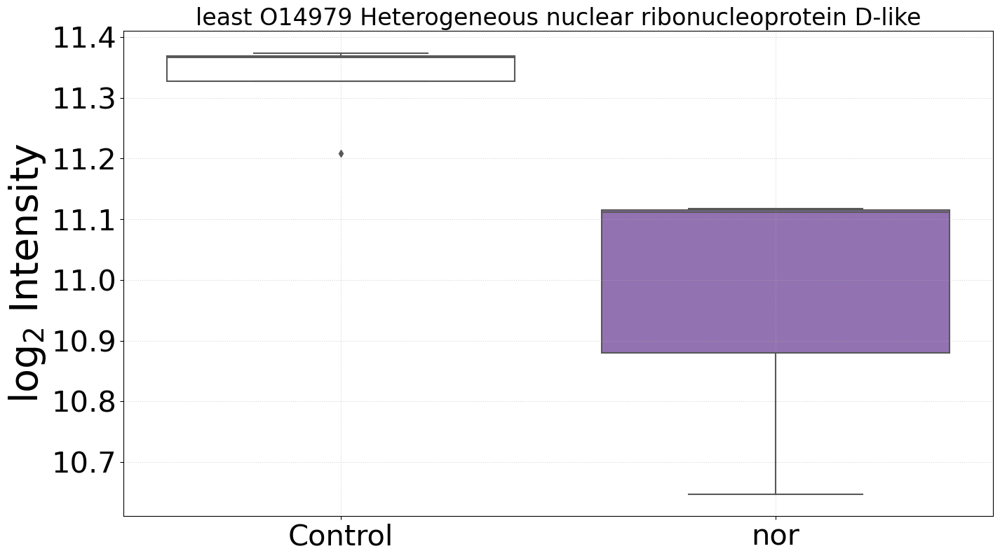

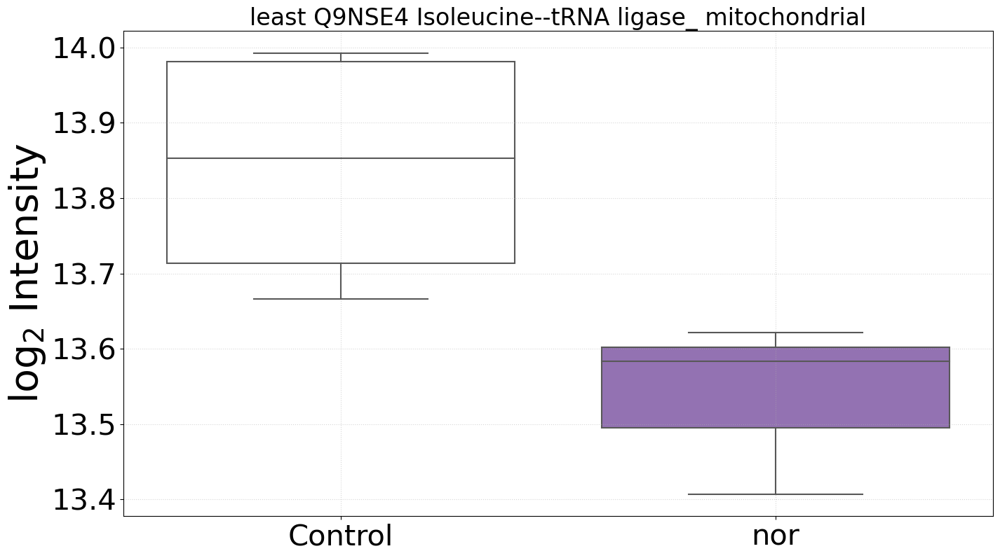

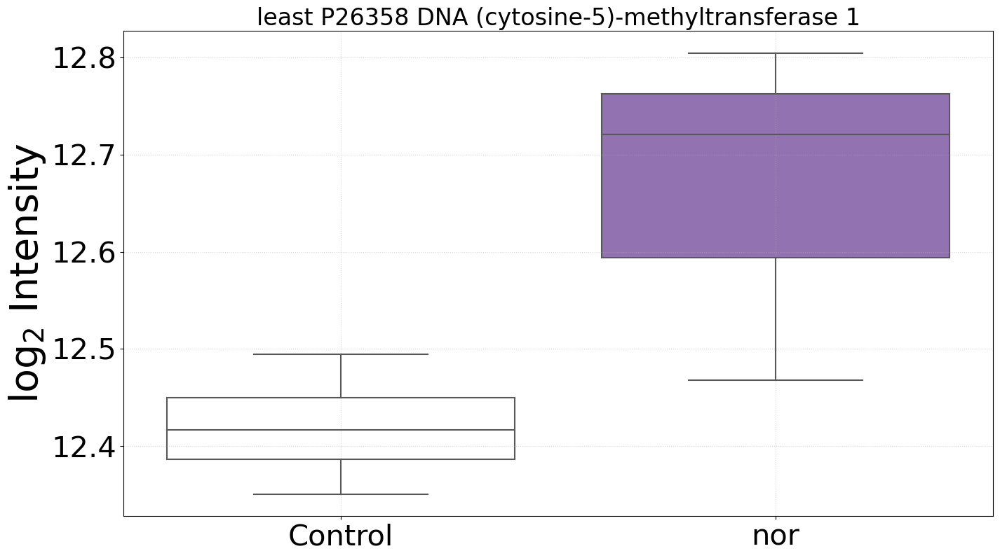

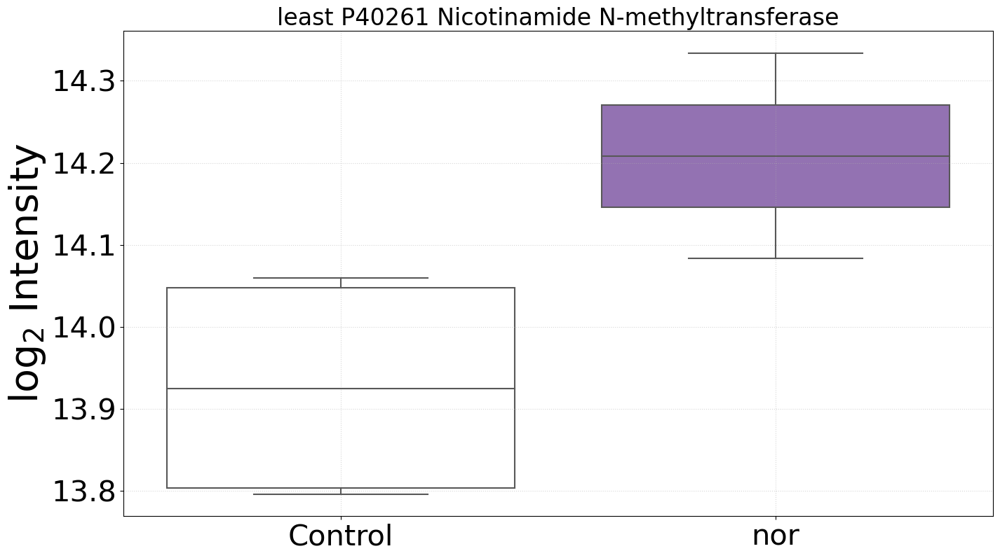

In [43]:
treatment_label = 'nor'
treatment_color = 'tab:purple'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['062', '053', '054']]
nor_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
5.484144234621373
max fold change 1.0381598185675767


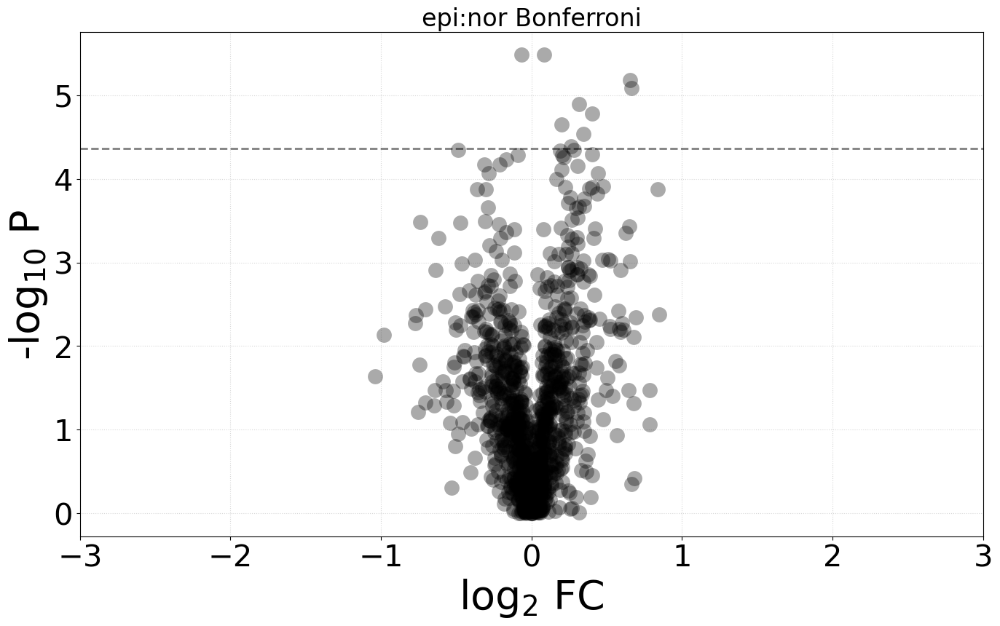

Benjamini-Hochberg correction
epsilon: 2.9300658392245618

BIOMAKER
 P05362 ICAM-1 4 0.7326217609425563 black 

	 Q06323 Proteasome activator complex subunit 1 [-0.24, 1.50]
	 Q92538 Golgi-specific brefeldin A-resistance guanine nucleotide exchange factor 1 [-0.41, 1.64]
	 Q8TCY9 Up-regulator of cell proliferation [0.34, 1.70]
	 Q9UPS8 Ankyrin repeat domain-containing protein 26 [0.34, 1.43]
	 P01889 HLA class I histocompatibility antigen_ B alpha chain [-0.59, 1.06]
	 P27361 Mitogen-activated protein kinase 3 [-0.62, 1.99]
	 P09493 Tropomyosin alpha-1 chain [-0.39, 1.50]
	 Q32P28 Prolyl 3-hydroxylase 1 [0.38, 1.46]
	 O15523 ATP-dependent RNA helicase DDX3Y [0.24, 1.21]
	 P54296 Myomesin-2 [-0.30, 1.40]
	 Q9Y3P9 Rab GTPase-activating protein 1 [0.25, 1.03]
	 O60313 Dynamin-like 120 kDa protein_ mitochondrial [-0.51, 1.44]
	 P21283 V-type proton ATPase subunit C 1 [0.24, 1.58]
	 Q15942 Zyxin [-0.64, 1.77]
	 P14735 Insulin-degrading enzyme [-0.50, 1.41]
	 Q8IVU3 Probable E3 ubiquitin-pro

	 O00469 Procollagen-lysine_2-oxoglutarate 5-dioxygenase 2 [0.21, 1.26]
	 P61769 Beta-2-microglobulin [-0.27, 1.10]
	 P04792 Heat shock protein beta-1 [-0.31, 2.06]
	 Q15056 Eukaryotic translation initiation factor 4H [-0.70, 1.50]
	 O94964 Protein SOGA1 [0.37, 1.26]
	 Q15691 Microtubule-associated protein RP/EB family member 1 [-0.38, 1.83]
	 O75131 Copine-3 [0.27, 1.11]
	 P98174 FYVE_ RhoGEF and PH domain-containing protein 1 [-0.39, 1.46]

BIOMAKER
 P05121 PAI-1 4 0.3543203987145738 black 

	 Q86VH2 Kinesin-like protein KIF27 [-0.23, 1.07]
	 Q9C0A0 Contactin-associated protein-like 4 [0.44, 2.27]
	 P20700 Lamin-B1 [-0.21, 1.16]
	 P27635;Q96L21 60S ribosomal protein L10 [-0.23, 1.03]
	 Q9H7Z3 Nuclear exosome regulator NRDE2 [0.78, 1.00]
	 P13861 cAMP-dependent protein kinase type II-alpha regulatory subunit [0.59, 1.77]
	 P60660 Myosin light polypeptide 6 [-0.22, 2.05]
	 Q9GZV4 Eukaryotic translation initiation factor 5A-2 [-0.31, 1.03]
	 O94979 Protein transport protein Sec31A [-0.2

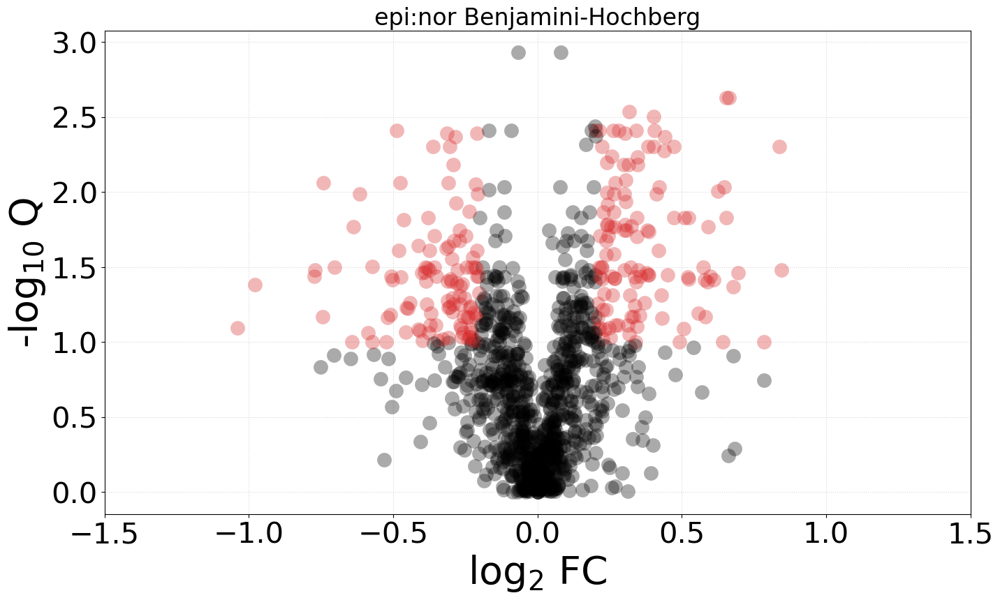

232 proteins respond to treatment


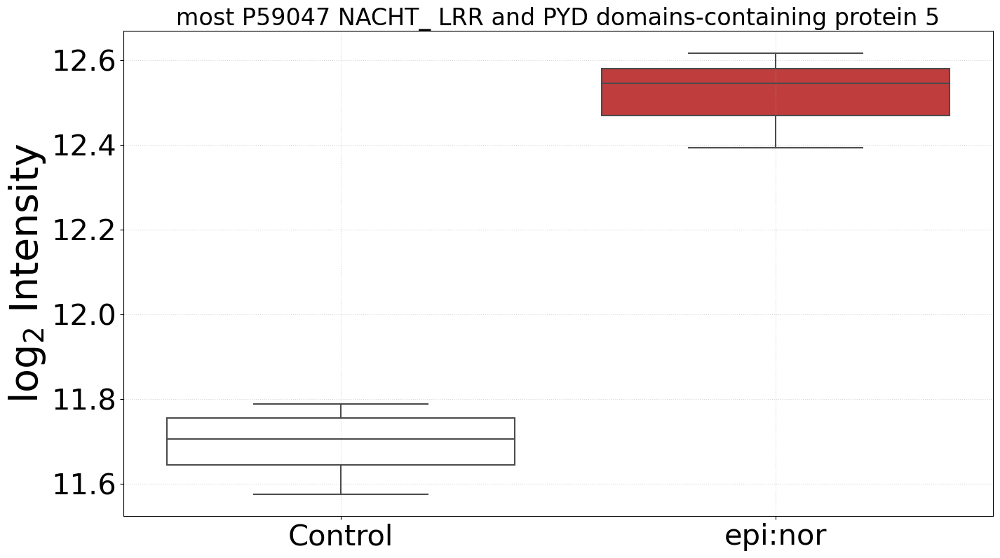

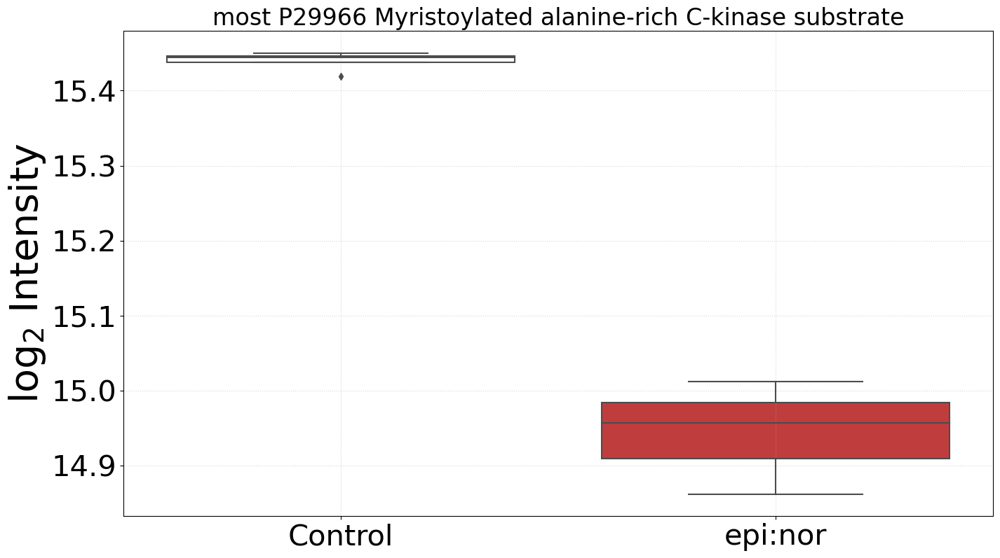

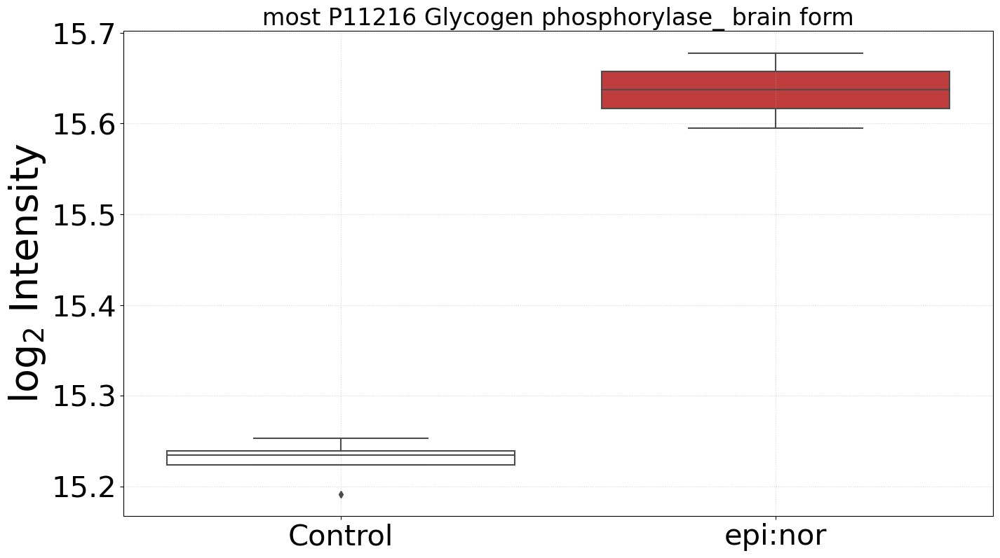

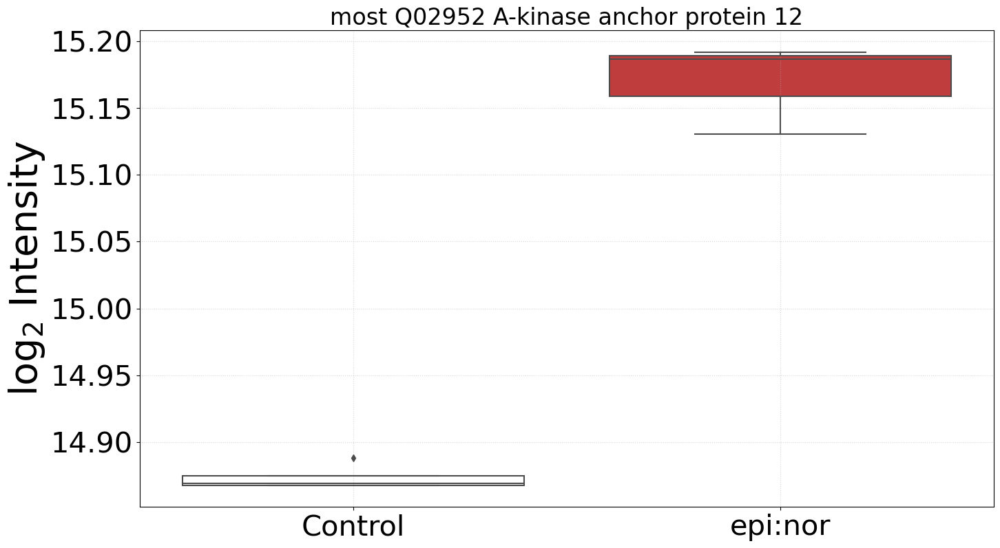

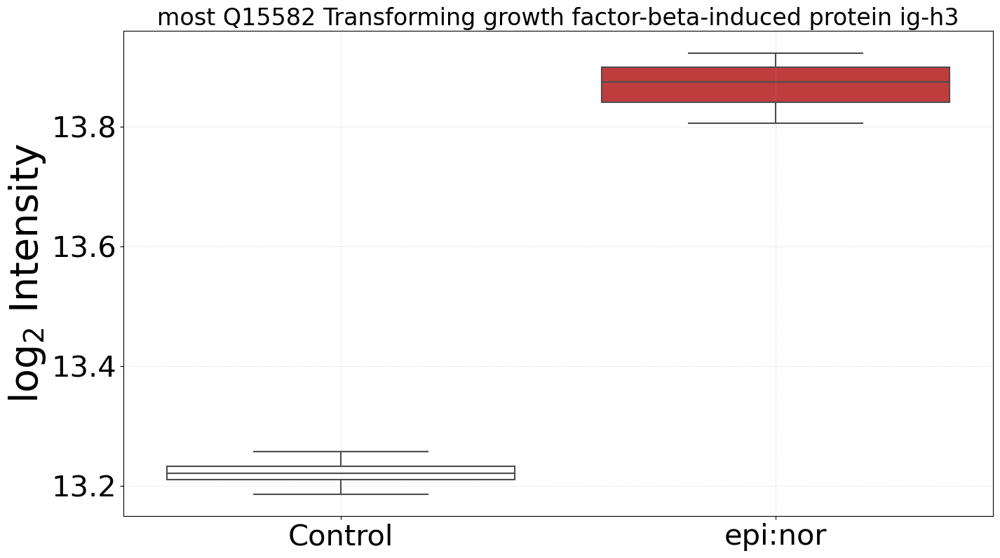

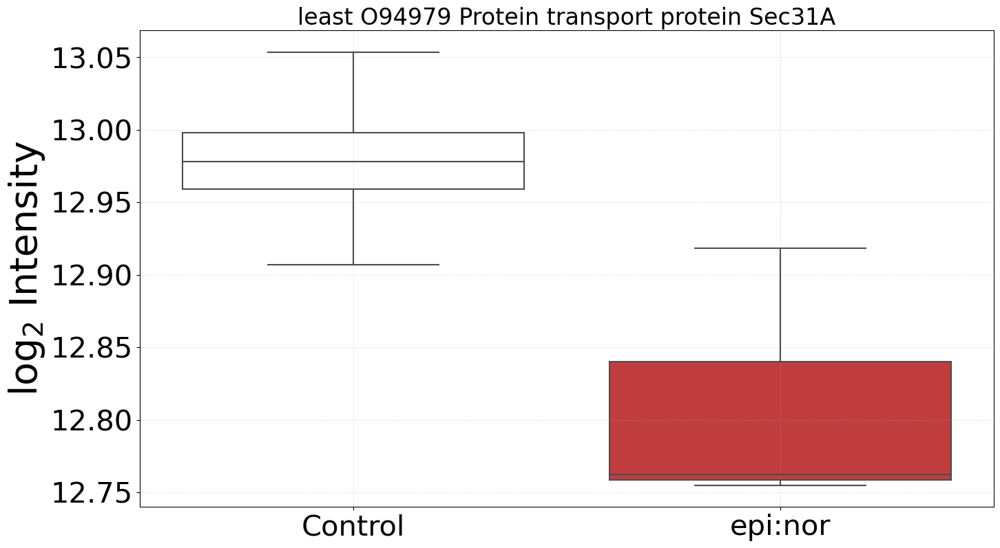

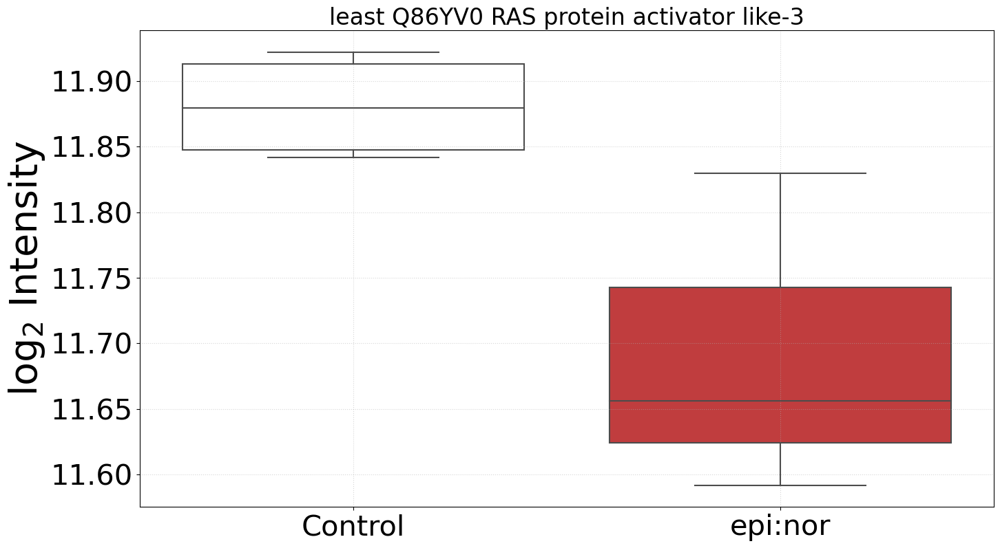

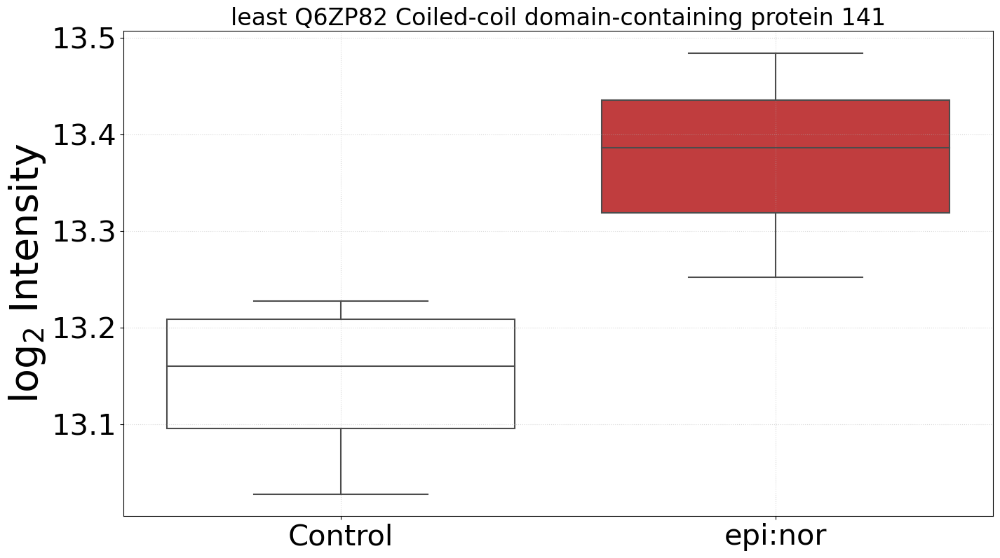

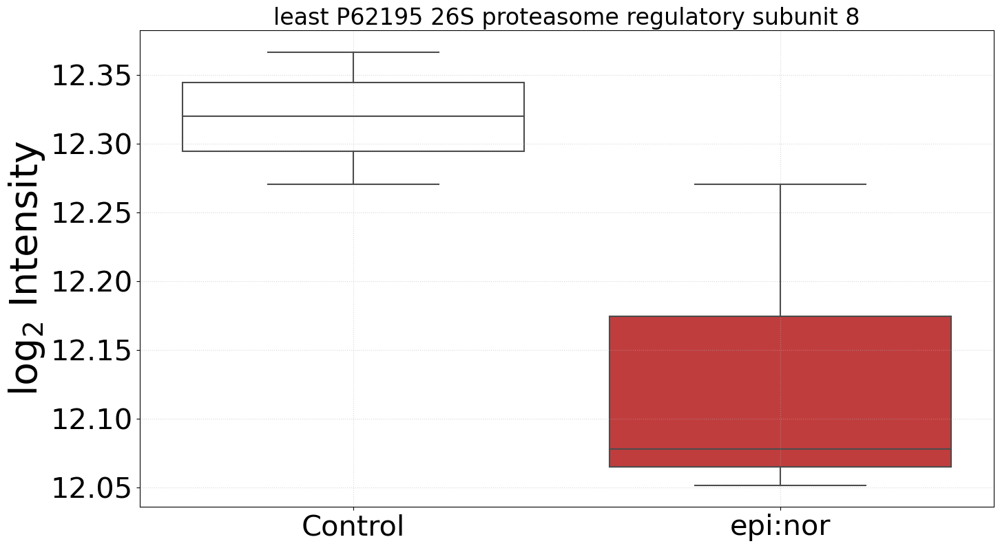

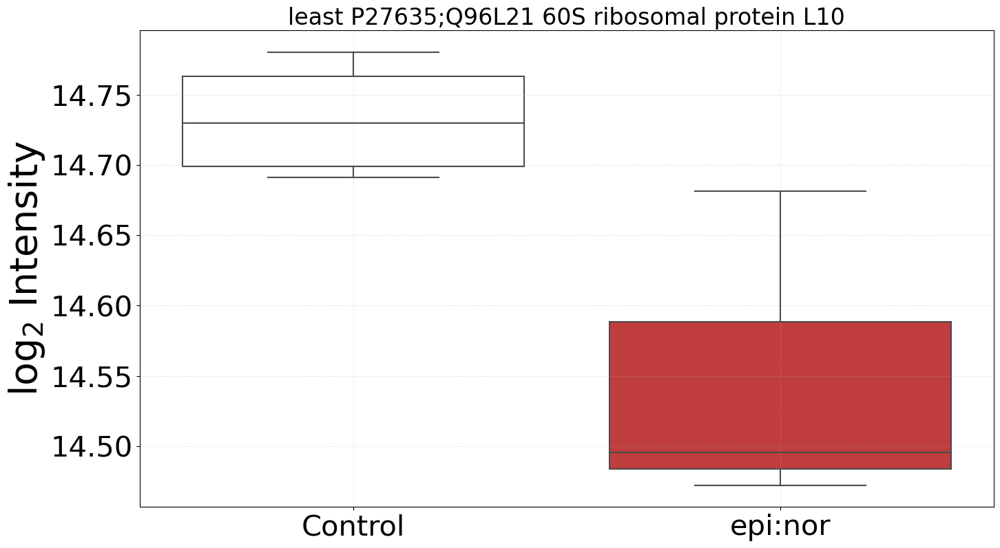

In [44]:
treatment_label = 'epi:nor'
treatment_color = 'tab:red'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['033', '034', '055']]
epinor_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
8.142133601745904
max fold change 3.115098896929263


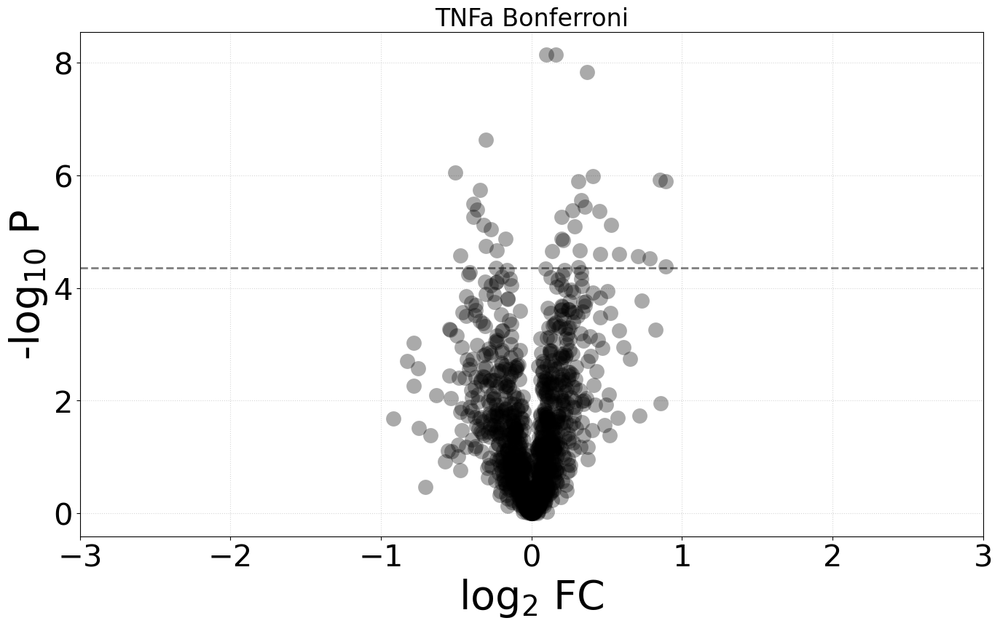

Benjamini-Hochberg correction
epsilon: 5.560070238834195
	 P05362 Intercellular adhesion molecule 1 [3.12, 4.92]

BIOMAKER
 P05362 ICAM-1 163 4.922656361197728 tab:green 

	 P10321 HLA class I histocompatibility antigen_ C alpha chain [0.82, 2.27]
	 Q06323 Proteasome activator complex subunit 1 [0.32, 1.55]
	 Q92538 Golgi-specific brefeldin A-resistance guanine nucleotide exchange factor 1 [0.24, 1.77]
	 Q8TCY9 Up-regulator of cell proliferation [0.89, 3.84]
	 Q9UKY7 Protein CDV3 homolog [0.65, 1.92]
	 P01008 Antithrombin-III [-0.75, 1.09]
	 P49419 Alpha-aminoadipic semialdehyde dehydrogenase [0.61, 2.05]
	 P01889 HLA class I histocompatibility antigen_ B alpha chain [0.72, 1.24]
	 Q9H3U1 Protein unc-45 homolog A [0.29, 1.60]
	 P61204;P84077;P49703 ADP-ribosylation factor 3 [0.20, 1.72]
	 O15523 ATP-dependent RNA helicase DDX3Y [0.73, 2.56]
	 Q8NBJ5 Procollagen galactosyltransferase 1 [0.52, 2.46]
	 P21926 CD9 antigen [-0.64, 1.49]
	 P22694 cAMP-dependent protein kinase catalytic subun

	 P25786 Proteasome subunit alpha type-1 [0.29, 2.46]
	 Q15691 Microtubule-associated protein RP/EB family member 1 [-0.32, 3.38]
	 P52209 6-phosphogluconate dehydrogenase_ decarboxylating [0.27, 3.53]
	 Q96T76 MMS19 nucleotide excision repair protein homolog [0.25, 2.29]

BIOMAKER
 P05121 PAI-1 14 0.2081108000502072 black 

	 P67936 Tropomyosin alpha-4 chain [-0.38, 1.23]
	 Q9UGL1 Lysine-specific demethylase 5B [-0.22, 1.30]
	 Q15257 Serine/threonine-protein phosphatase 2A activator [0.21, 1.93]
	 P62495 Eukaryotic peptide chain release factor subunit 1 [-0.25, 1.68]
	 P61421 V-type proton ATPase subunit d 1 [0.23, 1.30]
	 P61289 Proteasome activator complex subunit 3 [0.20, 2.52]
	 Q9H7Z3 Nuclear exosome regulator NRDE2 [0.39, 1.95]
	 P13861 cAMP-dependent protein kinase type II-alpha regulatory subunit [0.27, 1.61]
	 Q2VIR3;P41091 Eukaryotic translation initiation factor 2 subunit 3B [0.30, 1.82]
	 Q14257 Reticulocalbin-2 [-0.25, 1.46]
	 P62736;P63267;Q9UBZ9 Actin_ aortic smooth mus

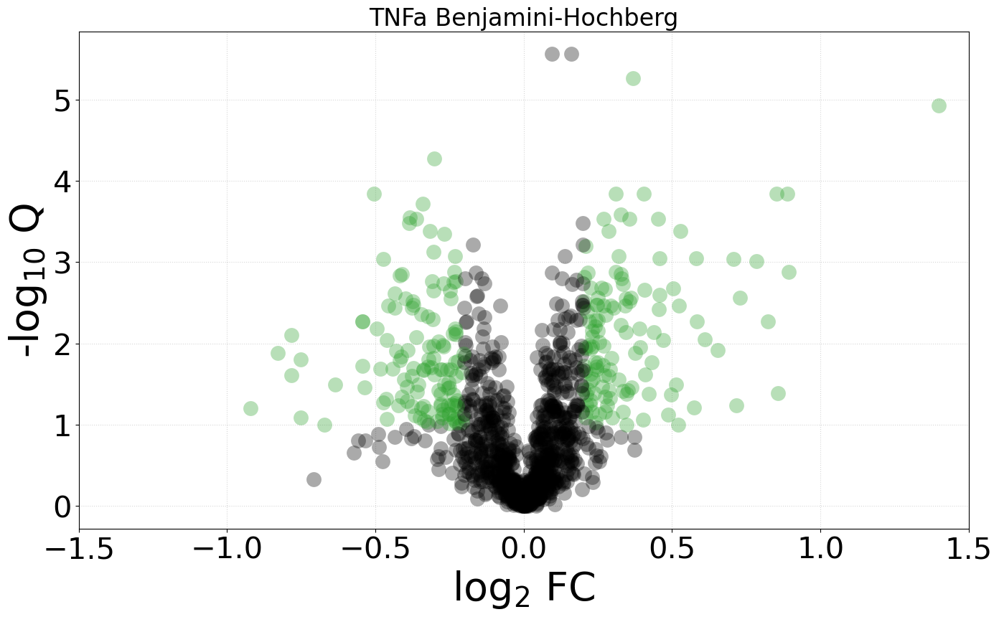

248 proteins respond to treatment


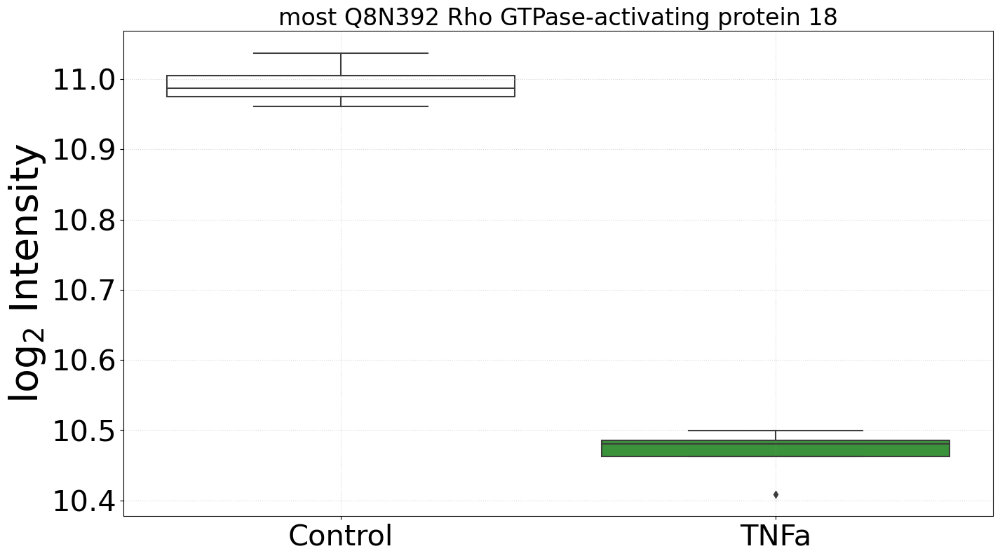

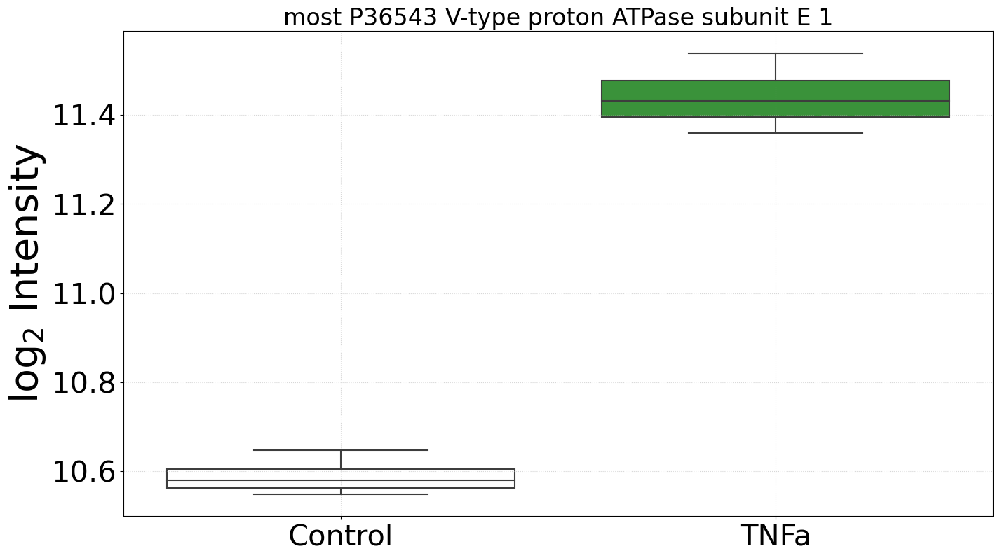

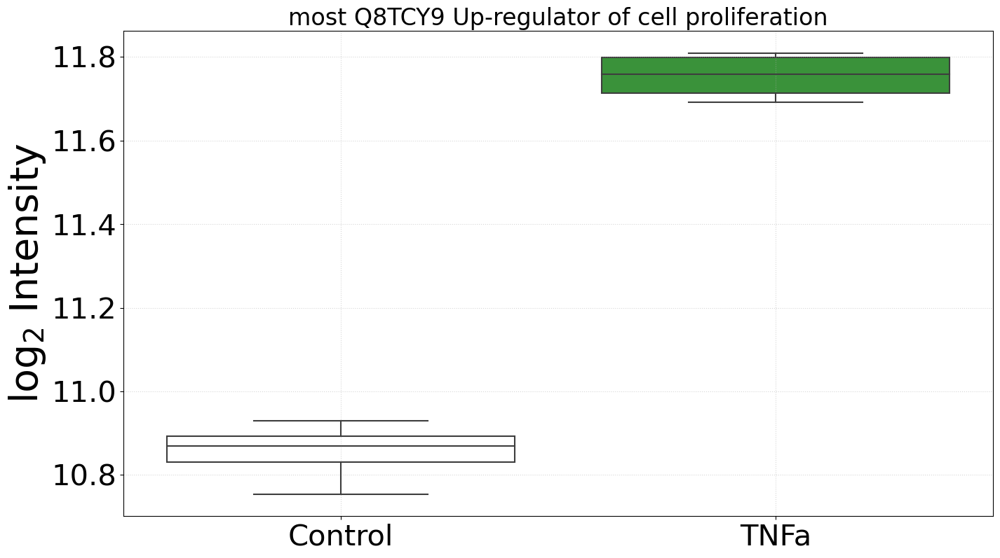

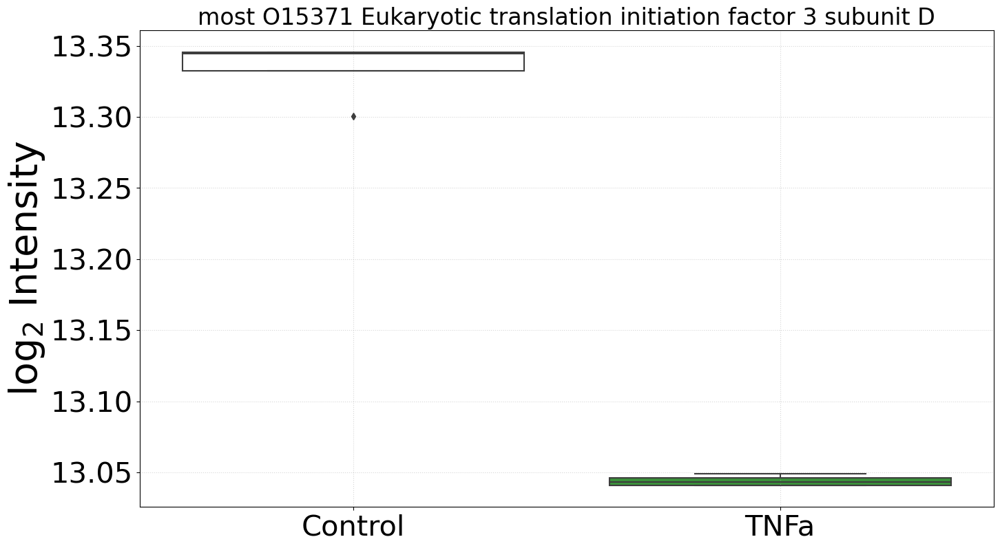

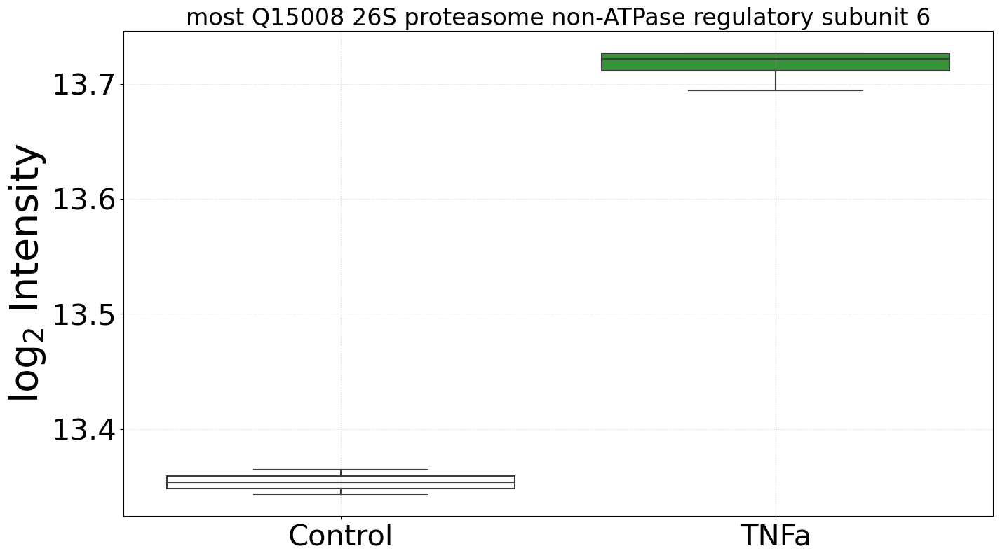

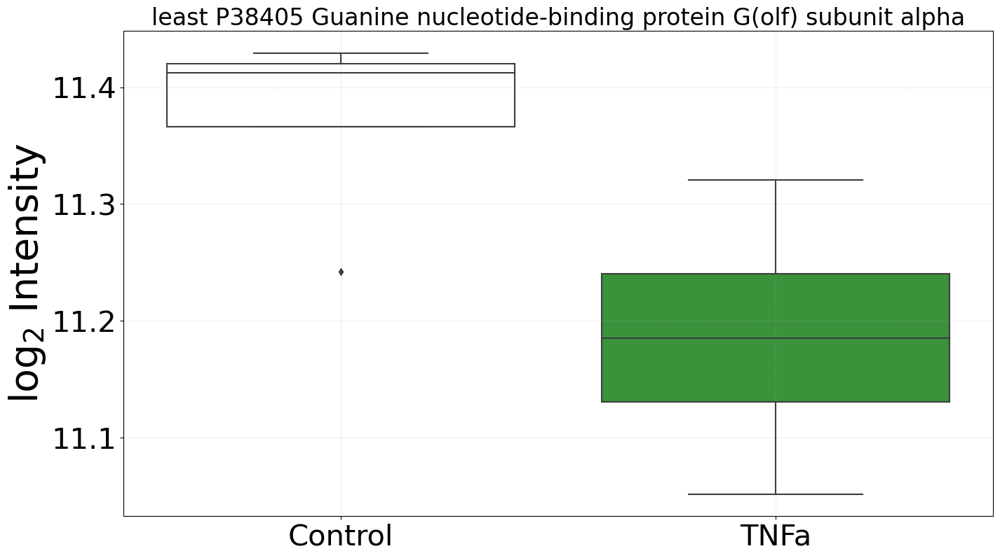

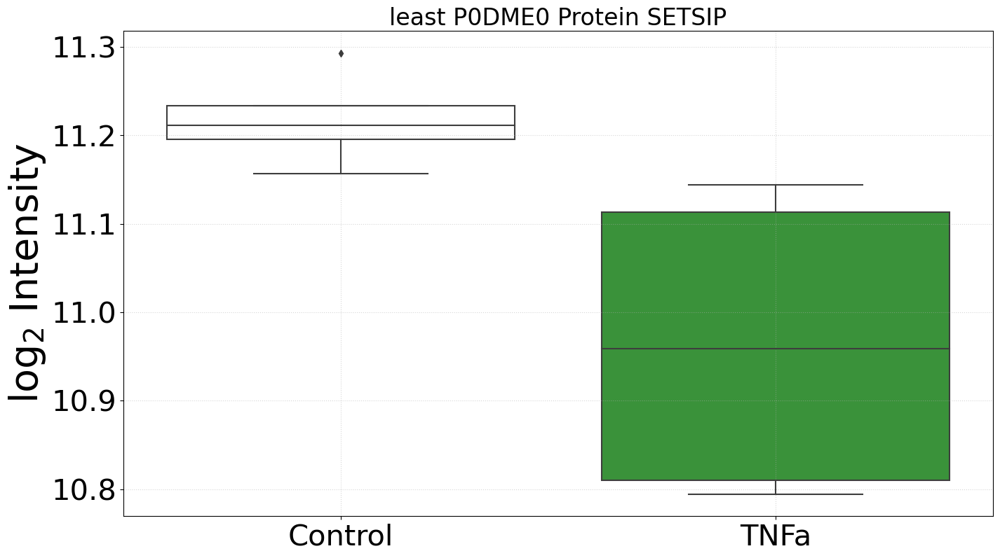

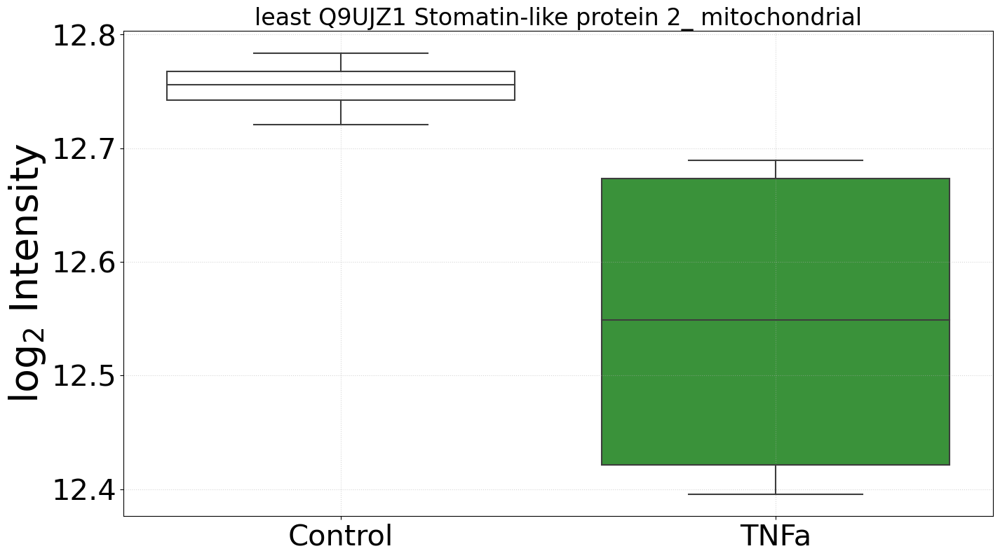

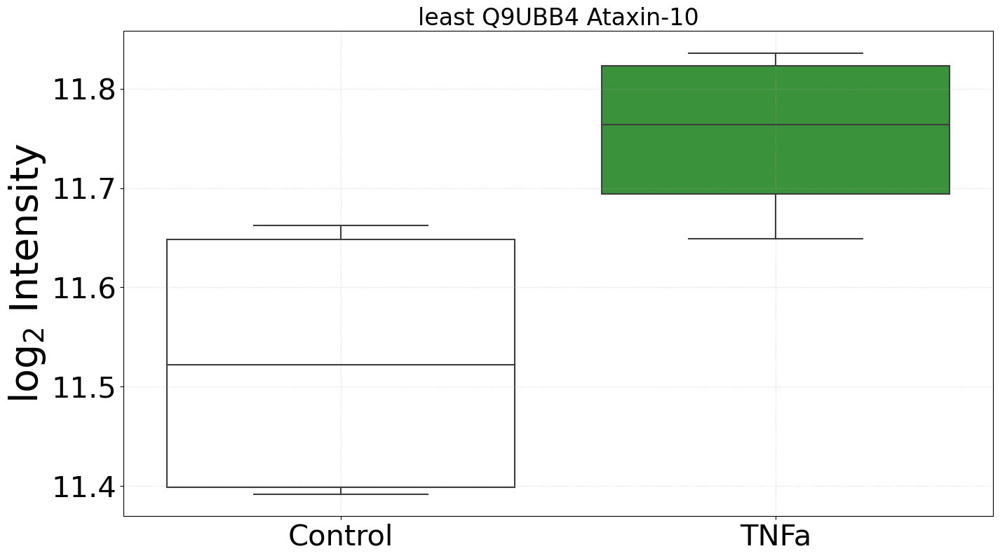

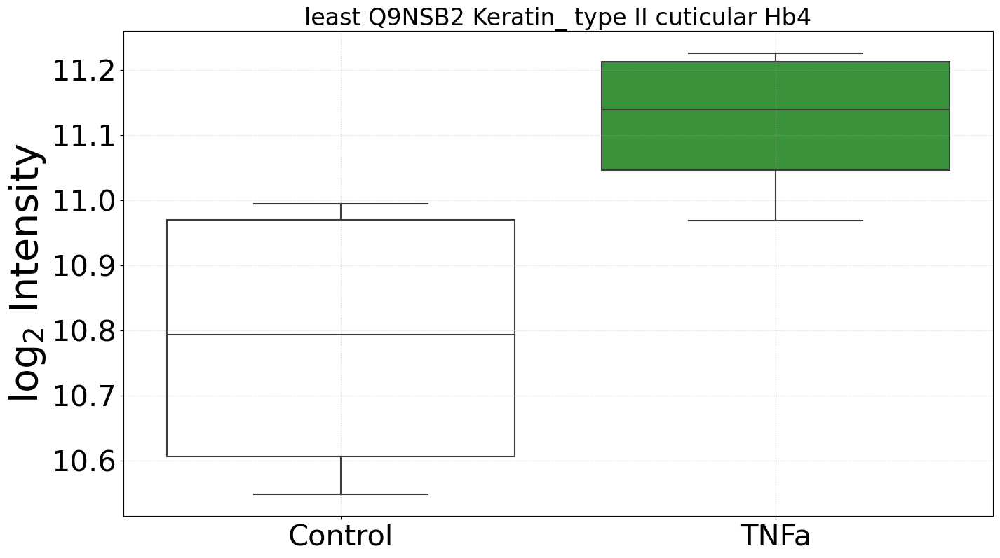

In [45]:
treatment_label = 'TNFa'
treatment_color = 'tab:green'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['017', '018', '015', '016']]
tnfa_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

### Venn diagram of treatmens

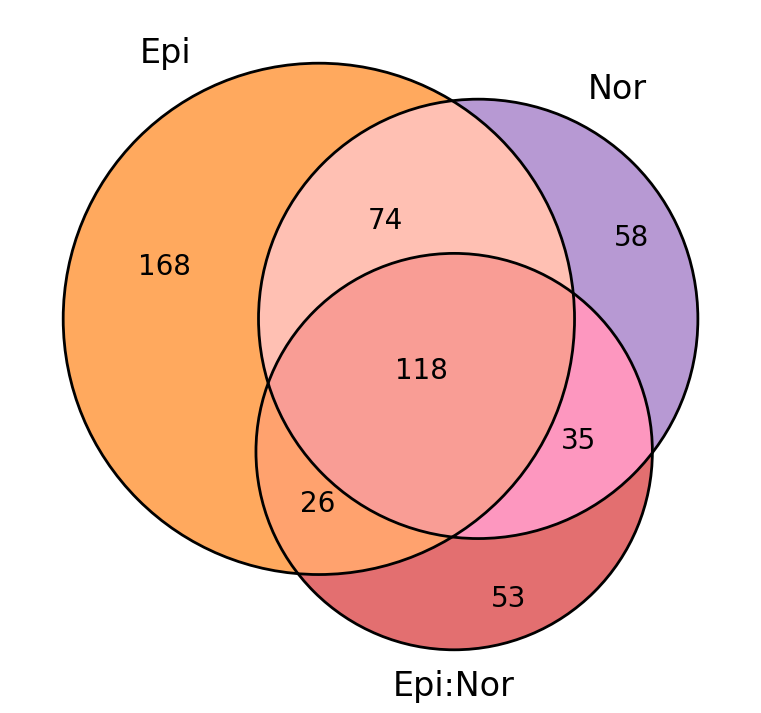

In [46]:
matplotlib_venn.venn3(
    [set(epi_response), set(nor_response), set(epinor_response)], 
    set_labels=('Epi', 'Nor', 'Epi:Nor'),
    set_colors=('tab:orange', 'tab:purple', 'tab:red'),
    alpha=2/3
)
matplotlib_venn.venn3_circles(
    [set(epi_response), set(nor_response), set(epinor_response)],
    linewidth=2
)
matplotlib.pyplot.show()

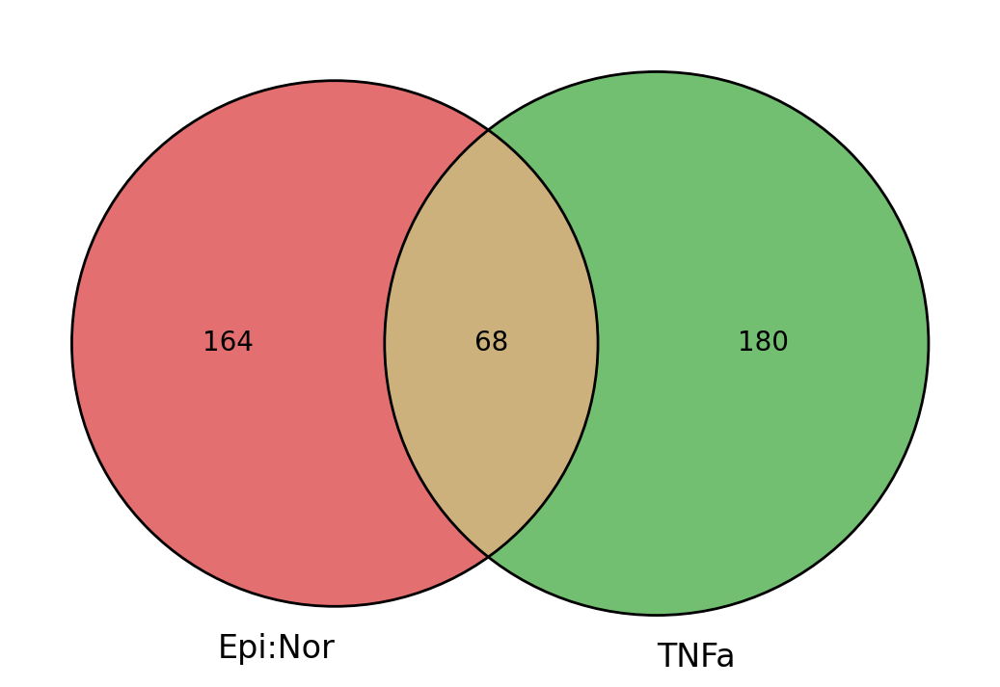

In [47]:
matplotlib_venn.venn2(
    [set(epinor_response), set(tnfa_response)], 
    set_labels=('Epi:Nor', 'TNFa'),
    set_colors=('tab:red', 'tab:green'),
    alpha=2/3
)
matplotlib_venn.venn2_circles(
    [set(epinor_response), set(tnfa_response)],
    linewidth=2
)
matplotlib.pyplot.show()